<a href="https://colab.research.google.com/github/DATA601-CustSegment-Nov2025-to-Feb2026/New-CustSegment-Project/blob/Tony_preprocessing/Customer_Segmentation_(Clustering_Algorithms_Model_1_Model_32_Benjamin).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries & Load Datasets

In [1]:
# Install necessary libraries
!pip install git+https://github.com/FelSiq/DBCV
!pip install hdbscan

# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib, os
import dbcv
import hdbscan
import plotly.express as px
import warnings

from functools import reduce
from scipy.stats import chi2_contingency, entropy
from sklearn.preprocessing import PowerTransformer, StandardScaler, RobustScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import linkage, dendrogram

from google.colab import drive

  Cloning https://github.com/FelSiq/DBCV to /tmp/pip-req-build-3a1t_dy1
  Running command git clone --filter=blob:none --quiet https://github.com/FelSiq/DBCV /tmp/pip-req-build-3a1t_dy1
  Resolved https://github.com/FelSiq/DBCV to commit 13c3896ef78d12f1e3e1cbd394f2db9a09637ffd
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for dbcv: filename=dbcv-0.1.1-py3-none-any.whl size=6667 sha256=b14e66bcaa4b8540f2a3ad131309effe93b73fc0acb483e34bb67c1c18dca1e9
  Stored in directory: /tmp/pip-ephem-wheel-cache-x6vjtzq5/wheels/e4/c0/55/b233329a5a47c9f54996729cf3c8166850a51f37b0aa911081
Successfully built dbcv


/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.


In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Paths to the household profile dataset stored in Google Drive
household_profile_path = '/content/drive/MyDrive/0. Colab Notebooks (DATA 60X Project)/2. Preprocessed Datasets/customer_segmentation_after_preprocessing.csv'

# Read the dataset from its CSV file
household_profile_df = pd.read_csv(household_profile_path, low_memory=False)

# Create a copy to inverse the scaling, transformation and encoding
inverse_household_profile_df = household_profile_df.copy()

In [4]:
# Show all columns
pd.set_option('display.max_columns', None)

# Display first 5 rows of the dataset
household_profile_df.head(5)

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511
4,16,0.0,0.000000,-0.5,0.0,1.192513,-0.448174,-1.235709,-1.055914,-1.273896,1.273896,-0.300252,-0.607878,0.607878,0.115384,-0.968430,0.085717,1.146129,0.813866,0.126961,1.618363,-3.908189,0.492382,-0.492382,0.152564,2.071352,0.166213,1.415026,1.086591,-0.864491,1.165722,1.238202,1.401472,-3.320718


# Check Correlation Between Variables

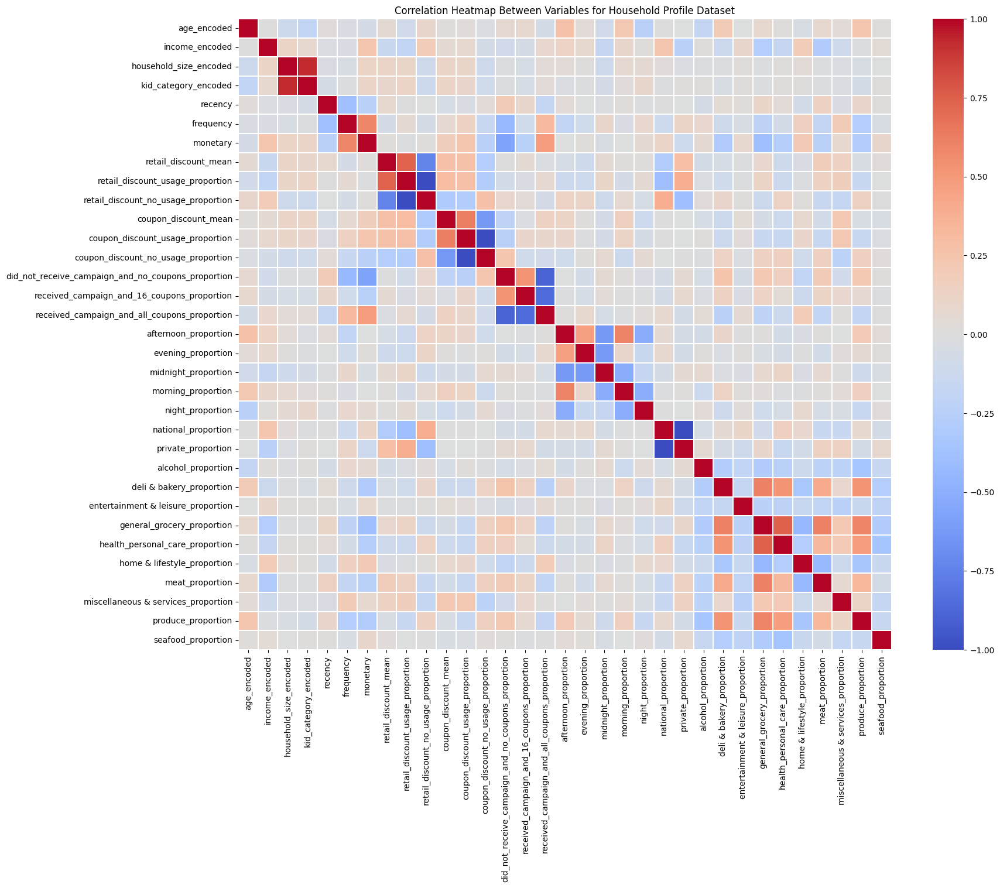

In [5]:
# Selecting columns (exclude household_key) for correlation  checking
corr_variables = inverse_household_profile_df.drop(columns=['household_key'])

# Compute correlation matrix
corr_matrix = corr_variables.corr(method='pearson')

# Plot correlation heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    linewidths=0.3
)
plt.title('Correlation Heatmap Between Variables for Household Profile Dataset')
plt.show()

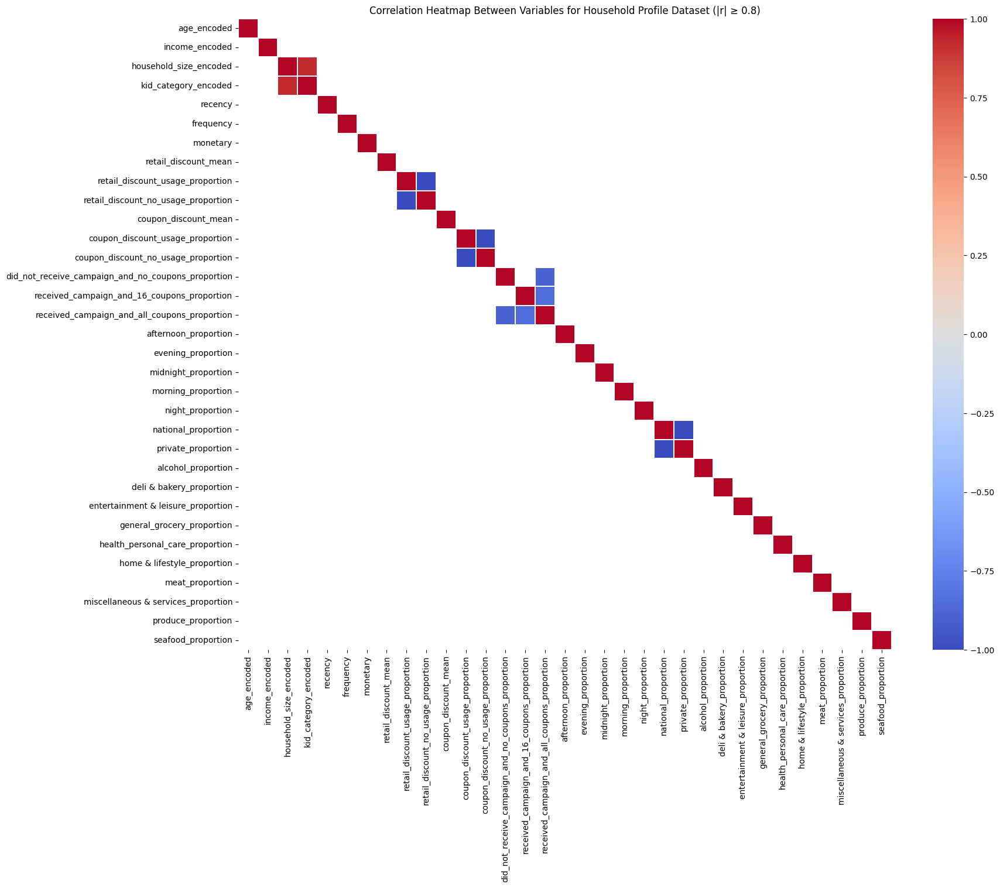

In [6]:
# Mask strong correlations (|r| ≥ 0.8)
# Absolute correlation values
mask = corr_matrix.abs() < 0.8

# Plot correlation heatmap
plt.figure(figsize=(18, 14))
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap='coolwarm',
    center=0,
    linewidths=0.3
)
plt.title('Correlation Heatmap Between Variables for Household Profile Dataset (|r| ≥ 0.8)')
plt.show()

In [6]:
# Identify and list feature pairs with strong correlations (|r| ≥ 0.8)
# Absolute correlation values
corr_abs = corr_matrix.abs()

# Remove self-correlations
corr_abs = corr_abs.where(~np.eye(corr_abs.shape[0], dtype=bool))

# Keep only strong correlations
strong_corr = (
    corr_abs
    .stack()
    .reset_index()
)

strong_corr.columns = ['Variable 1', 'Variable 2', 'Correlation']

# Keep only strong correlations (|r| ≥ 0.8)
strong_corr = strong_corr[strong_corr['Correlation'] >= 0.8]

# Sort correlations in descending order
strong_corr = strong_corr.sort_values('Correlation', ascending=False)

strong_corr.head(50)

,Variable 1,Variable 2,Correlation
296,retail_discount_no_usage_proportion,retail_discount_usage_proportion,1.000000
264,retail_discount_usage_proportion,retail_discount_no_usage_proportion,1.000000
725,private_proportion,national_proportion,1.000000
693,national_proportion,private_proportion,1.000000
363,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,1.000000
395,coupon_discount_no_usage_proportion,coupon_discount_usage_proportion,1.000000
66,household_size_encoded,kid_category_encoded,0.924278
98,kid_category_encoded,household_size_encoded,0.924278
493,received_campaign_and_all_coupons_proportion,did_not_receive_campaign_and_no_coupons_propor...,0.892169
430,did_not_receive_campaign_and_no_coupons_propor...,received_campaign_and_all_coupons_proportion,0.892169


- Dropping perfectly correlated variables (|r| = 1) because these two variables are exactly linearly dependent.Therefore, we will drop 'retail_discount_no_usage_proportion', 'coupon_discount_no_usage_proportion', and 'private_proportion' before clustering because they add zero new information but add noise and redundancy.

- Keeping highly correlated variables for clustering algorithms because each variable may contain some unique variance that helps distinguish clusters.


# Inverse Scaling, Transformation, and Encoding

In [7]:
# Set the location of the fitted objects
save_dir = '/content/drive/MyDrive/0. Colab Notebooks (DATA 60X Project)/2. Preprocessed Datasets/'

# Load the previously fitted objects
robust_scaler = joblib.load(f'{save_dir}/robust_scaler.pkl')
yeo_johnson_transformation = joblib.load(f'{save_dir}/yeo_johnson_transformation.pkl')

In [8]:
# Drop household_key because it is just an identifier
inverse_robust_scale_cols = inverse_household_profile_df.drop(
    columns=['household_key']
)

# Apply the fitted RobustScaler to reverse the scaling for all selected columns
inverse_robust_scale = robust_scaler.inverse_transform(inverse_robust_scale_cols )

# Convert the inverse-transformed array back into a new dataframe: 'inverse_household_profile_df'
inverse_household_profile_df = pd.DataFrame(
    inverse_robust_scale,
    columns=inverse_robust_scale_cols.columns,
    index=household_profile_df.index
)

# Add 'household_key' back to the 'inverse_household_profile_df'
inverse_household_profile_df['household_key'] = household_profile_df['household_key'].values

# Move household_key to the first column of the 'inverse_household_profile_df'
inverse_household_profile_df = inverse_household_profile_df[
    ['household_key'] + inverse_robust_scale_cols.columns.tolist()
]
# Display first 5 rows of the dataset
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,1.417809,3.293642,11.224266,0.229628,-0.121615,0.121615,0.004519,-1.363680,1.363680,0.620271,-0.030580,-0.589691,5.841657,4.048005,-7.483846,5.078030,-7.483846,1.007944,-1.007944,-7.403495,3.702803,-7.403495,5.994899,4.204895,-1.042129,3.676370,1.665921,4.007727,-7.403495
1,7,3.0,4.0,1.0,0.0,0.949495,3.093050,10.804470,0.220551,-0.112447,0.112447,0.002695,-1.921118,1.921118,1.177101,-0.625152,-0.551949,3.825838,3.332578,-9.375729,-0.080454,2.297768,0.200142,-0.200142,-7.981876,2.387912,-7.981876,5.395766,4.085986,-1.325660,2.817475,0.466100,3.461832,-1.325660
2,8,1.0,2.0,2.0,1.0,1.417809,3.432961,11.657452,0.266581,0.019709,-0.019709,0.000848,-2.200046,2.200046,0.550434,-0.063555,-0.486878,2.617577,3.053119,-9.869078,2.357500,1.840882,0.590237,-0.590237,-1.355270,1.325752,-9.189871,4.257858,2.313407,-0.399759,1.947947,-0.131495,2.116696,-0.885266
3,13,1.0,5.0,3.0,2.0,0.949495,3.852607,13.248418,0.294569,0.036643,-0.036643,0.004709,-0.960418,0.960418,0.402524,0.014948,-0.417472,1.232640,1.663564,-3.136808,0.647382,-0.406778,0.417983,-0.417983,-8.305458,1.332251,-8.305458,5.066608,3.833231,-0.641830,2.203079,2.792157,2.484930,-0.459509
4,16,3.0,4.0,0.0,0.0,2.089554,3.360920,9.446411,0.205179,-0.317830,0.317830,0.000000,-3.123053,3.123053,1.607420,-1.069024,-0.538396,5.523018,4.404284,-7.569901,5.212500,-7.569901,0.654166,-0.654166,-6.818094,4.719661,-6.818094,6.584180,4.360287,-6.818094,4.245877,2.828811,4.533559,-6.818094


In [9]:
# Columns to inverse Yeo-Johnson transformation
columns_to_inverse_yeo_johnson_transformation = [
    'recency',
    'frequency',
    'monetary',
    'retail_discount_mean',
    'coupon_discount_mean'
]

# Directly inverse-transform and overwrite the same columns in 'inverse_household_profile_df'
inverse_household_profile_df[columns_to_inverse_yeo_johnson_transformation] = yeo_johnson_transformation.inverse_transform(
    inverse_household_profile_df[columns_to_inverse_yeo_johnson_transformation]
)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,5.0,86.0,4330.16,0.403613,-0.121615,0.121615,0.015142,-1.363680,1.363680,0.620271,-0.030580,-0.589691,5.841657,4.048005,-7.483846,5.078030,-7.483846,1.007944,-1.007944,-7.403495,3.702803,-7.403495,5.994899,4.204895,-1.042129,3.676370,1.665921,4.007727,-7.403495
1,7,3.0,4.0,1.0,0.0,2.0,59.0,3400.05,0.375202,-0.112447,0.112447,0.004005,-1.921118,1.921118,1.177101,-0.625152,-0.551949,3.825838,3.332578,-9.375729,-0.080454,2.297768,0.200142,-0.200142,-7.981876,2.387912,-7.981876,5.395766,4.085986,-1.325660,2.817475,0.466100,3.461832,-1.325660
2,8,1.0,2.0,2.0,1.0,5.0,113.0,5534.97,0.544871,0.019709,-0.019709,0.000935,-2.200046,2.200046,0.550434,-0.063555,-0.486878,2.617577,3.053119,-9.869078,2.357500,1.840882,0.590237,-0.590237,-1.355270,1.325752,-9.189871,4.257858,2.313407,-0.399759,1.947947,-0.131495,2.116696,-0.885266
3,13,1.0,5.0,3.0,2.0,2.0,275.0,13190.92,0.693011,0.036643,-0.036643,0.033113,-0.960418,0.960418,0.402524,0.014948,-0.417472,1.232640,1.663564,-3.136808,0.647382,-0.406778,0.417983,-0.417983,-8.305458,1.332251,-8.305458,5.066608,3.833231,-0.641830,2.203079,2.792157,2.484930,-0.459509
4,16,3.0,4.0,0.0,0.0,21.0,98.0,1512.02,0.331315,-0.317830,0.317830,0.000000,-3.123053,3.123053,1.607420,-1.069024,-0.538396,5.523018,4.404284,-7.569901,5.212500,-7.569901,0.654166,-0.654166,-6.818094,4.719661,-6.818094,6.584180,4.360287,-6.818094,4.245877,2.828811,4.533559,-6.818094


In [10]:
# Grouping proportions of retail discount usage vs non-usage
retail_discount_groups = [
    ['retail_discount_usage_proportion', 'retail_discount_no_usage_proportion']
]

# Grouping proportions of coupon usage vs non-usage
coupon_discount_groups = [
    ['coupon_discount_usage_proportion', 'coupon_discount_no_usage_proportion']
]

# Grouping proportions of campaign exposure and coupon receipt
campaign_groups = [
    ['did_not_receive_campaign_and_no_coupons_proportion',
     'received_campaign_and_16_coupons_proportion',
     'received_campaign_and_all_coupons_proportion']
]

# Grouping proportions of purchases by time of day
time_of_day_groups = [
    ['morning_proportion', 'afternoon_proportion', 'evening_proportion',
     'midnight_proportion', 'night_proportion']
]

# Grouping proportions of brand type purchased
brand_groups = [
    ['national_proportion', 'private_proportion']
]

# Grouping proportions of product categories purchased
product_groups = [
    ['alcohol_proportion', 'deli & bakery_proportion', 'entertainment & leisure_proportion',
     'general_grocery_proportion', 'health_personal_care_proportion', 'home & lifestyle_proportion',
     'meat_proportion', 'miscellaneous & services_proportion', 'produce_proportion', 'seafood_proportion']
]

# Combine all groups into a single list for processing
all_groups = retail_discount_groups + coupon_discount_groups + campaign_groups + time_of_day_groups + brand_groups + product_groups


# Define a function to reverse Centered Log-Ratio transformation
def inverse_clr(df, groups, total_sum=1):
    df_inverse = df.copy()

    for cols in groups:
        # Exponentiate CLR values
        exp_vals = np.exp(df[cols].values)

        # Normalize to original sum
        exp_vals /= exp_vals.sum(axis=1).reshape(-1, 1)
        exp_vals *= total_sum

        # Replace the CLR columns with original scale
        df_inverse[cols] = exp_vals

    return df_inverse


inverse_household_profile_df = inverse_clr(inverse_household_profile_df, all_groups)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,5.0,3.0,1.0,0.0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,3.0,4.0,1.0,0.0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,1.0,2.0,2.0,1.0,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,1.0,5.0,3.0,2.0,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,3.0,4.0,0.0,0.0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [11]:
# Convert encoded columns from float to integer to ensure correct mapping back to original categories
inverse_household_profile_df['age_encoded'] = inverse_household_profile_df['age_encoded'].astype(int)
inverse_household_profile_df['income_encoded'] = inverse_household_profile_df['income_encoded'].astype(int)
inverse_household_profile_df['household_size_encoded'] = inverse_household_profile_df['household_size_encoded'].astype(int)
inverse_household_profile_df['kid_category_encoded'] = inverse_household_profile_df['kid_category_encoded'].astype(int)

# Age - Inverse Ordinal Encoding
age_order = ['19-24', '25-34', '35-44', '45-54', '55-64', '65+']
age_mapping = {age: i for i, age in enumerate(age_order)}
inverse_age_mapping = {v: k for k, v in age_mapping.items()}
inverse_household_profile_df['age_encoded'] = inverse_household_profile_df['age_encoded'].map(inverse_age_mapping)

# Income - Inverse Ordinal Encoding
income_order = [
    'Under 15K', '15-24K', '25-34K', '35-49K', '50-74K',
    '75-99K', '100-124K', '125-149K', '150-174K',
    '175-199K', '200-249K', '250K+'
]
income_mapping = {income: i for i, income in enumerate(income_order)}
inverse_income_mapping = {v: k for k, v in income_mapping.items()}
inverse_household_profile_df['income_encoded'] = inverse_household_profile_df['income_encoded'].map(inverse_income_mapping)

# Household Size - Inverse Ordinal Encoding
household_size_order = ['1', '2', '3', '4', '5+']
household_size_mapping = {size: i for i, size in enumerate(household_size_order)}
inverse_household_size_mapping = {v: k for k, v in household_size_mapping.items()}
inverse_household_profile_df['household_size_encoded'] = inverse_household_profile_df['household_size_encoded'].map(inverse_household_size_mapping)

# Kid Category - Inverse Ordinal Encoding
kid_order = ['0', '1', '2', '3+']
kid_mapping = {kid: i for i, kid in enumerate(kid_order)}
inverse_kid_mapping = {v: k for k, v in kid_mapping.items()}
inverse_household_profile_df['kid_category_encoded'] = inverse_household_profile_df['kid_category_encoded'].map(inverse_kid_mapping)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,25-34,75-99K,4,2,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,45-54,50-74K,1,0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [12]:
# Add 'inverse_' prefix to all columns except 'household_key'
inverse_household_profile_df.rename(
    columns=lambda x: f"inverse_{x}" if x != 'household_key' else x,
    inplace=True
)

# Display first 5 rows
inverse_household_profile_df.head()

,household_key,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,25-34,75-99K,4,2,2.0,275.0,13190.92,0.693011,0.518313,0.481687,0.033113,0.127768,0.872232,0.471891,0.320273,0.207836,0.302811,0.465928,3.833049e-03,0.168654,5.877342e-02,0.697615,0.302385,1.000000e-06,0.015332,1.000000e-06,0.641822,0.186967,0.002129,0.036627,0.066013,0.048552,2.555361e-03
4,16,45-54,50-74K,1,0,21.0,98.0,1512.02,0.331315,0.346228,0.653772,0.000000,0.001934,0.998066,0.843327,0.058027,0.098646,0.485492,0.158607,1.000000e-06,0.355899,1.000000e-06,0.787234,0.212766,1.000000e-06,0.102514,1.000000e-06,0.661506,0.071566,0.000001,0.063830,0.015474,0.085106,1.000000e-06


In [13]:
# Merge with the original 'household_profile_df' with 'inverse_household_profile_df'
household_profile_df = household_profile_df.merge(inverse_household_profile_df, on='household_key', how='left')

# Display first 5 rows
household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [15]:
# Display the shape of the household profile datatset
household_profile_df.shape

(801, 67)

# Recency, Frequency & Monetary (RFM)

## Model 1: K-Means

In [ ]:
# Display first 5 rows of the dataset
household_profile_df[['recency', 'frequency', 'monetary']].head()

,recency,frequency,monetary
0,0.489861,-0.621099,-0.087203
1,0.000000,-1.136685,-0.358394
2,0.489861,-0.263006,0.192638
3,0.000000,0.815617,1.220412
4,1.192513,-0.448174,-1.235709


In [ ]:
# Extract recency, frequency, and monetary variables from house_profile dataset and converts them into NumPy array.
rfm_array = household_profile_df[['recency', 'frequency', 'monetary']].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [ ]:
# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_kmeans_results_df' for comparison across different k.
rfm_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(rfm_array)

    rfm_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert results to DataFrame
rfm_kmeans_results_df = pd.DataFrame(rfm_kmeans_results)
rfm_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,822.815902,0.325478,1.157449,506.671391
1,3,637.381110,0.291321,1.162451,442.711950
2,4,497.151696,0.299797,1.030296,452.851786
3,5,444.609795,0.275533,1.133561,402.816147
4,6,403.169314,0.243059,1.188323,371.272909
5,7,370.100167,0.238279,1.209922,348.439319
6,8,341.624473,0.250736,1.151627,332.592197
7,9,316.967518,0.243156,1.166946,320.962218
8,10,295.748045,0.249778,1.143140,311.689394


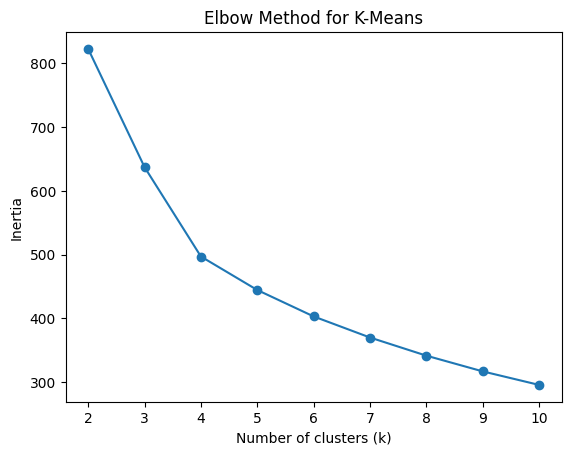

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(rfm_kmeans_results_df['k'], rfm_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx =rfm_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.325478 at k = 2.0
Best Davies-Bouldin Index: 1.030296 at k = 4.0
Best Calinski-Harabasz Index: 506.671391 at k = 2.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4.

- Based on Silhouette score, the highest value (0.325478) is at k=2, which provides the best clustering. Then, the second highest value (0.2998) is at k=4.

- Based on Davies-Bouldin Index (DBI), the lowest value (1.030296) is at k = 4, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (506.67) is at k=2, which provides the strongest clustering.

- The best k is 4 based on the elbow method and the combination of validation metrics, as k=2 is too simple to capture cluster structure and identify more subtle behaviours.

In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
rfm_kmeans_cluster_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [ ]:
# Fit final K-Means model using k=4
final_k = 4
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(rfm_array)

# Add cluster labels to the rfm_kmeans_cluster_df
rfm_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_kmeans_cluster_df.head(5)

Silhouette Score for k=4: 0.299797
Davies-Bouldin Index for k=4: 1.030296
Calinski-Harabasz Index for k=4: 452.851786


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,4
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,4
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on RFM variables
rfm_cols_of_interest = ['inverse_frequency', 'inverse_recency', 'inverse_monetary']

# Group by cluster and calculate count, median, and mean
rfm_kmeans_cluster_summary = rfm_kmeans_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_kmeans_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
1,226,158.0,5.0,5816.680
2,184,279.0,0.0,9100.755
3,195,122.0,1.0,3194.170
4,196,80.0,8.0,2729.005


In [ ]:
class NumericalClusterDifferentiationAnalyzer:
    """
    Measures how well numerical variables differentiate clusters using
    eta-squared and average pairwise Cohen’s d.
    """

    def __init__(self, df, cluster_col='cluster', noise_cluster=None):
        self.df = df.copy()
        self.cluster_col = cluster_col

        # Exclude noise cluster if specified
        if noise_cluster is not None:
            self.df = self.df[self.df[cluster_col] != noise_cluster]

    # 1. Eta-squared
    def calculate_eta_squared(self, variable):
        if self.df[self.cluster_col].nunique() < 2:
            return np.nan

        grand_mean = self.df[variable].mean()

        ss_between = sum(
            self.df.groupby(self.cluster_col)[variable].count() *
            (self.df.groupby(self.cluster_col)[variable].mean() - grand_mean) ** 2
        )

        ss_total = sum((self.df[variable] - grand_mean) ** 2)

        return ss_between / ss_total if ss_total != 0 else np.nan

    # 2. Average Cohen's d
    def calculate_avg_cohens_d(self, variable):
        """
        Calculate average Cohen's d across all cluster pairs
        |d| < 0.2: negligible
        0.2 ≤ |d| < 0.5: small
        0.5 ≤ |d| < 0.8: medium
        |d| ≥ 0.8: large
        """
        clusters = sorted(self.df[self.cluster_col].unique())
        cohens_ds = []

        for i, c1 in enumerate(clusters):
            for c2 in clusters[i + 1:]:
                d1 = self.df[self.df[self.cluster_col] == c1][variable]
                d2 = self.df[self.df[self.cluster_col] == c2][variable]

                pooled_std = np.sqrt(
                    ((len(d1) - 1) * d1.std()**2 + (len(d2) - 1) * d2.std()**2) /
                    (len(d1) + len(d2) - 2)
                )

                if pooled_std > 0:
                    cohens_ds.append(abs(d1.mean() - d2.mean()) / pooled_std)

        return np.mean(cohens_ds) if cohens_ds else np.nan

    # 3. Compare all features
    def compare_all_features(self, feature_list):
        results = []

        for feature in feature_list:
            results.append({
                'variable': feature,
                'eta_squared': self.calculate_eta_squared(feature),
                'avg_cohens_d': self.calculate_avg_cohens_d(feature)
            })

        return pd.DataFrame(results).set_index('variable')

In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables
rfm_kmeans_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
rfm_kmeans_differentiation = rfm_kmeans_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_kmeans_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.448855,1.354174
inverse_recency,0.163646,0.608276
inverse_monetary,0.543932,1.554752


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Monetary explains 54% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, monetary has large average group means difference across all pairwise cluster.

2. Frequency explains 45% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, frequency has large average group means difference across all pairwise cluster.

3. Recency explains 16% of the variance between household segments, indicating a large effect in differentiating household segments. However, recency has medium average group means difference across all pairwise cluster.

4. These results suggest that monetary and frequency variables are more important variables for differentiating the clusters, whereas the recency variable contributes less to explaining the differences between clusters.



In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_kmeans_cluster_proportion = rfm_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_kmeans_cluster_proportion)

cluster
1    0.282147
2    0.229713
3    0.243446
4    0.244694
Name: proportion, dtype: float64


The clusters are well-balanced because each cluster has about 23-28% of the total customers. No cluster is extremely small or dominating the dataset.

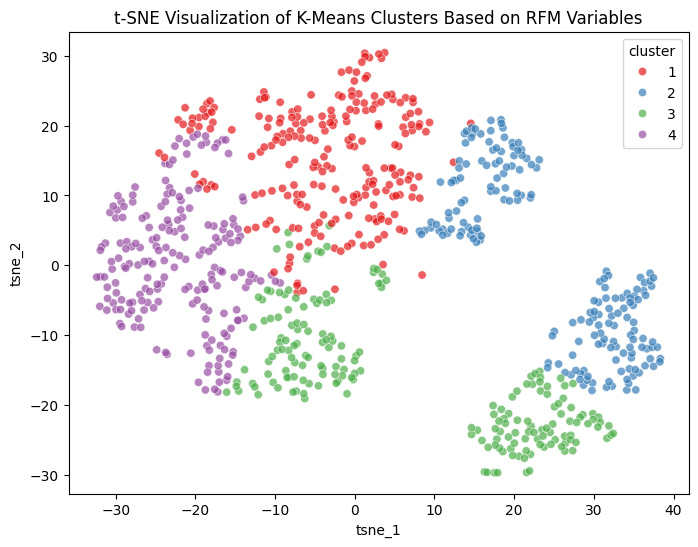

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_kmeans_cluster_df'
rfm_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on RFM Variables')
plt.show()

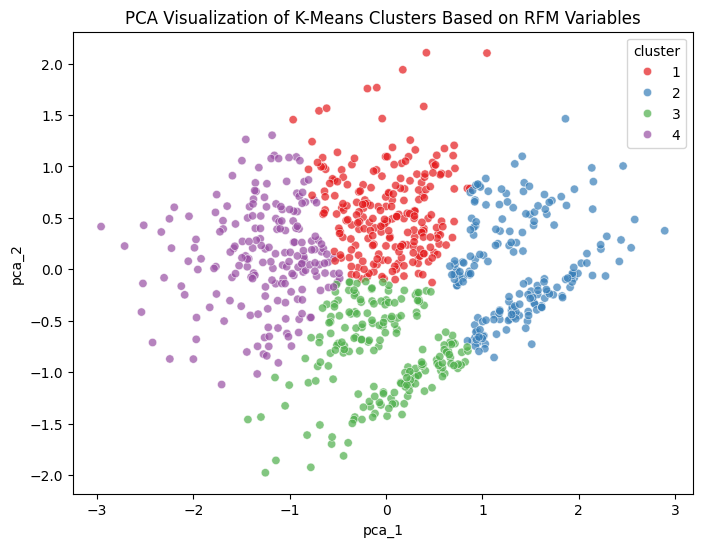

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
rfm_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend
rfm_kmeans_cluster_df['cluster_str'] = rfm_kmeans_cluster_df['cluster'].apply(lambda x: f'Cluster {x}')

# Define custom colors
custom_colors = {
    'Cluster 1': 'red',
    'Cluster 2': 'dodgerblue',
    'Cluster 3': 'green',
    'Cluster 4': 'purple'

}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_kmeans_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of K-Means Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

## Model 2: Hierarchical Clustering (Ward Linkage)

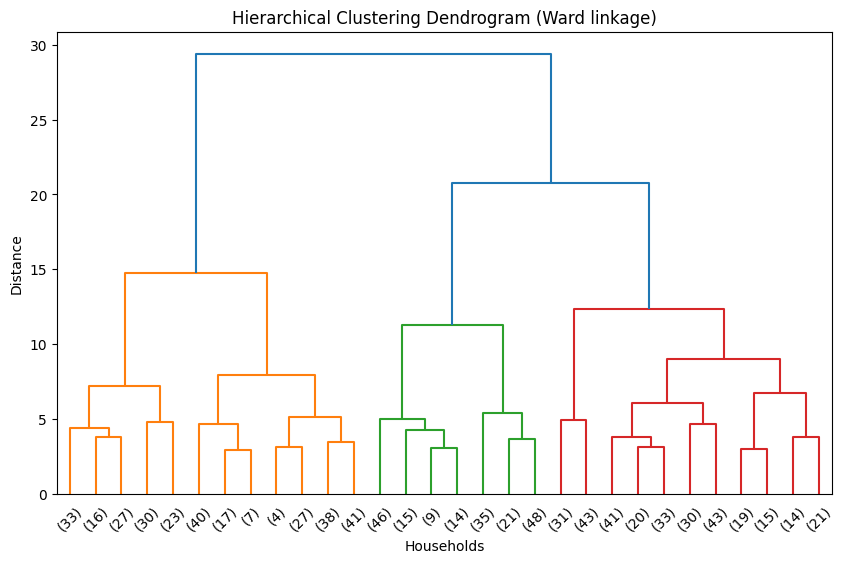

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Perform hierarchical clustering using Ward linkage.
rfm_hierarchical_ward = linkage(rfm_array, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_ward_results' for comparison across different k.
rfm_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(rfm_array)

    rfm_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_ward_results_df = pd.DataFrame(rfm_hierarchical_ward_results)
rfm_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.278791,1.273301,379.225560
1,3,0.249608,1.237899,371.749404
2,4,0.221314,1.230946,342.639658
3,5,0.206718,1.240613,324.909901
4,6,0.194200,1.134367,319.432795
5,7,0.209796,1.250221,305.476049
6,8,0.214774,1.258108,292.791698
7,9,0.220786,1.277590,282.008433
8,10,0.222094,1.200146,273.851407


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.278791 at k = 2.0
Best Davies-Bouldin Index: 1.134367 at k = 6.0
Best Calinski-Harabasz Index: 379.225560 at k = 2.0


k=2 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- Silhouette score is the highest at k=2 (0.279)
- Calinski-Harabasz index is the highest at k=2 (379.23)

In [ ]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_ward_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical ward clustering model using k=2
final_k = 2
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=2: 0.278791
Davies-Bouldin Index for k=2: 1.273301
Calinski-Harabasz Index for k=2: 379.225560


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_ward_cluster_summary = rfm_hierarchical_ward_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_hierarchical_ward_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
1,498,109.0,3.0,3308.155
2,303,229.0,2.0,8354.550


In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables
rfm_hierarchical_ward_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_hierarchical_ward_cluster_df, cluster_col='cluster')

# Cluster differentiation results
rfm_hierarchical_ward_differentiation = rfm_hierarchical_ward_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_hierarchical_ward_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.320211,1.413463
inverse_recency,0.026822,0.341902
inverse_monetary,0.510691,2.103976


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Monetary explains 51% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, monetary has large average group means difference across all pairwise cluster.

2. Frequency explains 32% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, frequency has large average group means difference across all pairwise cluster.

3. Recency explains 3% of the variance between household segments, indicating a small effect in differentiating household segments. However, recency has small average group means difference across all pairwise cluster.

4. These results suggest that monetary and frequency variables are more important variables for differentiating the clusters, whereas the recency variable contributes less to explaining the differences between clusters.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_ward_cluster_proportion = rfm_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_ward_cluster_proportion)

cluster
1    0.621723
2    0.378277
Name: proportion, dtype: float64


The clusters are well-balanced.

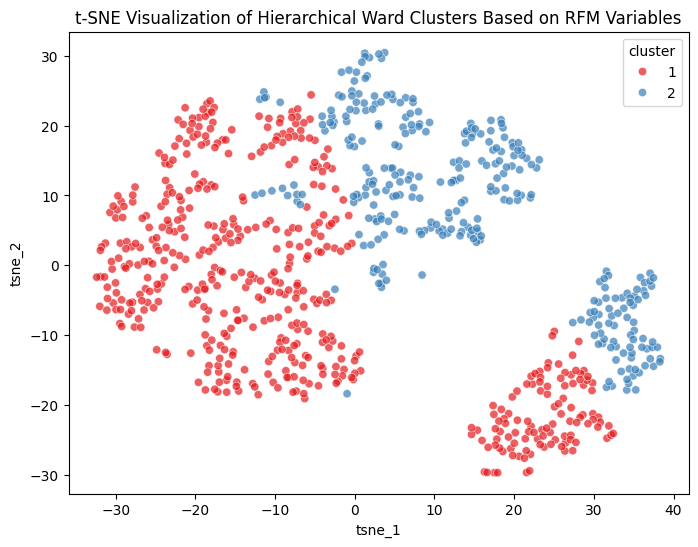

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on RFM Variables')
plt.show()

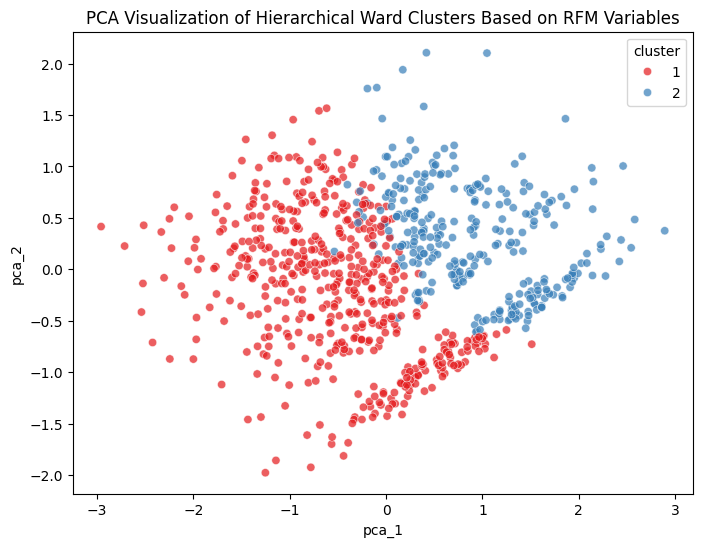

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_ward_cluster_df'
rfm_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on RFM Variables')
plt.show()

## Model 3: Hierarchical Clustering (Average Linkage)

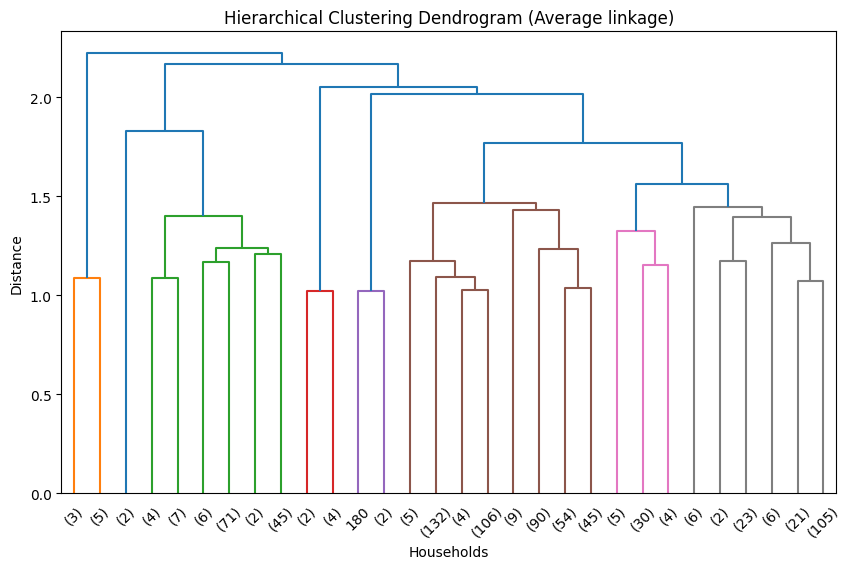

In [ ]:
# Perform hierarchical clustering using Average linkage.
rfm_hierarchical_average = linkage(rfm_array, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=7

In [ ]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_average_results' for comparison across different k.
rfm_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(rfm_array)

    rfm_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_average_results_df = pd.DataFrame(rfm_hierarchical_average_results)
rfm_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.222591,0.951227,16.148563
1,3,0.223344,0.939667,175.681705
2,4,0.129575,0.925148,124.413772
3,5,0.102203,0.920576,95.888730
4,6,0.078004,0.869374,78.066089
5,7,0.153185,0.945204,140.159315
6,8,0.146824,0.938225,139.948977
7,9,0.207634,0.976994,187.352318
8,10,0.191779,0.977192,170.801060


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.223344 at k = 3.0
Best Davies-Bouldin Index: 0.869374 at k = 6.0
Best Calinski-Harabasz Index: 187.352318 at k = 9.0


k=3 was selected for hierarchical average clustering based on its balanced performance:
- Silhouette score is the highest at k=3 (0.223)
- Davies-Bouldin index is the fourth lowest at k=3 (0.940)
- Calinski-Harabasz index is the second highest at k =3 (175.7)

In [ ]:
# Create a copy of the dataset to add hierarchical average cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_average_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical average clustering model using k=3
final_k = 3
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=3
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=3: 0.223344
Davies-Bouldin Index for k=3: 0.939667
Calinski-Harabasz Index for k=3: 175.681705


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_average_cluster_summary = rfm_hierarchical_average_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_hierarchical_average_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
1,656,123.5,3.0,3959.390
2,8,222.0,63.0,8602.745
3,137,321.0,0.0,10427.210


In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables
rfm_hierarchical_average_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_hierarchical_average_cluster_df, cluster_col='cluster')

# Cluster differentiation results
rfm_hierarchical_average_differentiation = rfm_hierarchical_average_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_hierarchical_average_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.418085,1.653932
inverse_recency,0.120475,4.605675
inverse_monetary,0.472675,1.684106


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Monetary explains 47% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, monetary has large average group means difference across all pairwise cluster.

2. Frequency explains 42% of the variance between household segments, indicating a large effect in differentiating household segments. Addtionally, frequency has large average group means difference across all pairwise cluster.

3. Recency explains 12% of the variance between household segments, indicating a medium effect in differentiating household segments. Additionally, recency has large average group means difference across all pairwise cluster.

4. These results suggest that monetary and frequency variables are more important variables for differentiating the clusters, whereas the recency variable contributes less to explaining the differences between clusters.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_average_cluster_proportion = rfm_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_average_cluster_proportion)

cluster
1    0.818976
2    0.009988
3    0.171036
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

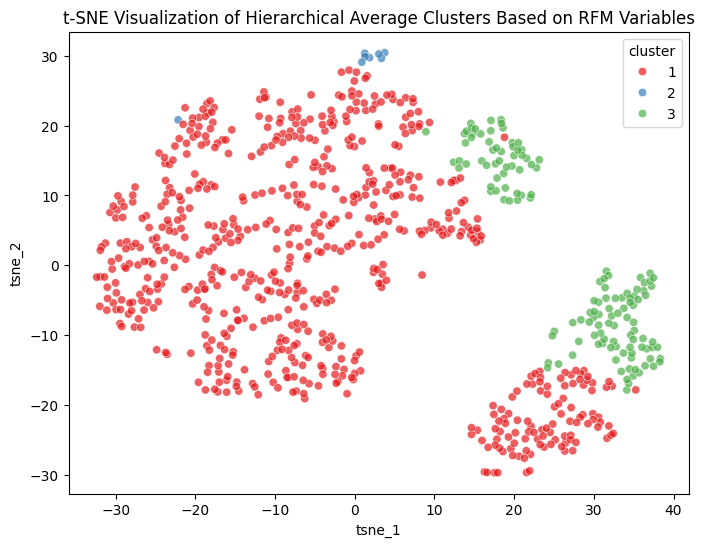

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on RFM Variables')
plt.show()

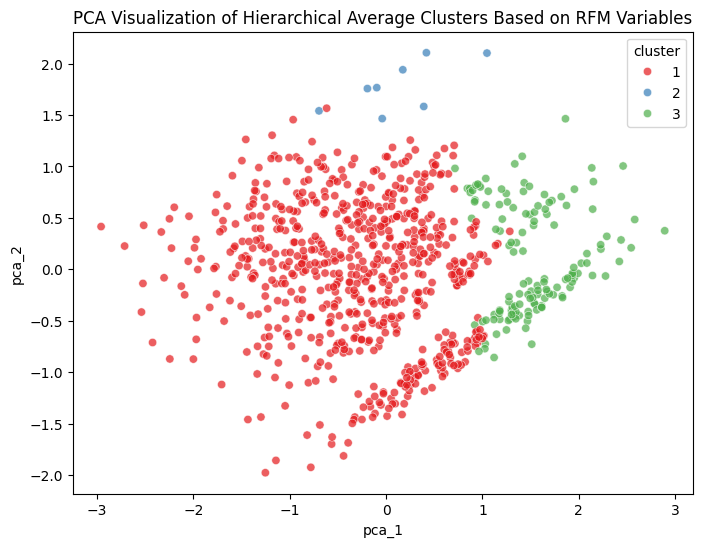

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_average_cluster_df'
rfm_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on RFM Variables')
plt.show()

## Model 4: Hierarchical Clustering (Complete Linkage)

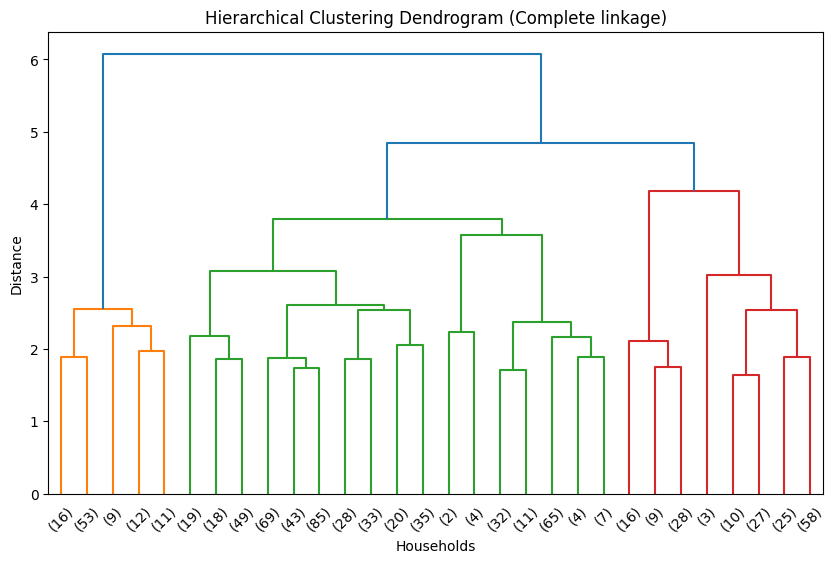

In [ ]:
# Perform hierarchical clustering using Complete linkage.
rfm_hierarchical_complete = linkage(rfm_array, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(rfm_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_hierarchical_complete_results' for comparison across different k.
rfm_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(rfm_array)

    rfm_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(rfm_array, labels),
        'davies_bouldin_index': davies_bouldin_score(rfm_array, labels),
        'calinski_harabasz_index': calinski_harabasz_score(rfm_array, labels)
    })

# Convert to DataFrame
rfm_hierarchical_complete_results_df = pd.DataFrame(rfm_hierarchical_complete_results)
rfm_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.259792,1.006788,218.455468
1,3,0.132547,1.917112,165.161790
2,4,0.098108,1.256089,193.719387
3,5,0.120215,1.255829,227.848543
4,6,0.122865,1.221088,192.750605
5,7,0.148649,1.259780,208.961193
6,8,0.142751,1.178411,183.708425
7,9,0.162119,1.359363,192.704082
8,10,0.149658,1.363406,183.812625


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = rfm_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.259792 at k = 2.0
Best Davies-Bouldin Index: 1.006788 at k = 2.0
Best Calinski-Harabasz Index: 227.848543 at k = 5.0


k=2 was selected for hierarchical complete clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- Silhouette score is the highest at k=2 (0.260)
- Davies-Bouldin index is the lowest at k=2(1.007)
- Calinski-Harabasz index is the second highest at k=2 (218.455)

In [ ]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hierarchical_complete_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(rfm_array, cluster_labels)
dbi_score = davies_bouldin_score(rfm_array, cluster_labels)
chi_score = calinski_harabasz_score(rfm_array, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.259792
Davies-Bouldin Index for k=2: 1.006788
Calinski-Harabasz Index for k=2: 218.455468


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hierarchical_complete_cluster_summary = rfm_hierarchical_complete_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_hierarchical_complete_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
1,700,154.5,2.0,5144.305
2,101,66.0,16.0,2590.370


In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables across K-means clusters
rfm_hierarchical_complete_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_hierarchical_complete_cluster_df, cluster_col='cluster')

# Cluster differentiation results
rfm_hierarchical_complete_differentiation = rfm_hierarchical_complete_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_hierarchical_complete_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.092001,0.957710
inverse_recency,0.149045,1.259175
inverse_monetary,0.088466,0.937309


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Monetary explains 9% of the variance between household segments, indicating a medium effect in differentiating household segments. Addtionally, monetary has large average group means difference across all pairwise cluster.

2. Frequency explains 9% of the variance between household segments, indicating a medium effect in differentiating household segments. Addtionally, frequency has large average group means difference across all pairwise cluster.

3. Recency explains 15% of the variance between household segments, indicating a large effect in differentiating household segments. Additionally, recency has large average group means difference across all pairwise cluster.

4. These results suggest that recency variables is the most important variables for differentiating the clusters, whereas the monetary and frequency variables contribute less to explaining the differences between clusters.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hierarchical_complete_cluster_proportion = rfm_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hierarchical_complete_cluster_proportion)

cluster
1    0.873908
2    0.126092
Name: proportion, dtype: float64


The clusters are severely imbalanced.

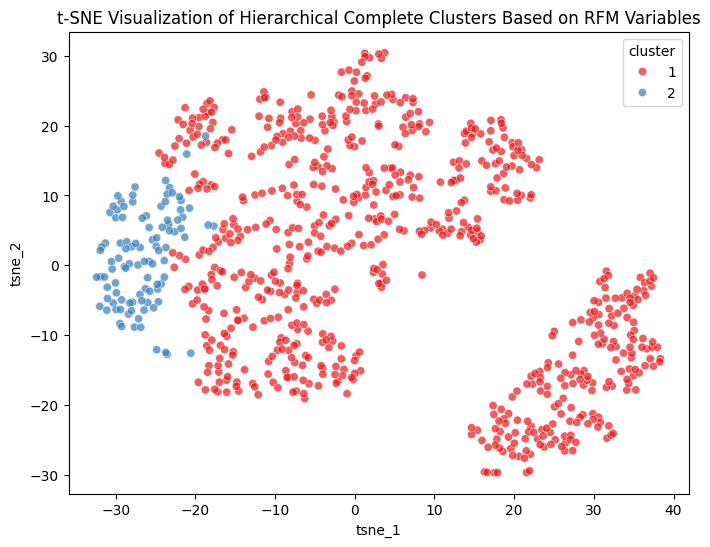

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on RFM Variables')
plt.show()

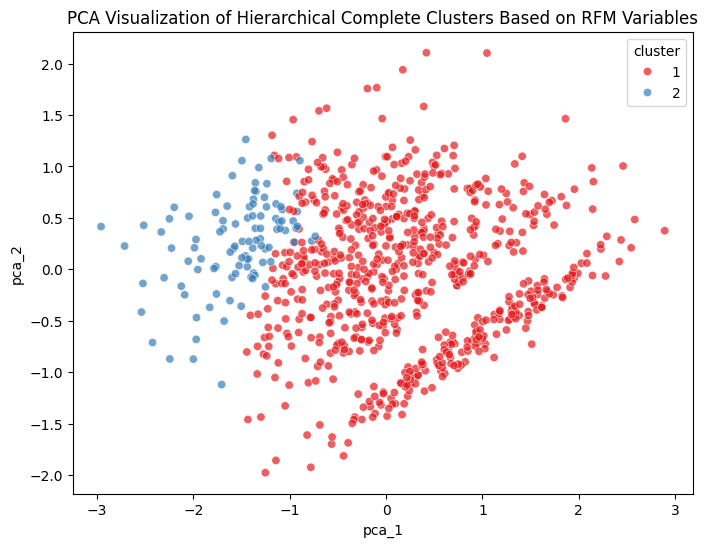

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_hierarchical_complete_cluster_df'
rfm_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on RFM Variables')
plt.show()

## Model 5: DBSCAN

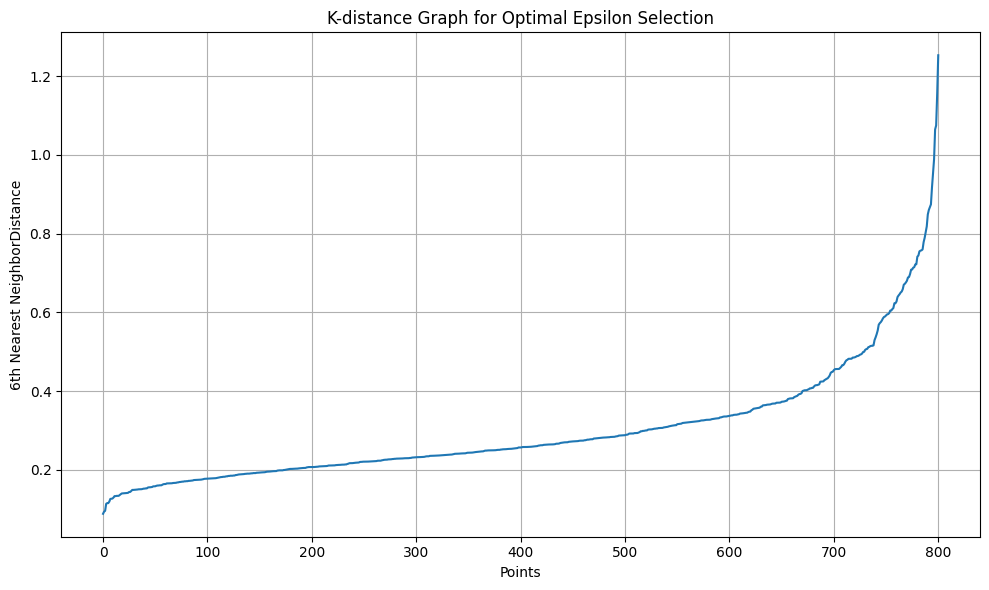

In [ ]:
# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 3 variables (recency, frequency, monetary), so n_neighbors / min_samples = 6.

# Calculate distances to the 6 nearest neighbors for each point.
# The distance to the 6th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 6
rfm_neighbors = NearestNeighbors(n_neighbors=k).fit(rfm_array)
distances, indices = rfm_neighbors.kneighbors(rfm_array)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 0.8.

In [ ]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Define parameter ranges for DBSCAN
eps_range = [0.3, 0.4, 0.5, 0.6, 0.8]
min_samples_range = [5, 6, 7]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'rfm_dbscan_results' for comparison across different eps range and minimum samples range.
rfm_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(rfm_array)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = rfm_array[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(rfm_array, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        rfm_dbscan_results.append(result)

# Convert to DataFrame
rfm_dbscan_results_df = pd.DataFrame(rfm_dbscan_results)
rfm_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,0.3,5,5,131,0.163546,-0.142627,-0.022400,1.348679,133.258619
1,0.3,6,6,159,0.198502,-0.085522,0.008156,1.260232,107.781864
2,0.3,7,5,187,0.233458,-0.143017,0.039939,1.321552,135.001394
3,0.4,5,2,59,0.073658,-0.159890,0.293847,1.220949,277.063570
4,0.4,6,2,63,0.078652,0.166078,0.294979,1.214337,278.004863
5,0.4,7,2,70,0.087391,0.167242,0.298073,1.205631,281.598758
6,0.5,5,2,26,0.032459,-0.376307,0.280374,1.264570,263.291816
7,0.5,6,2,31,0.038702,-0.285587,0.282818,1.256434,266.809163
8,0.5,7,2,37,0.046192,-0.281524,0.284928,1.249180,269.000821
9,0.6,5,2,14,0.017478,-0.578654,0.275918,1.277067,258.869409


In [ ]:
# Highest DBCV Score
best_dbcv_idx = rfm_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = rfm_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = rfm_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.167242 at eps = 0.4, min_samples = 7.0
Best Silhouette Score: 0.298073 at eps = 0.4, min_samples = 7.0
Best Davies-Bouldin Index: 1.205631 at eps = 0.4, min_samples = 7.0
Best Calinski-Harabasz Index: 281.598758 at eps = 0.4, min_samples = 7.0


Choosing an epsilon of 0.8 only creates 1 cluster, which produces NaN values for the DBCV score Silhouette score, Davies-Bouldin index and Calinski-Harabasz index. Therefore, we tested with different epsilon values (0.3, 0.4, 0.5, 0.6 & 0.8) and minimum samples values (5, 6 & 7).

eps=0.4 and min_sample = 7 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio equal to 0.087
- DBCV score is the highest at 0.1672
- Silhouette score is the highest at 0.298
- Davies-Bouldin index is the lowest at 1.206
- Calinski-Harabasz index is the highest at 281.599

In [ ]:
# Create a copy of the dataset to add DBSCAN cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_dbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 0.4
best_min_samples = 7
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(rfm_array)

# Add cluster labels to the 'rfm_dbscan_cluster_df'
rfm_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.4 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = rfm_array[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(rfm_array, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_dbscan_cluster_df.head(5)

Number of clusters for eps=0.4 & min_samples=7: 2
Number of noise for eps=0.4 & min_samples=7: 70
Noise ratio for eps=0.4 & min_samples=7: 0.087391
DBCV Score for eps=0.4 & min_samples=7: 0.167242
Silhouette Score for eps=0.4 & min_samples=7: 0.298073
Davies-Bouldin Index for eps=0.4 & min_samples=7: 1.205631
Calinski-Harabasz Index for eps=0.4 & min_samples=7: 281.598758


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_dbscan_cluster_summary = rfm_dbscan_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_dbscan_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
0,70,121.5,3.0,2439.940
1,557,131.0,4.0,4528.710
2,174,188.0,0.0,5946.965


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables
rfm_dbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_dbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
rfm_dbscan_differentiation = rfm_dbscan_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_dbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.094131,0.755884
inverse_recency,0.093843,0.754604
inverse_monetary,0.045225,0.510338


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For DBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Monetary explains 5% of the variance between household segments, indicating a small effect in differentiating household segments. Addtionally, monetary has medium average group means difference across all pairwise cluster.

2. Frequency explains 9% of the variance between household segments, indicating a medium effect in differentiating household segments. Addtionally, frequency has medium average group means difference across all pairwise cluster.

3. Recency explains 9% of the variance between household segments, indicating a medium effect in differentiating household segments. Additionally, recency has medium average group means difference across all pairwise cluster.

4. These results suggest that recency and frequency variables are the most important variables for differentiating the clusters, whereas the monetary variable contributes less to explaining the differences between clusters.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_dbscan_cluster_proportion = rfm_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_dbscan_cluster_proportion)

cluster
0    0.087391
1    0.695381
2    0.217228
Name: proportion, dtype: float64


The clusters are moderately imbalanced.

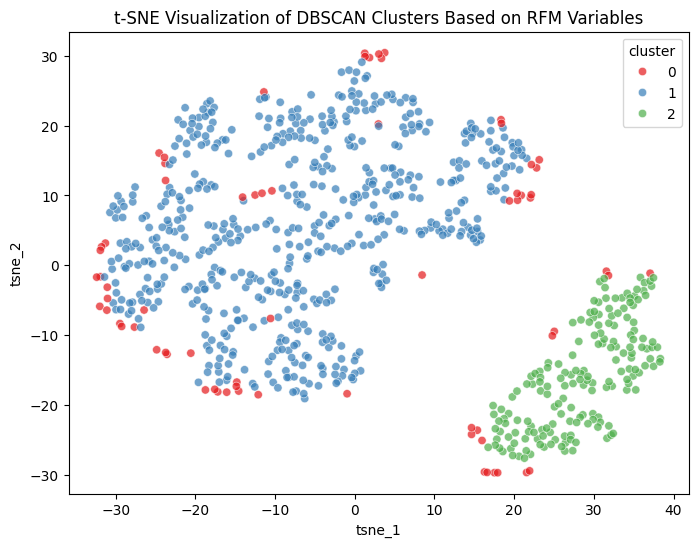

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_dbscan_cluster_df'
rfm_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

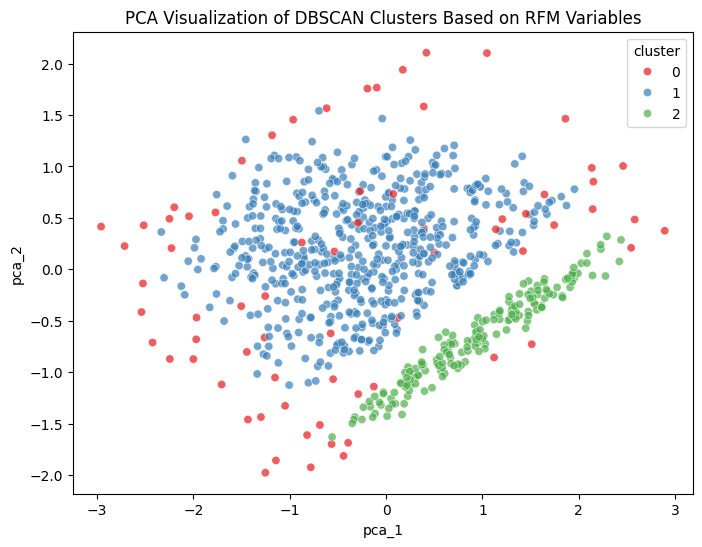

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
rfm_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend and add "(Noise)" for cluster 0
rfm_dbscan_cluster_df['cluster_str'] = rfm_dbscan_cluster_df['cluster'].apply(
    lambda x: f'Cluster {x} (Noise)' if x == 0 else f'Cluster {x}'
)

# Define custom colors
custom_colors = {
    'Cluster 0 (Noise)': 'darkblue',  # Cluster O is Noise
    'Cluster 1': 'palevioletred',
    'Cluster 2': 'orange',
}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 0 (Noise)', 'Cluster 1', 'Cluster 2']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_dbscan_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of DBSCAN Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

## Model 6: HDBSCAN

In [ ]:
# For HDBSCAN, min_cluster_size is the minimum number of points required to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 15]
min_samples_range = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Store results
rfm_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        rfm_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = rfm_hdbscan.fit_predict(rfm_array)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = rfm_array[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(rfm_array, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        rfm_hdbscan_results.append(result)

# Convert to DataFrame
rfm_hdbscan_results_df = pd.DataFrame(rfm_hdbscan_results)
rfm_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,2,5,0.006242,-0.582962,0.274537,1.313667,253.135929
1,5,5,2,34,0.042447,-0.266544,0.283176,1.252085,268.027419
2,5,10,2,64,0.079900,0.017578,0.290449,1.208879,272.074664
3,5,15,2,88,0.109863,0.138374,0.294414,1.198936,266.630546
4,5,20,2,114,0.142322,0.270020,0.301138,1.170129,267.956062
5,5,25,2,156,0.194757,0.263373,0.317944,1.131536,277.905262
6,5,30,2,182,0.227216,0.161048,0.324666,1.094266,273.931695
7,5,35,2,226,0.282147,0.260534,0.332134,1.047075,259.562870
8,5,40,2,275,0.343321,0.251375,0.343525,0.983066,247.475847
9,5,45,2,320,0.399501,0.286635,0.351422,0.937178,226.191404


**Different min_cluster_size values (5, 10, 15) when paired with the same min_samples have identical validation results.**
<br>
The validation metrics show identical results for different min_cluster_size values (5, 10, 15) when paired with the same min_samples values because the clusters formed by HDBSCAN are large enough (with many data points) to satisfy all these min_cluster_size thresholds. As a result, changing min_cluster_size within this range does not affect the clustering structure and validation results.

If a potential cluster does not satisfy the min_cluster_size requirement, HDBSCAN labels those points as noise (labeled as -1) rather than forming clusters, which affects the validation results by excluding these points from the validation calculations.
<br>
<br>

**min_samples values increases, the n_noise (number of noises) increases.**
<br>
We also noticed that when min_samples values increases, the n_noise (number of noises) increases.
- Low min_samples: Lenient clustering, more core points, less noise, but might include outliers in the clusters.
- High min_samples: Tight clusterring, less core points, more noise, but less outliers in the clusters (more robust).


For example: imagine a data point with 5 neighbors
- If min_samples = 3, this data point is a core point because it has 5 neighbors, which exceeds the requirement of 3.
- If min_samples = 8, this data point is not a core point because it has only 5 neighbors, which is less than the requirement of 8
- With higher min_samples, there are fewer core points, clusters become smaller, and more points fail to be reachable from any core point. These points are then labeled as noise.

In [ ]:
# Filter results for min_cluster_size = 5
rfm_hdbscan_mcs5_results_df = rfm_hdbscan_results_df[rfm_hdbscan_results_df['min_cluster_size'] == 5]

# Highest DBCV Score
best_dbcv_idx = rfm_hdbscan_mcs5_results_df['dbcv_score'].idxmax()
best_dbcv = rfm_hdbscan_mcs5_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = rfm_hdbscan_mcs5_results_df['silhouette_score'].idxmax()
best_silhouette = rfm_hdbscan_mcs5_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = rfm_hdbscan_mcs5_results_df['davies_bouldin_index'].idxmin()
best_dbi = rfm_hdbscan_mcs5_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = rfm_hdbscan_mcs5_results_df['calinski_harabasz_index'].idxmax()
best_chi = rfm_hdbscan_mcs5_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.286635 at min_cluster_size = 5.0, min_samples = 45.0
Best Silhouette Score: 0.366294 at min_cluster_size = 5.0, min_samples = 50.0
Best Davies-Bouldin Index: 0.862792 at min_cluster_size = 5.0, min_samples = 50.0
Best Calinski-Harabasz Index: 277.905262 at min_cluster_size = 5.0, min_samples = 25.0


min_cluster_size = 5.0, min_samples = 20.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 2 (This means clustering structure is stable.)
- Moderate noise ratio equal to 0.142 (Not too aggressive)
- DBCV score is the second highest at 0.270
- Moderate Silhouette score of 0.270, Davies-Bouldin index of 1.170, and Calinski-Harabasz index of 267.956

In [ ]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on RFM variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
rfm_hdbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 20
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(rfm_array)

# Add cluster labels to the dataframe
rfm_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = rfm_array[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(rfm_array, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
rfm_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=20: 2
Number of noise for min_cluster_size=5 & min_samples=20: 114
Noise ratio for min_cluster_size=5 & min_samples=20: 0.142322
DBCV Score for min_cluster_size=5 & min_samples=20: 0.270020
Silhouette Score for min_cluster_size=5 & min_samples=20: 0.301138
Davies-Bouldin Index for min_cluster_size=5 & min_samples=20: 1.170129
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=20: 267.956062


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Group by cluster and calculate count, median, and mean
rfm_hdbscan_cluster_summary = rfm_hdbscan_cluster_df.groupby('cluster')[rfm_cols_of_interest] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_hdbscan_cluster_summary

,count,median_frequency,median_recency,median_monetary
cluster,,,,
0,114,120.0,2.0,3583.07
1,530,132.5,4.0,4579.70
2,157,185.0,0.0,5822.64


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for RFM variables
rfm_hdbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=rfm_hdbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
rfm_hdbscan_differentiation = rfm_hdbscan_numerical_analyzer.compare_all_features(rfm_cols_of_interest)
rfm_hdbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_frequency,0.084321,0.721659
inverse_recency,0.124255,0.895784
inverse_monetary,0.028232,0.405343


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For HDBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Monetary explains 3% of the variance between household segments, indicating a small effect in differentiating household segments. Addtionally, monetary has small average group means difference across all pairwise cluster.

2. Frequency explains 8% of the variance between household segments, indicating a medium effect in differentiating household segments. Addtionally, frequency has medium average group means difference across all pairwise cluster.

3. Recency explains 12% of the variance between household segments, indicating a medium effect in differentiating household segments. Additionally, recency has large average group means difference across all pairwise cluster.

4. These results suggest that recency variables is the most important variables for differentiating the clusters, whereas the monetary and frequency variables contribute less to explaining the differences between clusters.



In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
rfm_hdbscan_cluster_proportion = rfm_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(rfm_hdbscan_cluster_proportion)

cluster
0    0.142322
1    0.661673
2    0.196005
Name: proportion, dtype: float64


The clusters are moderately imbalanced.

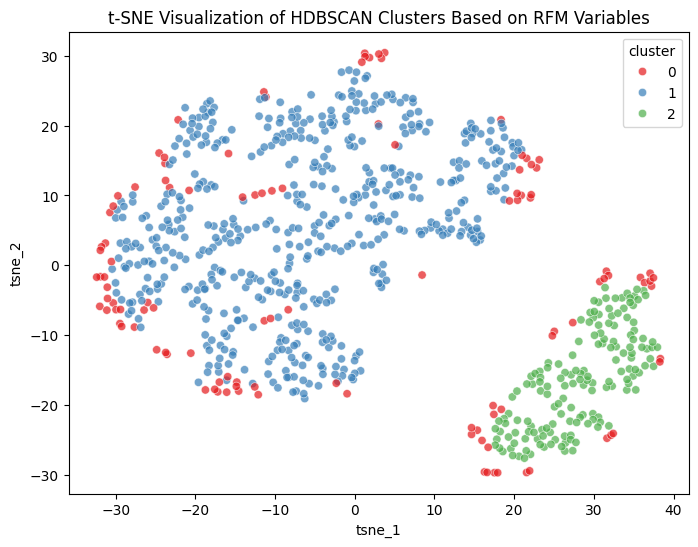

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(rfm_array)

# Add t-SNE results to 'rfm_dbscan_cluster_df'
rfm_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
rfm_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on RFM Variables')
plt.show()

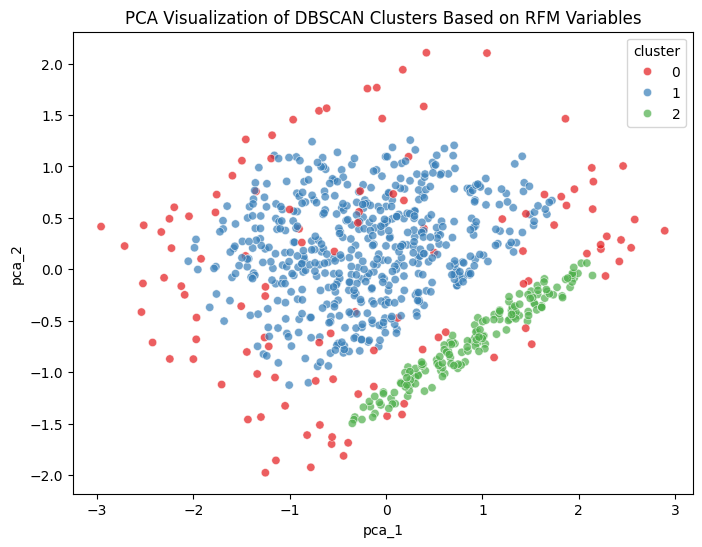

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(rfm_array)

# Add PCA results to 'rfm_kmeans_cluster_df'
rfm_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
rfm_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=rfm_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on RFM Variables')
plt.show()

In [ ]:
# Make cluster a string for discrete legend and add "(Noise)" for cluster 0
rfm_hdbscan_cluster_df['cluster_str'] = rfm_hdbscan_cluster_df['cluster'].apply(
    lambda x: f'Cluster {x} (Noise)' if x == 0 else f'Cluster {x}'
)

# Define custom colors
custom_colors = {
    'Cluster 0 (Noise)': 'darkblue',  # Cluster O is Noise
    'Cluster 1': 'palevioletred',
    'Cluster 2': 'orange',
}

# Define desired order for legend
category_order = {
    'cluster_str': ['Cluster 0 (Noise)', 'Cluster 1', 'Cluster 2']
}

# Create 3D scatterplot with custom colors
fig = px.scatter_3d(
    rfm_hdbscan_cluster_df,
    x='recency',
    y='frequency',
    z='monetary',
    color='cluster_str',
    opacity=0.5,
    color_discrete_map=custom_colors,
    category_orders=category_order  # force legend order
)

# Customize plot layout
fig.update_layout(
    title='3D Visualization of HDBSCAN Clusters Based on RFM Variables',
    title_x=0.45,
    title_xanchor='center',
    title_y=0.95,
    legend_title='Cluster',
    margin=dict(l=5, r=5, b=5, t=5),
    legend=dict(
        x=0.7,
        y=1.0,
        xanchor='left',
        yanchor='top'
    ),
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig.show()

# Gaussian Mixture Model

In [16]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)

In [17]:
household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [18]:
# Extract recency, frequency, and monetary variables
rfm_features= household_profile_df[['recency', 'frequency', 'monetary']]

In [19]:
# Define the range for k values from 2 to 10
k_range = range(2, 11)
# Perform GMM clustering for each k and store evaluation metrics
gmm_results = []

for k in k_range:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type="full",
        random_state=42
    )

    labels = gmm.fit_predict(rfm_features)

    gmm_results.append({
        "k": k,
        "silhouette": silhouette_score(rfm_features, labels),
        "davies_bouldin": davies_bouldin_score(rfm_features, labels),
        "calinski_harabasz": calinski_harabasz_score(rfm_features, labels)
    })

rfm_gmm_results_df = pd.DataFrame(gmm_results)
rfm_gmm_results_df.head(10)

,k,silhouette,davies_bouldin,calinski_harabasz
0,2,0.309688,1.199327,456.038646
1,3,0.241159,1.317992,323.842516
2,4,0.140736,2.440591,191.885873
3,5,0.254032,1.232754,379.235948
4,6,0.091012,2.537973,141.567672
5,7,0.070422,3.238685,121.438910
6,8,0.054572,2.764300,111.389012
7,9,0.054570,2.588552,115.923518
8,10,0.032023,3.502834,89.703802


In [20]:
# Identify best k
best_k_silhouette_row = rfm_gmm_results_df.loc[
    rfm_gmm_results_df["silhouette"].idxmax()
]

best_k_db_row = rfm_gmm_results_df.loc[
    rfm_gmm_results_df["davies_bouldin"].idxmin()
]

best_k_ch_row = rfm_gmm_results_df.loc[
    rfm_gmm_results_df["calinski_harabasz"].idxmax()
]
# Print results
print(f"Best Silhouette Score: {best_k_silhouette_row['silhouette']:.6f} at k = {best_k_silhouette_row['k']}")
print(f"Best Davies-Bouldin Index: {best_k_db_row['davies_bouldin']:.6f} at k = {best_k_db_row['k']}")
print(f"Best Calinski-Harabasz Index: {best_k_ch_row['calinski_harabasz']:.6f} at k = {best_k_ch_row['k']}")
# usually prioritized
best_k_RFM_GMM = best_k_silhouette_row['k']

Best Silhouette Score: 0.309688 at k = 2.0
Best Davies-Bouldin Index: 1.199327 at k = 2.0
Best Calinski-Harabasz Index: 456.038646 at k = 2.0


**Interpretation**

- Based on Silhouette score, the highest value (0.309) is at k=2, which provides the best clustering.

- Based on Davies-Bouldin Index (DBI), the lowest value (1.199) is at k = 2, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (456.038) is at k=2, which provides the strongest clustering.
<br>

- The best k is 2




In [21]:
# Fit final GMM model using best k
final_gmm = GaussianMixture(
    n_components=int(best_k_RFM_GMM),
    covariance_type="full",
    random_state=42
)

household_profile_df["Cluster"] = final_gmm.fit_predict(rfm_features)

In [22]:
# Calculate validation metrics for best k
silhouette_best = silhouette_score(rfm_features, household_profile_df["Cluster"])
db_best = davies_bouldin_score(rfm_features, household_profile_df["Cluster"])
ch_best = calinski_harabasz_score(rfm_features, household_profile_df["Cluster"])

validation_summary = pd.DataFrame({
    "Metric": ["Silhouette", "Davies-Bouldin", "Calinski-Harabasz"],
    "Score": [silhouette_best, db_best, ch_best]
})
validation_summary.head(10)


,Metric,Score
0,Silhouette,0.309688
1,Davies-Bouldin,1.199327
2,Calinski-Harabasz,456.038646


In [23]:
# Columns of interest for clustering based on RFM variables
rfm_cols_GMM = ['inverse_frequency', 'inverse_recency', 'inverse_monetary']

# Group by cluster and calculate count, median, and mean
rfm_GMM_summary = household_profile_df.groupby('Cluster')[rfm_cols_GMM] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_GMM_summary

,count,median_frequency,median_recency,median_monetary
Cluster,,,,
0,454,110.5,5.5,3205.31
1,347,211.0,1.0,7090.07


In [24]:
# Calculate eta-squared for RFM variables
def eta_squared(df, feature, cluster_col="Cluster"):
    overall_mean = df[feature].mean()
    ss_between = sum(
        len(g) * (g[feature].mean() - overall_mean) ** 2
        for _, g in df.groupby(cluster_col)
    )
    ss_total = sum((df[feature] - overall_mean) ** 2)
    return ss_between / ss_total

eta_sq = {
    feature: eta_squared(household_profile_df, feature)
    for feature in ["inverse_recency", "inverse_frequency", "inverse_monetary"]
}

eta_squared_df = pd.DataFrame.from_dict(
    eta_sq, orient="index", columns=["Eta-Squared"]
)
eta_squared_df.head(10)

,Eta-Squared
inverse_recency,0.098196
inverse_frequency,0.211635
inverse_monetary,0.340087


In [25]:
# Calculate average Cohen’s d across clusters
def cohens_d(x, y):
    pooled_std = np.sqrt((x.var() + y.var()) / 2)
    return abs(x.mean() - y.mean()) / pooled_std

cohens_d_results = {}

for feature in ["inverse_recency", "inverse_frequency", "inverse_monetary"]:
    d_values = []
    # Fix: Access unique cluster values from the DataFrame column
    clusters = household_profile_df["Cluster"].unique()

    for i in range(len(clusters)):
        for j in range(i + 1, len(clusters)):
            x = household_profile_df.loc[household_profile_df["Cluster"] == clusters[i], feature]
            y = household_profile_df.loc[household_profile_df["Cluster"] == clusters[j], feature]
            d_values.append(cohens_d(x, y))

    cohens_d_results[feature] = np.mean(d_values)

cohens_d_df = pd.DataFrame.from_dict(
    cohens_d_results, orient="index", columns=["Avg Cohen's d"]
)
cohens_d_df.head(10)

,Avg Cohen's d
inverse_recency,0.707092
inverse_frequency,0.996235
inverse_monetary,1.385693


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Inverse Monetary explains approximately 34.0% of the variance between customer clusters (η² = 0.340), which represents a large effect size. Additionally, inverse monetary shows a large average difference in group means across all pairwise cluster comparisons (average Cohen’s d = 1.386). This indicates that inverse monetary is the strongest variable in distinguishing customer segments.

2. Inverse Frequency explains approximately 21.2% of the variance between customer clusters (η² = 0.212), also indicating a large effect size. Furthermore, inverse frequency demonstrates a large average group mean difference across clusters (average Cohen’s d = 0.996). This suggests that inverse frequency plays a substantial role in separating customer segments.

3. Inverse Recency explains approximately 9.8% of the variance between customer clusters (η² = 0.098), corresponding to a medium effect size. In contrast, the average Cohen’s d for inverse recency (d = 0.707) indicates a medium difference in group means across cluster pairs. This implies that inverse recency contributes to cluster differentiation, but to a lesser extent compared with inverse monetary and inverse frequency.

4. Overall, these results suggest that inverse monetary and inverse frequency are the most important variables for differentiating customer clusters, while inverse recency plays a secondary role. The findings indicate that spending value and purchase frequency are more influential in defining customer segments than recency when using inverse RFM variables.



In [26]:
# Calculate and display cluster proportions
cluster_proportions = (
    household_profile_df["Cluster"]
    .value_counts(normalize=True)
    .sort_index()
    .rename("Proportion")
    .to_frame()
)
cluster_proportions

,Proportion
Cluster,
0,0.566792
1,0.433208


In [27]:
from mpl_toolkits.mplot3d import Axes3D

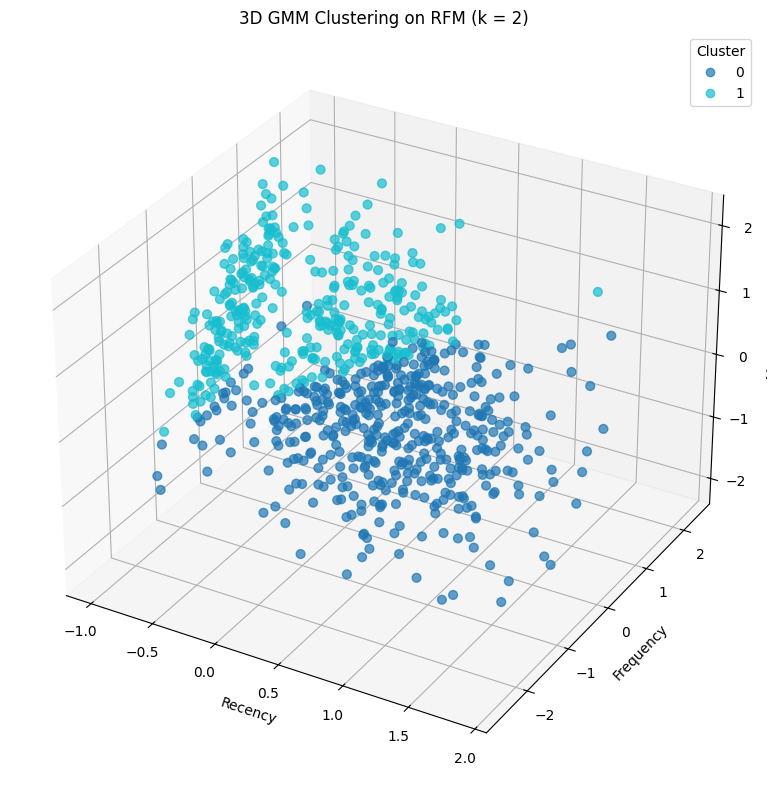

In [28]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(
    rfm_features['recency'],   # Recency
    rfm_features['frequency'],   # Frequency
    rfm_features['monetary'],   # Monetary
    c=household_profile_df["Cluster"],
    cmap="tab10",
    alpha=0.7,
    s=40
)

ax.set_xlabel("Recency")
ax.set_ylabel("Frequency")
ax.set_zlabel("Monetary")
ax.set_title(f"3D GMM Clustering on RFM (k = {int(best_k_RFM_GMM)})")

legend = ax.legend(
    *scatter.legend_elements(),
    title="Cluster",
    loc="upper right"
)

plt.tight_layout()
plt.show()

In [49]:
    import hdbscan
    from hdbscan.validity import validity_index

    dbcv = validity_index(
        X=rfm_features.values,
        labels=labels,
        metric='euclidean'
    )

    print(f"DBCV Score (SOM): {dbcv:.4f}")

DBCV Score (SOM): -0.5924


In [29]:
from sklearn.manifold import TSNE

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
)

rfm_tsne = tsne.fit_transform(rfm_features)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [30]:
cluster_summary = (
    household_profile_df.groupby("Cluster")[["recency", "frequency", "monetary"]]
    .mean()
    .sort_values(["frequency", "monetary"])
)

cluster_labels = {
    cluster: label
    for cluster, label in zip(
        cluster_summary.index,
        [
            "Infrequent & Low-Value",
            "Mid-Frequent & Low-Value",
            "Mid-Frequent & Mid-Value",
            "Frequent & High-Value"
        ]
    )
}


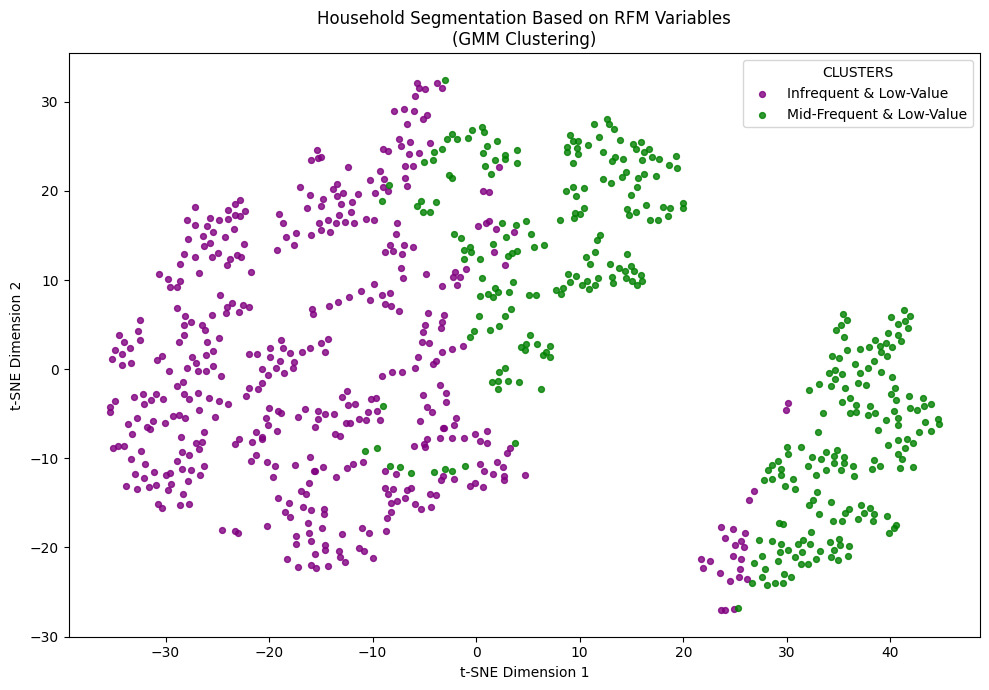

In [33]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

colors = ["purple", "green",   "red", "dodgerblue"]

for cluster in sorted(household_profile_df["Cluster"].unique()):
    mask = household_profile_df["Cluster"] == cluster
    plt.scatter(
        rfm_tsne[mask, 0],
        rfm_tsne[mask, 1],
        s=18,
        alpha=0.8,
        color=colors[cluster],
        label=cluster_labels.get(cluster, f"Cluster {cluster}")
    )

plt.title("Household Segmentation Based on RFM Variables\n(GMM Clustering)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.legend(title="CLUSTERS", frameon=True)
plt.grid(False)
plt.tight_layout()
plt.show()

# Self Organizing Maps Model

In [34]:
pip install minisom

  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.5-py3-none-any.whl size=12031 sha256=91e4f2f43b3cd8c81be1d27ef44421c07b0da48831943de0e2de648ebeec2dba
  Stored in directory: /root/.cache/pip/wheels/0f/8c/a4/5b7aa56fa6ef11d536d45da775bcc5a2a1c163ff0f8f11990b
Successfully built minisom


In [35]:
from minisom import MiniSom
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)

In [36]:
# Extract recency, frequency, and monetary variables
rfm_features= household_profile_df[['recency', 'frequency', 'monetary']]

In [37]:
# Define the range for k values from 2 to 10
k_range = range(2, 11)
# Perform SOM clustering for each k and store validation metrics
som_results = []

for k in k_range:
    grid_size = int(np.ceil(np.sqrt(k)))

    som = MiniSom(
        x=grid_size,
        y=grid_size,
        input_len=rfm_features.shape[1],
        sigma=1.0,
        learning_rate=0.5,
        random_seed=42
    )

    #
    som.random_weights_init(rfm_features.values)
    som.train_random(rfm_features.values, num_iteration=3000)

    # SOM node weights
    weights = som.get_weights().reshape(-1, rfm_features.shape[1])

    # KMeans on SOM codebook vectors
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(weights)

    # Assign each observation to a SOM node → cluster
    labels = []
    for x in rfm_features.values: # Also use .values here
        winner = som.winner(x)
        node_index = winner[0] * grid_size + winner[1]
        labels.append(kmeans.labels_[node_index])

    labels = np.array(labels)

    som_results.append({
        "k": k,
        "silhouette": silhouette_score(rfm_features, labels),
        "davies_bouldin": davies_bouldin_score(rfm_features, labels),
        "calinski_harabasz": calinski_harabasz_score(rfm_features, labels)
    })

rfm_som_results_df = pd.DataFrame(som_results)
rfm_som_results_df.head(10)

,k,silhouette,davies_bouldin,calinski_harabasz
0,2,0.294606,0.992397,304.317895
1,3,0.250322,1.199600,332.433644
2,4,0.287235,1.054604,422.842856
3,5,0.230258,1.058157,305.727504
4,6,0.222754,1.189737,305.807103
5,7,0.210387,1.219869,302.415985
6,8,0.223705,1.203470,306.724953
7,9,0.225803,1.190041,295.817575
8,10,0.226464,1.144808,268.050197


In [38]:
# Identify best k
best_silhouette_result = rfm_som_results_df.loc[
    rfm_som_results_df["silhouette"].idxmax()
]

best_db_result = rfm_som_results_df.loc[
    rfm_som_results_df["davies_bouldin"].idxmin()
]

best_ch_result = rfm_som_results_df.loc[
    rfm_som_results_df["calinski_harabasz"].idxmax()
]
# Print results
print(f"Best Silhouette Score: {best_silhouette_result['silhouette']:.6f} at k = {best_silhouette_result['k']}")
print(f"Best Davies-Bouldin Index: {best_db_result['davies_bouldin']:.6f} at k = {best_db_result['k']}")
print(f"Best Calinski-Harabasz Index: {best_ch_result['calinski_harabasz']:.6f} at k = {best_ch_result['k']}")
# Assign the scalar k value for the best silhouette score
best_k_RFM_SOM = best_ch_result['k']

Best Silhouette Score: 0.294606 at k = 2.0
Best Davies-Bouldin Index: 0.992397 at k = 2.0
Best Calinski-Harabasz Index: 422.842856 at k = 4.0


Interpretation

Based on Silhouette score, the highest value (0.294) is at k=2, which provides the best clustering.

Based on Davies-Bouldin Index (DBI), the lowest value (0.992) is at k = 2, which provides the strongest clustering.

Based on Calinski-Harabasz Index (CHI), the highest value (442.842) is at k=4, which provides the strongest clustering.


The best k is 4 because it has the second highest Silhouette score of 0.287, and second lowest Davies-Bouldin Index of 1.054, while k=2 is too simple to capture cluster structure and identify more subtle behaviours

In [39]:
# Fit final SOM model using best k
grid_size = int(np.ceil(np.sqrt(best_k_RFM_SOM)))

final_som = MiniSom(
    x=grid_size,
    y=grid_size,
    input_len=rfm_features.shape[1],
    sigma=1.0,
    learning_rate=0.5,
    random_seed=42
)

final_som.random_weights_init(rfm_features.values)
final_som.train_random(rfm_features.values, num_iteration=5000)

# KMeans on SOM nodes
weights = final_som.get_weights().reshape(-1, rfm_features.shape[1])
kmeans_final = KMeans(n_clusters=int(best_k_RFM_SOM), random_state=42)
kmeans_final.fit(weights)

# Assign clusters
clusters = []
for x in rfm_features.values:
    winner = final_som.winner(x)
    node_index = winner[0] * grid_size + winner[1]
    clusters.append(kmeans_final.labels_[node_index])

household_profile_df["Cluster"] = np.array(clusters)

In [40]:
# Calculate validation metrics for best k
validation_summary = pd.DataFrame({
    "Metric": ["Silhouette", "Davies-Bouldin", "Calinski-Harabasz"],
    "Score": [
        silhouette_score(rfm_features, household_profile_df["Cluster"]),
        davies_bouldin_score(rfm_features, household_profile_df["Cluster"]),
        calinski_harabasz_score(rfm_features, household_profile_df["Cluster"])
    ]
})
validation_summary.head(10)

,Metric,Score
0,Silhouette,0.286988
1,Davies-Bouldin,1.085634
2,Calinski-Harabasz,430.964517


In [41]:
# Columns of interest for clustering based on RFM variables
rfm_cols_SOM = ['inverse_frequency', 'inverse_recency', 'inverse_monetary']

# Group by cluster and calculate count, median, and mean
rfm_SOM_summary = household_profile_df.groupby('Cluster')[rfm_cols_SOM] \
    .agg(
        count=('inverse_frequency', 'size'),  # count of rows per cluster
        median_frequency=('inverse_frequency', 'median'),
        median_recency=('inverse_recency', 'median'),
        median_monetary=('inverse_monetary', 'median'),
    )

# Display the summary
rfm_SOM_summary

,count,median_frequency,median_recency,median_monetary
Cluster,,,,
0,187,133.0,0.0,3712.140
1,205,80.0,8.0,2657.910
2,159,310.0,1.0,9618.900
3,250,153.5,5.0,5519.185


In [42]:
# Calculate eta-squared for RFM variables
def eta_squared(df, feature, cluster_col="Cluster"):
    overall_mean = df[feature].mean()
    ss_between = sum(
        len(g) * (g[feature].mean() - overall_mean) ** 2
        for _, g in df.groupby(cluster_col)
    )
    ss_total = sum((df[feature] - overall_mean) ** 2)
    return ss_between / ss_total

eta_squared_df = pd.DataFrame({
    feature: eta_squared(household_profile_df, feature)
    for feature in ["inverse_recency", "inverse_frequency", "inverse_monetary"]
}, index=["Eta-Squared"]).T
eta_squared_df.head(10)

,Eta-Squared
inverse_recency,0.156977
inverse_frequency,0.509519
inverse_monetary,0.534195


In [43]:
# Calculate average Cohen’s d
def cohens_d(x, y):
    pooled_std = np.sqrt((x.var() + y.var()) / 2)
    return abs(x.mean() - y.mean()) / pooled_std

cohens_d_results = {}

for feature in ["inverse_recency", "inverse_frequency", "inverse_monetary"]:
    d_values = []
    clusters = household_profile_df["Cluster"].unique()

    for i in range(len(clusters)):
        for j in range(i + 1, len(clusters)):
            x = household_profile_df.loc[household_profile_df["Cluster"] == clusters[i], feature]
            y = household_profile_df.loc[household_profile_df["Cluster"] == clusters[j], feature]
            d_values.append(cohens_d(x, y))

    cohens_d_results[feature] = np.mean(d_values)

cohens_d_df = pd.DataFrame.from_dict(
    cohens_d_results, orient="index", columns=["Avg Cohen's d"]
)
cohens_d_df.head(10)

,Avg Cohen's d
inverse_recency,0.666152
inverse_frequency,1.438793
inverse_monetary,1.524171


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Inverse Monetary explains approximately 53.4% of the variance between customer clusters (η² = 0.534), indicating a large effect size. In addition, inverse monetary exhibits a large average difference in group means across all pairwise cluster comparisons (average Cohen’s d = 1.524). This finding suggests that inverse monetary is a dominant factor in distinguishing customer segments and reflects substantial variation in customer value across clusters.

2. Inverse Frequency accounts for approximately 50.9% of the variance between customer clusters (η² = 0.510), which also represents a large effect size. Consistently, the average Cohen’s d for inverse frequency (d = 1.439) indicates a large difference in group means across clusters. This result highlights inverse frequency as a highly influential variable in segment differentiation, underscoring the importance of purchasing intensity in defining customer groups.

3. Inverse Recency explains approximately 15.7% of the variance between customer clusters (η² = 0.157), corresponding to a large effect size based on Eta-squared interpretation guidelines. However, the average Cohen’s d for inverse recency (d = 0.666) indicates a medium difference in group means across cluster pairs. This suggests that while inverse recency contributes meaningfully to cluster differentiation, its discriminative power is less pronounced compared with inverse monetary and inverse frequency.

4. Overall, these results indicate that inverse monetary and inverse frequency are the most important variables for differentiating customer clusters, as evidenced by both large proportions of explained variance and large average group mean differences. In contrast, inverse recency plays a secondary role, contributing to cluster separation but with a comparatively weaker impact. Collectively, the findings suggest that customer value and purchasing frequency are more critical determinants of segment structure than recency when inverse RFM variables are employed.



In [44]:
# Calculate and display cluster proportions
cluster_proportions = (
    household_profile_df["Cluster"]
    .value_counts(normalize=True)
    .sort_index()
    .rename("Proportion")
    .to_frame()
)
cluster_proportions

,Proportion
Cluster,
0,0.233458
1,0.255930
2,0.198502
3,0.312110


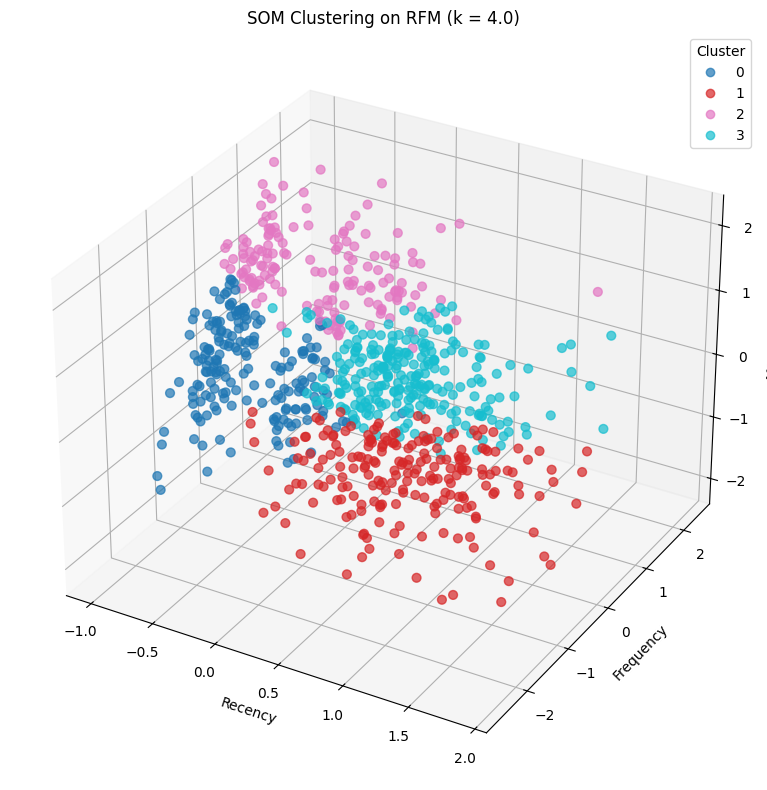

In [45]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(
    household_profile_df["recency"],
    household_profile_df["frequency"],
    household_profile_df["monetary"],
    c=household_profile_df["Cluster"],
    cmap="tab10",
    alpha=0.7,
    s=40
)

ax.set_xlabel("Recency")
ax.set_ylabel("Frequency")
ax.set_zlabel("Monetary")
ax.set_title(f"SOM Clustering on RFM (k = {best_k_RFM_SOM})")

legend = ax.legend(
    *scatter.legend_elements(),
    title="Cluster",
    loc="upper right"
)

plt.tight_layout()
plt.show()


In [46]:

    import hdbscan
    from hdbscan.validity import validity_index

    dbcv = validity_index(
        X=rfm_features.values,
        labels=labels,
        metric='euclidean'
    )

    print(f"DBCV Score (SOM): {dbcv:.4f}")

DBCV Score (SOM): -0.5924


In [46]:
from sklearn.manifold import TSNE

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
)

rfm_tsne = tsne.fit_transform(rfm_features)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [48]:
cluster_summary = (
    household_profile_df.groupby("Cluster")[["recency", "frequency", "monetary"]]
    .mean()
    .sort_values(["frequency", "monetary"])
)

cluster_labels = {
    cluster: label
    for cluster, label in zip(
        cluster_summary.index,
        [
            "Infrequent & Low-Value",
            "Mid-Frequent & Low-Value",
            "Mid-Frequent & Mid-Value",
            "Frequent & High-Value"
        ]
    )
}



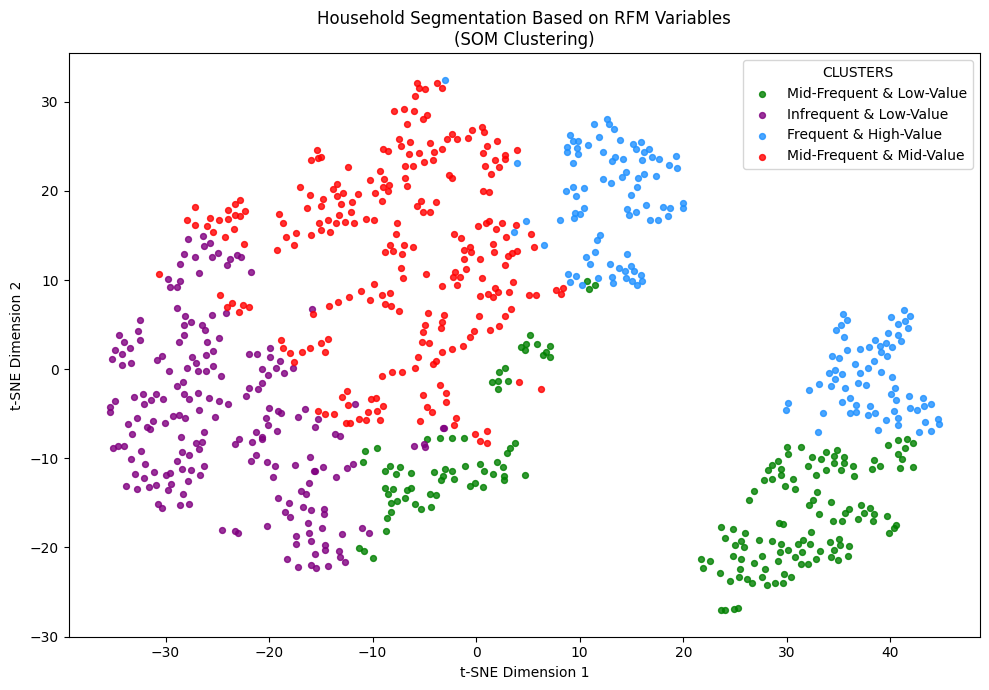

In [51]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

colors = ["green","purple",  "dodgerblue", "red" ]

for cluster in sorted(household_profile_df["Cluster"].unique()):
    mask = household_profile_df["Cluster"] == cluster
    plt.scatter(
        rfm_tsne[mask, 0],
        rfm_tsne[mask, 1],
        s=18,
        alpha=0.8,
        color=colors[cluster],
        label=cluster_labels.get(cluster, f"Cluster {cluster}")
    )

plt.title("Household Segmentation Based on RFM Variables\n(SOM Clustering)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.legend(title="CLUSTERS", frameon=True)
plt.grid(False)
plt.tight_layout()
plt.show()


# Demographic

## Model 7: K-Means

In [52]:
# Display first 5 rows of the dataset
household_profile_df[['age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded']].head()

,age_encoded,income_encoded,household_size_encoded,kid_category_encoded
0,2.0,-0.333333,0.0,0.0
1,0.0,0.000000,0.0,0.0
2,-2.0,-0.666667,0.5,1.0
3,-2.0,0.333333,1.0,2.0
4,0.0,0.000000,-0.5,0.0


In [53]:
# Extract 'age_encoded', 'income_encoded', 'household_size_encoded' and 'kid_category_encoded' variables from house_profile dataset
# and converts them into NumPy array.
demographic_array = household_profile_df[['age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded']].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [54]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
demographic_pca = pca.fit_transform(demographic_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_kmeans_results' for comparison across different k.
demographic_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(demographic_pca)

    demographic_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert results to DataFrame
demographic_kmeans_results_df = pd.DataFrame(demographic_kmeans_results)
demographic_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,1811.495902,0.324635,1.243834,415.346913
1,3,1144.419109,0.397485,0.935331,560.889286
2,4,904.142043,0.382402,0.897232,543.305820
3,5,757.360813,0.392071,0.943374,524.408481
4,6,674.163170,0.393011,0.967981,490.329974
5,7,603.878435,0.343668,1.098422,470.994111
6,8,544.118664,0.368902,0.938227,459.925758
7,9,495.740465,0.368292,0.979483,450.811949
8,10,455.064105,0.385681,0.964683,443.845494


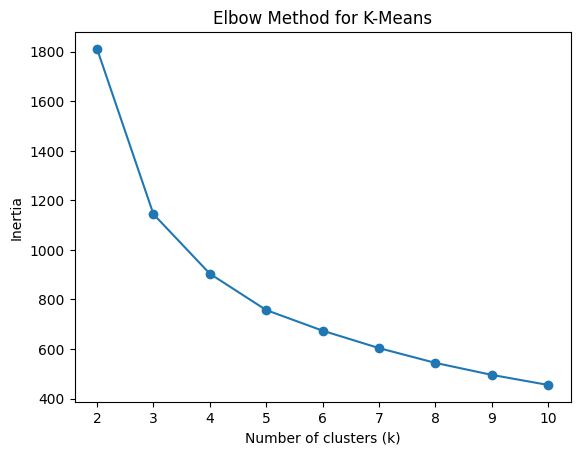

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(demographic_kmeans_results_df['k'], demographic_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = demographic_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.397485 at k = 3.0
Best Davies-Bouldin Index: 0.897232 at k = 4.0
Best Calinski-Harabasz Index: 560.889286 at k = 3.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4.

- Based on Silhouette score, the highest value (0.397) is at k=3, which provides the best clustering. Then, the second highest value (0.393) is at k=6.

- Based on Davies-Bouldin Index (DBI), the lowest value (0.897) is at k = 4, which provides the strongest clustering. Then, it is followed by k=3 (0.935).

- Based on Calinski-Harabasz Index (CHI), the highest value (560.889) is at k=3, which provides the strongest clustering. Then, the second highest value (543.305) is at k=4.
<br>

- The best k is 5 because:
1.   it provides clearer and more interpretable clusters compared to k=3 or 4
2.   based on the elbow method, the inertia curve shows a noticeable flattening, and increasing k beyond value 5 gives smaller benefits.
2.   it has the third highest Silhouette score of 0.392
3.   it has moderate Davies-Bouldin Index (DBI) of 0.943
4.   it has the third highest Calinski-Harabasz Index (CHI) of 524.408




In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final K-Means model using k=5
final_k = 5
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(demographic_pca)

# Add cluster labels to the demographic_kmeans_cluster_df
demographic_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=5
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_kmeans_cluster_df.head(5)

Silhouette Score for k=5: 0.392071
Davies-Bouldin Index for k=5: 0.943374
Calinski-Harabasz Index for k=5: 524.408481


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,3
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,5
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on demographic variables
demographic_cols_of_interest = ['inverse_age_encoded', 'inverse_income_encoded',
                                'inverse_household_size_encoded', 'inverse_kid_category_encoded']

# Initialize an empty list to store cluster summaries
demographic_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_kmeans_cluster_summary = pd.DataFrame(demographic_kmeans_cluster_summary)

# Display the summary
demographic_kmeans_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,326,45-54,50-74K,2,0
1,2,82,45-54,150-174K,2,0
2,3,118,65+,35-49K,2,0
3,4,128,35-44,50-74K,5+,3+
4,5,147,25-34,35-49K,2,0


In [ ]:
class CategoricalClusterDifferentiationAnalyzer:
    """
    Measures how well categorical variables differentiate clusters using
    Cramér’s V and cluster purity.
    """

    def __init__(self, df, cluster_col='cluster', noise_cluster=None):
        self.df = df.copy()
        self.cluster_col = cluster_col

        # Exclude noise cluster if specified
        if noise_cluster is not None:
            self.df = self.df[self.df[cluster_col] != noise_cluster]

    # 1. Cramér’s V
    def calculate_cramers_v(self, variable):
        confusion_matrix = pd.crosstab(self.df[variable], self.df[self.cluster_col])
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.values.sum()
        r, k = confusion_matrix.shape

        return np.sqrt(chi2 / (n * min(r - 1, k - 1))) if n > 0 else np.nan

    # 2. Average cluster purity
    def calculate_avg_cluster_purity(self, variable):
        purities = []

        for _, group in self.df.groupby(self.cluster_col):
            counts = group[variable].value_counts()
            purities.append(counts.max() / counts.sum())

        return np.mean(purities) if purities else np.nan

    # 3. Compare all features
    def compare_all_features(self, feature_list):
        results = []

        for feature in feature_list:
            results.append({
                'variable': feature,
                'cramers_v': self.calculate_cramers_v(feature),
                'avg_cluster_purity': self.calculate_avg_cluster_purity(feature)
            })

        return pd.DataFrame(results).set_index('variable')

In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_kmeans_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
demographic_kmeans_differentiation = demographic_kmeans_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_kmeans_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,0.658608,0.565715
inverse_income_encoded,0.377411,0.271916
inverse_household_size_encoded,0.496974,0.493182
inverse_kid_category_encoded,0.587357,0.752839


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

Based on the result above:
1. Age group has the strongest association with the clusters, which means it strongly influences cluster membership. However, its moderate average cluster purity (56.6%) indicates that individual clusters are not homogenous by age. Each cluster contains a dominant age group representing approximately 57% of its members, while the remaining 43% are distributed across other age groups.

2. Kid category group has a slightly weaker association with the clusters than age group. However, its higher cluster purity (75.3%) indicates that cluster are more homogenous by the number of children.

3. Household size group shows moderate association and moderate homogenous, suggestinng it is a supporting differentiator in cluster formation but not the dominant differentiator.

4. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster.










In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_kmeans_cluster_proportion = demographic_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_kmeans_cluster_proportion)

cluster
1    0.406991
2    0.102372
3    0.147316
4    0.159800
5    0.183521
Name: proportion, dtype: float64


The clusters are moderately imbalanced.

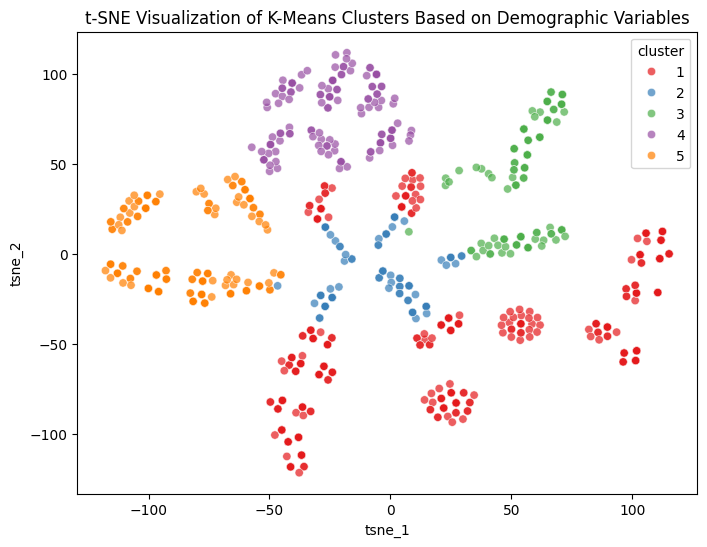

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_kmeans_cluster_df'
demographic_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on Demographic Variables')
plt.show()

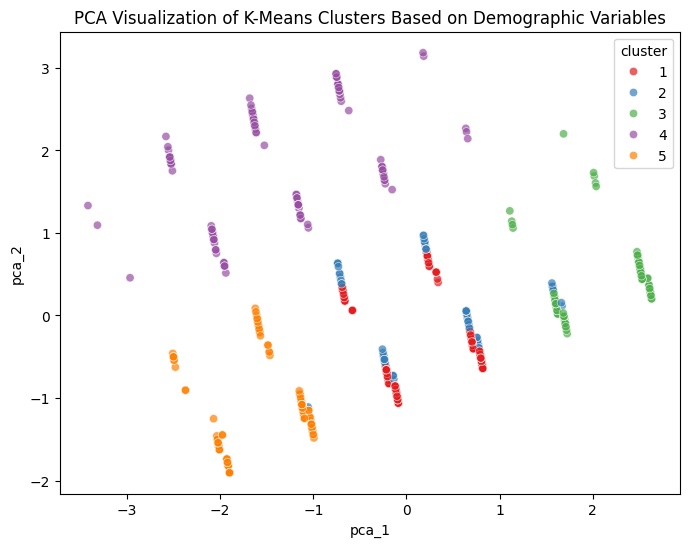

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
demographic_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on Demographic Variables')
plt.show()

## Model 8: Hierarchical Clustering (Ward Linkage)

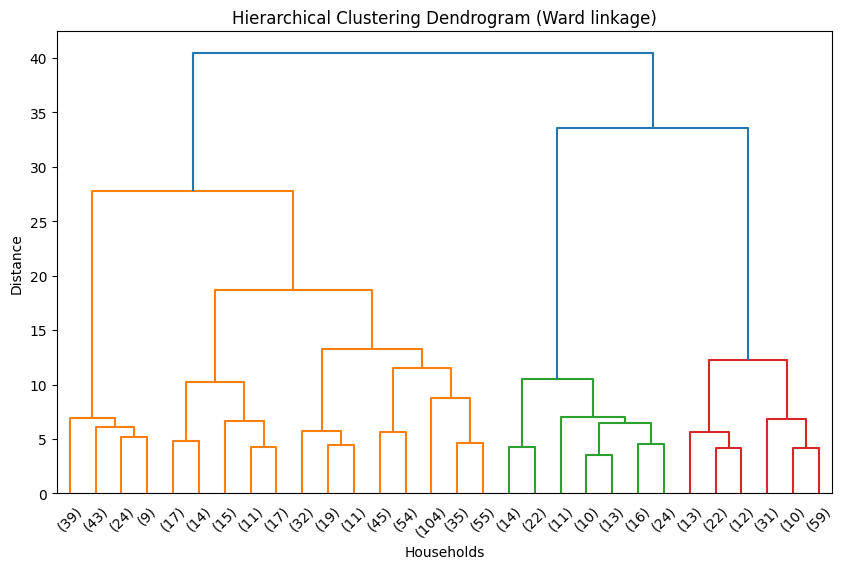

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Perform hierarchical clustering using Ward linkage.
demographic_hierarchical_ward = linkage(demographic_pca, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a visual separation at k=4

In [ ]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_ward_results' for comparison across different k.
demographic_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(demographic_pca)

    demographic_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_ward_results_df = pd.DataFrame(demographic_hierarchical_ward_results)
demographic_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.343501,1.376494,336.424923
1,3,0.363308,0.882771,400.638664
2,4,0.353440,0.924091,474.109271
3,5,0.385110,0.967368,473.756538
4,6,0.368736,0.988811,443.944214
5,7,0.370346,1.004754,427.350555
6,8,0.358644,0.953563,419.819353
7,9,0.363477,0.986247,415.576242
8,10,0.377107,0.988872,418.633630


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.385110 at k = 5.0
Best Davies-Bouldin Index: 0.882771 at k = 3.0
Best Calinski-Harabasz Index: 474.109271 at k = 4.0


k=4 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=4
- Moderate Silhouette score of 0.353
- Davies-Bouldin Index is the second lowest at k=4 (0.924)
- Calinski-Harabasz index is the highest at k=4 (474.109)

In [ ]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_ward_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical ward clustering model using k=4
final_k = 4
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=4: 0.353440
Davies-Bouldin Index for k=4: 0.924091
Calinski-Harabasz Index for k=4: 474.109271


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,4
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_ward_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_ward_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_ward_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_ward_cluster_summary = pd.DataFrame(demographic_hierarchical_ward_cluster_summary)

# Display the summary
demographic_hierarchical_ward_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,429,45-54,50-74K,2,0
1,2,147,25-34,35-49K,2,0
2,3,110,35-44,50-74K,5+,3+
3,4,115,65+,35-49K,2,0


In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_hierarchical_ward_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_hierarchical_ward_cluster_df, cluster_col='cluster')

# Cluster differentiation results
demographic_hierarchical_ward_differentiation = demographic_hierarchical_ward_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_hierarchical_ward_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,0.743711,0.569989
inverse_income_encoded,0.194988,0.273616
inverse_household_size_encoded,0.547613,0.509092
inverse_kid_category_encoded,0.541999,0.757904


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

Based on the result above:
1. Age group has the strongest association with the clusters, which means it strongly influences cluster membership. However, its moderate average cluster purity (57%) indicates that individual clusters are not homogenous by age. Each cluster contains a dominant age group representing approximately 57% of its members, while the remaining 43% are distributed across other age groups.

2. Kid category group has a slightly weaker association with the clusters than age group. However, its higher cluster purity (75.79%) indicates that cluster are more homogenous by the number of children.

3. Household size group shows moderate association and moderate homogenous, suggestinng it is a supporting differentiator in cluster formation but not the dominant differentiator.

4. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster







In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_ward_cluster_proportion = demographic_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_ward_cluster_proportion)

cluster
1    0.535581
2    0.183521
3    0.137328
4    0.143571
Name: proportion, dtype: float64


The clusters are moderately imbalanced.

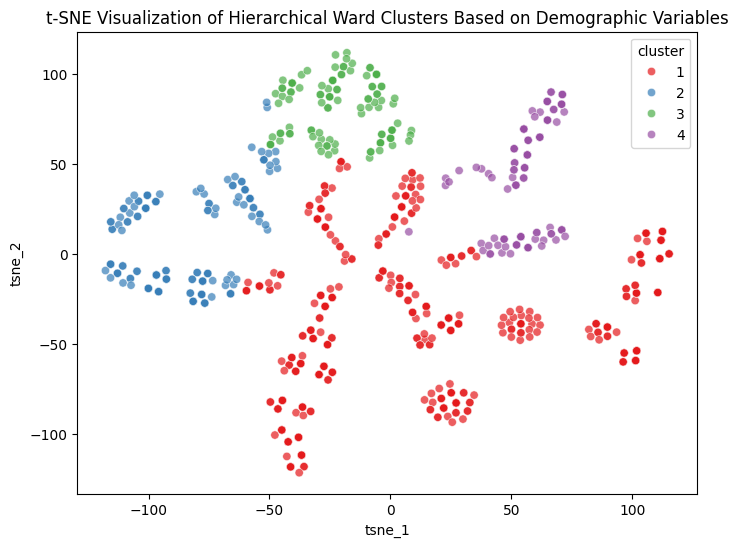

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on Demographic Variables')
plt.show()

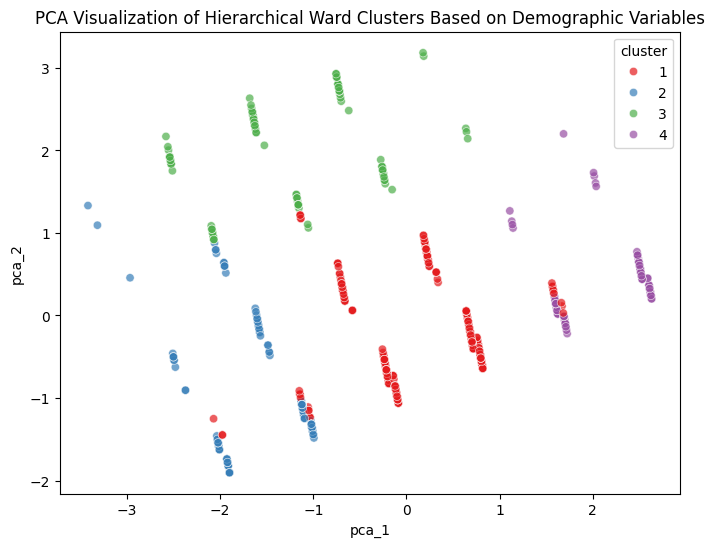

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_ward_cluster_df'
demographic_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on Demographic Variables')
plt.show()

## Model 9: Hierarchical Clustering (Average Linkage)

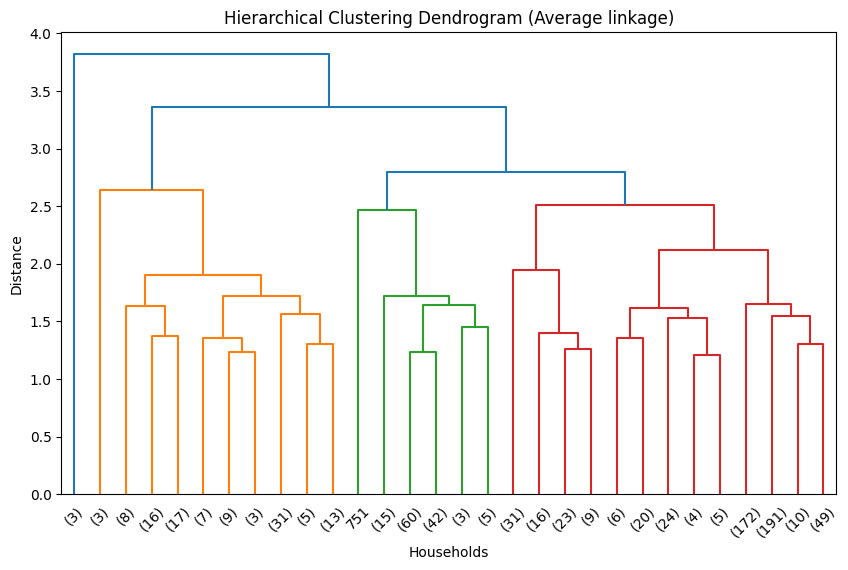

In [ ]:
# Perform hierarchical clustering using Average linkage.
demographic_hierarchical_average = linkage(demographic_pca, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=3

In [ ]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_average_results' for comparison across different k.
demographic_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(demographic_pca)

    demographic_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_average_results_df = pd.DataFrame(demographic_hierarchical_average_results)
demographic_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.356159,0.533856,10.647965
1,3,0.347573,0.781623,159.902894
2,4,0.320191,0.768178,285.741130
3,5,0.294264,0.744259,219.465510
4,6,0.301440,0.808652,269.144135
5,7,0.285564,0.744434,225.894073
6,8,0.303578,0.790316,247.095873
7,9,0.288875,0.786192,238.466235
8,10,0.283458,0.877049,231.928603


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.356159 at k = 2.0
Best Davies-Bouldin Index: 0.533856 at k = 2.0
Best Calinski-Harabasz Index: 285.741130 at k = 4.0


k=4 was selected for hierarchical average clustering based on its balanced performance:
- moderate Silhouette score of 0.320.
- moderate Davies-Bouldin index of 0.768.
- moderate Calinski-Harabasz index of 285.741.

In [ ]:
# Create a copy of the dataset to add hierarchical average cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_average_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical average clustering model using k=4
final_k = 4
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=4: 0.320191
Davies-Bouldin Index for k=4: 0.768178
Calinski-Harabasz Index for k=4: 285.741130


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,3
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,3
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_average_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_average_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_average_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_average_cluster_summary = pd.DataFrame(demographic_hierarchical_average_cluster_summary)

# Display the summary
demographic_hierarchical_average_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,112,35-44,50-74K,5+,3+
1,2,126,65+,35-49K,2,0
2,3,560,45-54,50-74K,2,0
3,4,3,19-24,250K+,1,0


In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_hierarchical_average_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_hierarchical_average_cluster_df, cluster_col='cluster')

# Cluster differentiation results
demographic_hierarchical_average_differentiation = demographic_hierarchical_average_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_hierarchical_average_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,0.588806,0.604911
inverse_income_encoded,0.281521,0.356002
inverse_household_size_encoded,0.552472,0.578522
inverse_kid_category_encoded,0.545725,0.831696


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

Based on the result above:
1. Age group has the strongest association with the clusters, which means it strongly influences cluster membership. However, its moderate average cluster purity (60.49%) indicates that individual clusters are not homogenous by age. Each cluster contains a dominant age group representing approximately 60% of its members, while the remaining 40% are distributed across other age groups.

2. Kid category group has a slightly weaker association with the clusters than age group. However, its higher cluster purity (83.17%) indicates that cluster are more homogenous by the number of children.

3. Household size group shows moderate association and moderate homogenous, suggestinng it is a supporting differentiator in cluster formation but not the dominant differentiator.

4. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster



In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_average_cluster_proportion = demographic_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_average_cluster_proportion)

cluster
1    0.139825
2    0.157303
3    0.699126
4    0.003745
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

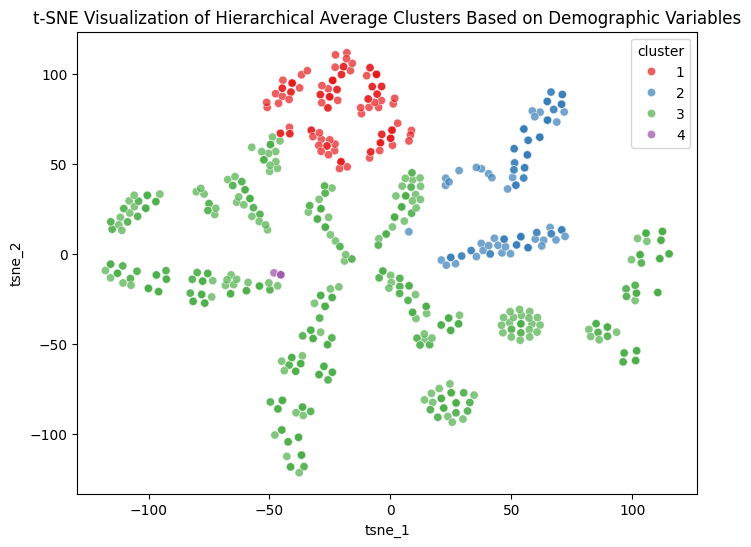

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on Demographic Variables')
plt.show()

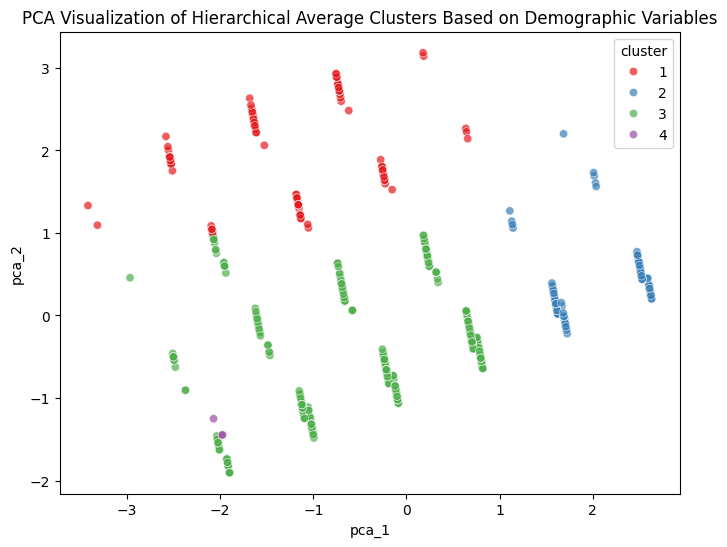

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_average_cluster_df'
demographic_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on Demographic Variables')
plt.show()

## Model 10: Hierarchical Clustering (Complete Linkage)

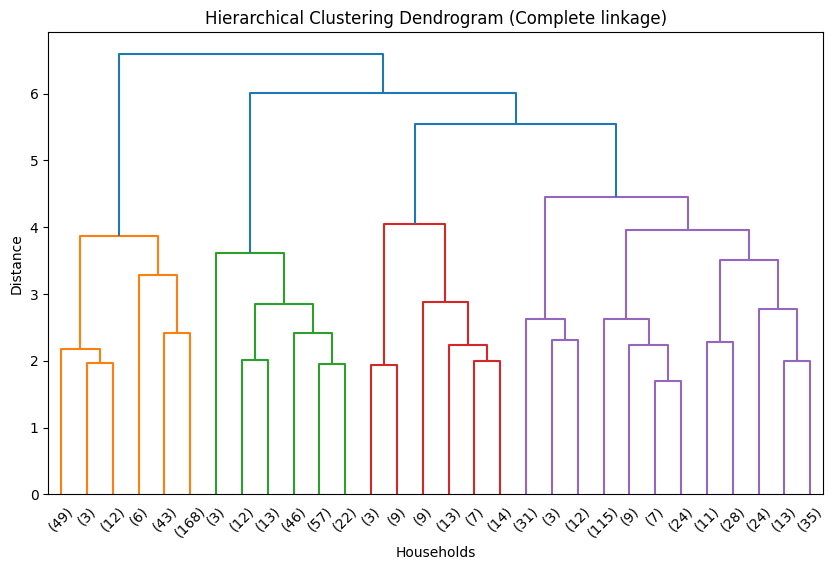

In [ ]:
# Perform hierarchical clustering using Complete linkage.
demographic_hierarchical_complete = linkage(demographic_pca, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(demographic_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=4

In [ ]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_hierarchical_complete_results' for comparison across different k.
demographic_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(demographic_pca)

    demographic_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(demographic_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(demographic_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(demographic_pca, labels)
    })

# Convert to DataFrame
demographic_hierarchical_complete_results_df = pd.DataFrame(demographic_hierarchical_complete_results)
demographic_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.262091,1.245486,338.402114
1,3,0.201360,1.410015,275.196482
2,4,0.213837,1.264233,285.975378
3,5,0.240592,1.331112,308.211409
4,6,0.239623,1.172166,258.900511
5,7,0.279109,1.114569,289.557425
6,8,0.247009,1.170208,282.785170
7,9,0.245372,1.081448,257.130163
8,10,0.259899,1.020782,260.320402


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = demographic_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.279109 at k = 7.0
Best Davies-Bouldin Index: 1.020782 at k = 10.0
Best Calinski-Harabasz Index: 338.402114 at k = 2.0


k=2 was selected for hierarchical complete clustering based on the following:
- Silhouette score is the second highest at k=2 (0.262)
- Moderate Davies-Bouldin Index of 1.245
- Calinski-Harabasz index is the highest at k=2 (338.402)

In [ ]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hierarchical_complete_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(demographic_pca)

# Add cluster labels to the 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(demographic_pca, cluster_labels)
dbi_score = davies_bouldin_score(demographic_pca, cluster_labels)
chi_score = calinski_harabasz_score(demographic_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.262091
Davies-Bouldin Index for k=2: 1.245486
Calinski-Harabasz Index for k=2: 338.402114


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Initialize an empty list to store cluster summaries
demographic_hierarchical_complete_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hierarchical_complete_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hierarchical_complete_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hierarchical_complete_cluster_summary = pd.DataFrame(demographic_hierarchical_complete_cluster_summary)

# Display the summary
demographic_hierarchical_complete_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,1,520,35-44,50-74K,2,0
1,2,281,45-54,50-74K,2,0


In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_hierarchical_complete_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_hierarchical_complete_cluster_df, cluster_col='cluster')

# Cluster differentiation results
demographic_hierarchical_complete_differentiation = demographic_hierarchical_complete_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_hierarchical_complete_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,0.763235,0.462339
inverse_income_encoded,0.276692,0.253312
inverse_household_size_encoded,0.414104,0.429260
inverse_kid_category_encoded,0.435435,0.758986


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

Based on the result above:
1. Age group has the strongest association with the clusters, which means it strongly influences cluster membership. However, its moderate average cluster purity (46.23%) indicates that individual clusters are not homogenous by age. Each cluster contains a dominant age group representing approximately 46% of its members, while the remaining 54% are distributed across other age groups.

2. Kid category group has a slightly weaker association with the clusters than age group. However, its higher cluster purity (75.9%) indicates that cluster are more homogenous by the number of children.

3. Household size group shows moderate association and moderate homogenous, suggestinng it is a supporting differentiator in cluster formation but not the dominant differentiator.

4. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hierarchical_complete_cluster_proportion = demographic_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hierarchical_complete_cluster_proportion)

cluster
1    0.649189
2    0.350811
Name: proportion, dtype: float64


The clusters are well-balanced.

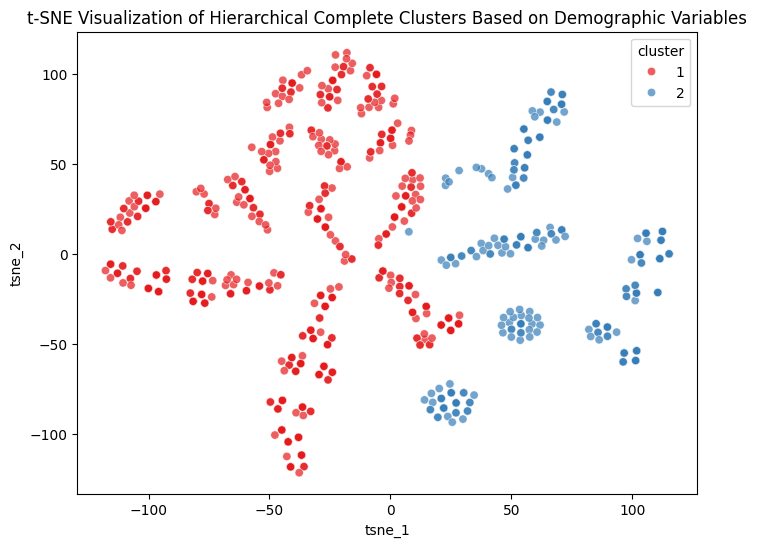

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca)

# Add t-SNE results to 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on Demographic Variables')
plt.show()

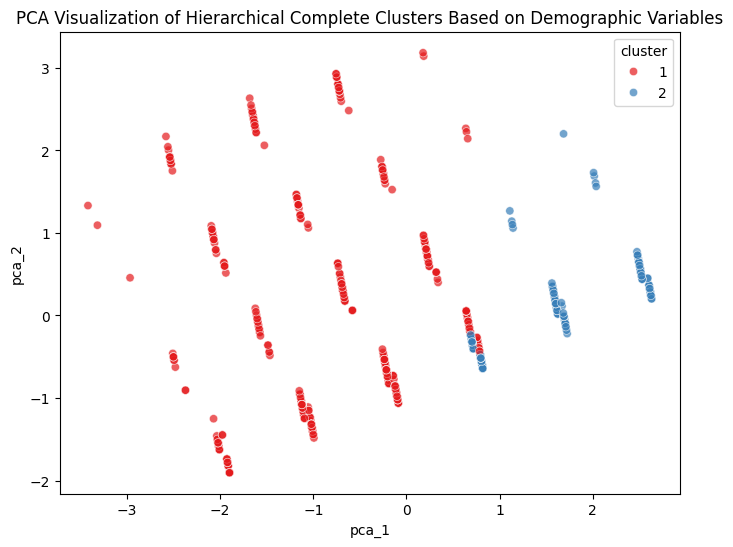

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca)

# Add PCA results to 'demographic_hierarchical_complete_cluster_df'
demographic_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on Demographic Variables')
plt.show()

## Model 11: DBSCAN

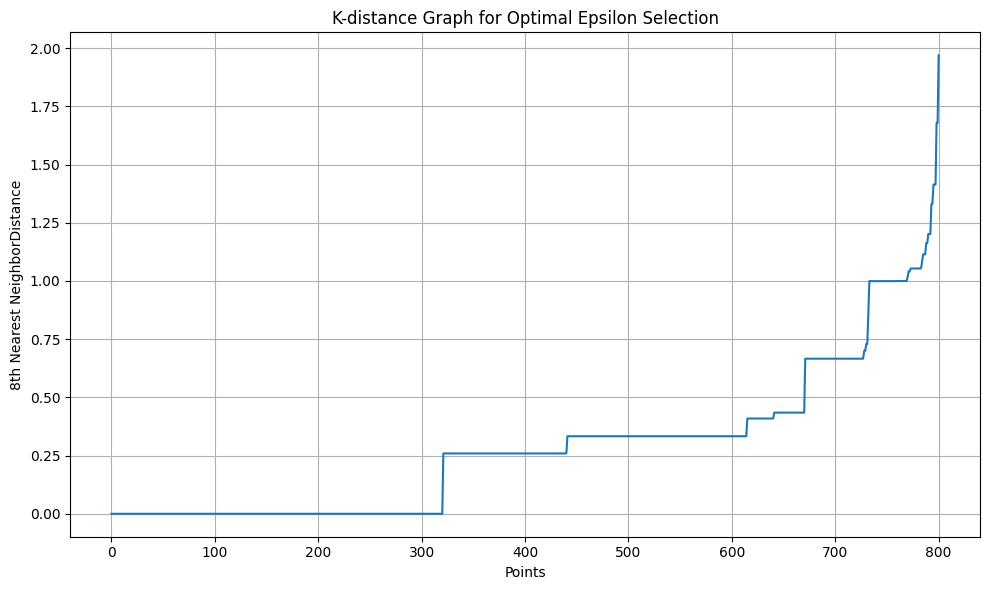

In [ ]:
# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 4 variables ('age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded'), so n_neighbors / min_samples = 8.

# Calculate distances to the 8 nearest neighbors for each point.
# The distance to the 8th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 8
demographic_neighbors = NearestNeighbors(n_neighbors=k).fit(demographic_pca)
distances, indices = demographic_neighbors.kneighbors(demographic_pca)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 1.0.

In [ ]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Add very small random noise to break duplicate ties for DBCV score
np.random.seed(42)
jitter_amount = 0.001  # Add very small noise, so it will not affect clustering
demographic_pca_jittered = demographic_pca + np.random.normal(0, jitter_amount, demographic_pca.shape)

# Define parameter ranges for DBSCAN
eps_range = [0.6, 0.7, 0.8, 0.9, 0.95, 0.98, 1.0]
min_samples_range = [7, 8, 9]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'demographic_dbscan_results'
# for comparison across different eps range and minimum samples range.
demographic_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering on 'demographic_pca_jittered'
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(demographic_pca_jittered)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = demographic_pca_jittered[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(demographic_pca_jittered, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        demographic_dbscan_results.append(result)

# Convert to DataFrame
demographic_dbscan_results_df = pd.DataFrame(demographic_dbscan_results)
demographic_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,0.60,7,16,65,0.081149,0.680319,0.438248,0.907030,284.408496
1,0.60,8,15,81,0.101124,0.669506,0.444740,0.900118,291.670956
2,0.60,9,15,88,0.109863,0.663207,0.447396,0.880146,290.534183
3,0.70,7,16,27,0.033708,0.683041,0.410450,1.115703,273.886510
4,0.70,8,15,37,0.046192,0.672955,0.412213,1.101000,287.724821
5,0.70,9,15,39,0.048689,0.679899,0.413747,1.093154,288.450070
6,0.80,7,16,27,0.033708,0.683041,0.410450,1.115703,273.886510
7,0.80,8,15,37,0.046192,0.672955,0.412213,1.101000,287.724821
8,0.80,9,15,39,0.048689,0.679899,0.413747,1.093154,288.450070
9,0.90,7,8,27,0.033708,0.371323,0.143385,1.534777,138.670442


In [ ]:
# Highest DBCV Score
best_dbcv_idx = demographic_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = demographic_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = demographic_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.683041 at eps = 0.7, min_samples = 7.0
Best Silhouette Score: 0.447396 at eps = 0.6, min_samples = 9.0
Best Davies-Bouldin Index: 0.880146 at eps = 0.6, min_samples = 9.0
Best Calinski-Harabasz Index: 291.670956 at eps = 0.6, min_samples = 8.0


We tested with different epsilon values (0.6, 0.7, 0.8, 0.9, 0.95, 0.98 & 1.0) and minimum samples values (7, 8 & 9).

eps=0.7 and min_sample = 7 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio equal to 0.034
- DBCV score is the highest at 0.683
- Moderate Silhouette score of 0.410
- Moderate Davies-Bouldin index of 1.116
- Moderate Calinski-Harabasz index of 273.887

In [ ]:
# Create a copy of the dataset to add DBSCAN cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_dbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 0.7
best_min_samples = 7
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(demographic_pca_jittered)

# Add cluster labels to the 'demographic_dbscan_cluster_df'
demographic_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.7 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = demographic_pca_jittered[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(demographic_pca_jittered, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_dbscan_cluster_df.head(5)

Number of clusters for eps=0.7 & min_samples=7: 16
Number of noise for eps=0.7 & min_samples=7: 27
Noise ratio for eps=0.7 & min_samples=7: 0.033708
DBCV Score for eps=0.7 & min_samples=7: 0.683041
Silhouette Score for eps=0.7 & min_samples=7: 0.410450
Davies-Bouldin Index for eps=0.7 & min_samples=7: 1.115703
Calinski-Harabasz Index for eps=0.7 & min_samples=7: 273.886510


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,3
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Initialize an empty list to store cluster summaries
demographic_dbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_dbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_dbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_dbscan_cluster_summary = pd.DataFrame(demographic_dbscan_cluster_summary)

# Display the summary
demographic_dbscan_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,27,55-64,250K+,3,1
1,1,67,65+,35-49K,2,0
2,2,211,45-54,50-74K,2,0
3,3,25,25-34,35-49K,3,1
4,4,20,25-34,25-34K,4,2
5,5,116,35-44,50-74K,2,0
6,6,80,25-34,50-74K,1,0
7,7,27,35-44,35-49K,5+,3+
8,8,21,45-54,125-149K,5+,3+
9,9,31,19-24,35-49K,1,0


Note: Cluser 0 is noise.

In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_dbscan_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_dbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
demographic_dbscan_differentiation = demographic_dbscan_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_dbscan_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,1.000000,1.000000
inverse_income_encoded,0.134606,0.294406
inverse_household_size_encoded,0.806763,0.779933
inverse_kid_category_encoded,1.000000,1.000000


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

For DBSCAN, we have excluded the noise cluster (cluster 0) when calculating Cramer's V values because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
Based on the result above:
1. Age group and kid category have perfect association with the clusters, which means it strongly influences cluster membership. Additionally, their perfect average cluster purity (100%) indicates that individual clusters are completely homogenous by age group and kid category. Each cluster contains members from only one age group and one kid category.

2. Household size group shows very strong association and high average cluster purity, suggesting it strongly influences cluster membership and that clusters are highly homogenous by household size.

3. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster.


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_dbscan_cluster_proportion = demographic_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_dbscan_cluster_proportion)

cluster
0     0.033708
1     0.083645
2     0.263421
3     0.031211
4     0.024969
5     0.144819
6     0.099875
7     0.033708
8     0.026217
9     0.038702
10    0.062422
11    0.036205
12    0.048689
13    0.019975
14    0.021223
15    0.022472
16    0.008739
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

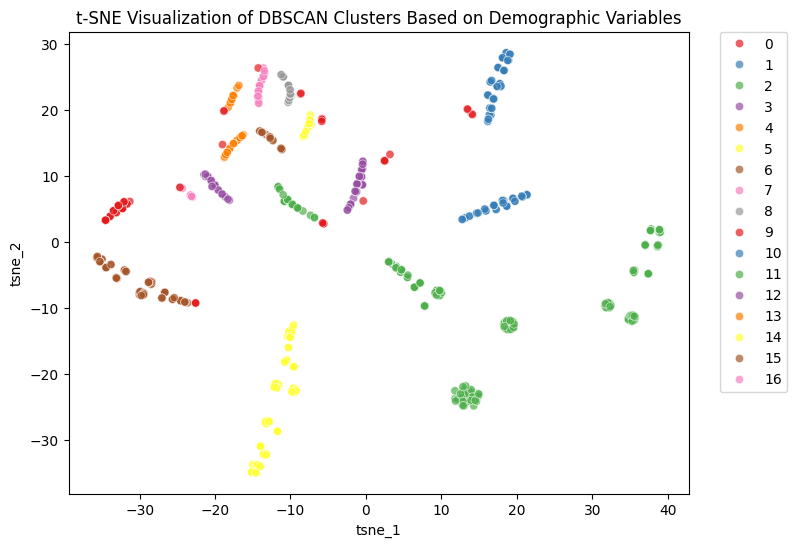

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca_jittered)

# Add t-SNE results to 'demographic_dbscan_cluster_df'
demographic_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

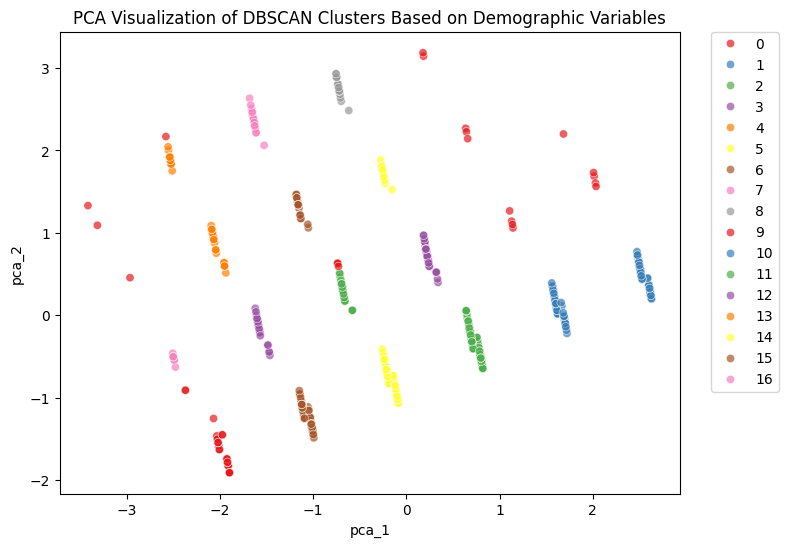

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca_jittered)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
demographic_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

## Model 12: HDBSCAN

In [ ]:
# For HDBSCAN, min_cluster_size is the minimum number of points requried to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Add very small random noise to break duplicate ties for DBCV score
np.random.seed(42)
jitter_amount = 0.001  # Add very small noise, so it will not affect clustering
demographic_pca_jittered = demographic_pca + np.random.normal(0, jitter_amount, demographic_pca.shape)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 20, 30, 50, 75, 100]
min_samples_range = [1, 5, 10, 15, 20]

# Store results
demographic_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        demographic_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = demographic_hdbscan.fit_predict(demographic_pca_jittered)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = demographic_pca_jittered[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(demographic_pca_jittered, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        demographic_hdbscan_results.append(result)

# Convert to DataFrame
demographic_hdbscan_results_df = pd.DataFrame(demographic_hdbscan_results)
demographic_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,73,68,0.084894,0.649697,0.765436,0.500211,458.464193
1,5,5,56,136,0.169788,0.632480,0.773483,0.473542,472.511521
2,5,10,29,212,0.264669,0.558539,0.656856,0.632137,455.583414
3,5,15,18,210,0.262172,0.593341,0.562371,0.700855,357.247541
4,5,20,14,288,0.359551,0.515657,0.571053,0.624134,472.043150
5,10,1,36,76,0.094881,0.535911,0.552863,0.814677,224.886437
6,10,5,32,148,0.184769,0.552111,0.606573,0.719309,293.959557
7,10,10,29,212,0.264669,0.558539,0.656856,0.632137,455.583414
8,10,15,17,215,0.268414,0.592266,0.566612,0.695300,363.361141
9,10,20,12,284,0.354557,0.456795,0.528726,0.709108,411.376793


In [ ]:
# Highest DBCV Score
best_dbcv_idx = demographic_hdbscan_results_df['dbcv_score'].idxmax()
best_dbcv = demographic_hdbscan_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = demographic_hdbscan_results_df['silhouette_score'].idxmax()
best_silhouette = demographic_hdbscan_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = demographic_hdbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = demographic_hdbscan_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = demographic_hdbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = demographic_hdbscan_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.649697 at min_cluster_size = 5.0, min_samples = 1.0
Best Silhouette Score: 0.773483 at min_cluster_size = 5.0, min_samples = 5.0
Best Davies-Bouldin Index: 0.473542 at min_cluster_size = 5.0, min_samples = 5.0
Best Calinski-Harabasz Index: 472.511521 at min_cluster_size = 5.0, min_samples = 5.0


min_cluster_size = 5.0, min_samples = 15.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 14
- Moderate noise ratio equal to 0.262 (Not too aggressive)
- Moderate DBCV score of 0.593
- Moderate Silhouette score of 0.562, Davies-Bouldin index of 0.701, and Calinski-Harabasz index of 357.248

In [ ]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on demographic variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
demographic_hdbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 15
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(demographic_pca_jittered)

# Add cluster labels to the dataframe
demographic_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = demographic_pca_jittered[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(demographic_pca_jittered, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
demographic_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=15: 18
Number of noise for min_cluster_size=5 & min_samples=15: 210
Noise ratio for min_cluster_size=5 & min_samples=15: 0.262172
DBCV Score for min_cluster_size=5 & min_samples=15: 0.593341
Silhouette Score for min_cluster_size=5 & min_samples=15: 0.562371
Davies-Bouldin Index for min_cluster_size=5 & min_samples=15: 0.700855
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=15: 357.247541


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,3
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,18
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,8
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,2

In [ ]:
# Initialize an empty list to store cluster summaries
demographic_hdbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in demographic_hdbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_of_interest:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_hdbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_hdbscan_cluster_summary = pd.DataFrame(demographic_hdbscan_cluster_summary)

# Display the summary
demographic_hdbscan_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,210,45-54,Under 15K,3,2
1,1,17,35-44,35-49K,5+,3+
2,2,40,55-64,35-49K,2,0
3,3,63,65+,35-49K,2,0
4,4,25,19-24,35-49K,2,0
5,5,5,45-54,75-99K,5+,3+
6,6,20,35-44,35-49K,3,1
7,7,114,35-44,50-74K,2,0
8,8,18,25-34,35-49K,3,1
9,9,76,25-34,50-74K,1,0


Note: Cluser 0 is noise.

In [ ]:
# Calculate Cramér’s V and average cluster purity for demographic variables
demographic_hdbscan_numerical_analyzer = CategoricalClusterDifferentiationAnalyzer(df=demographic_hdbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
demographic_hdbscan_differentiation = demographic_hdbscan_numerical_analyzer.compare_all_features(demographic_cols_of_interest)
demographic_hdbscan_differentiation

,cramers_v,avg_cluster_purity
variable,,
inverse_age_encoded,1.000000,1.000000
inverse_income_encoded,0.496390,0.667575
inverse_household_size_encoded,0.721022,0.747850
inverse_kid_category_encoded,0.824958,0.996914


Cramer's V is used to measure the strength of association between cluster assginment variables (1, 2, 3, 4, 5) and categorical demographic variables (inverse_age_encoded, inverse_income_encoded, inverse_household_size_encoded	 and inverse_kid_category_encoded).

Rules for interpreting values for Cramer's V:
1. Less than or equal to 0.20: Weak association
2. 0.21 - 0.60: Moderate association
3. More than 0.60: Strong association

(Link: https://www.ibm.com/docs/en/cognos-analytics/12.0.x?topic=terms-cramrs-v)
<br>
<br>

Rules for interpreting values for average cluster purity:
1. Minimum value: 0 - A cluster is completely heterogenous for that variable (all data in the cluster belong to different categories). This means the variable poorly differentiates the clusters.
2. Maximum value: 1 - A cluster is completely homogenous for that variable (all data in the cluster belong to the same category). This means the variable strongly differentiates the clusters.
<br>
<br>

For HDBSCAN, we have excluded the noise cluster (cluster 0) when calculating Cramer's V values because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
Based on the result above:
1. Age group has perfect association with the clusters, which means it strongly influences cluster membership. Additionally, its perfect average cluster purity (100%) indicates that individual clusters are completely homogenous by age group. Each cluster contains members from only one age group.

2. Kid category and household size group shows very strong association and high average cluster purity, suggesting they strongly influence cluster membership and that clusters are highly homogenous by kid category and household size.

3. Income group has the weakest association suggesting it is least influential in cluster formation. Its weakest average cluster purity indicates clusters are quite heterogeneous by income, meaning income is relatively generally evenly distributed across clusters and does not strongly differentiate each cluster.


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
demographic_hdbscan_cluster_proportion = demographic_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(demographic_hdbscan_cluster_proportion)

cluster
0     0.262172
1     0.021223
2     0.049938
3     0.078652
4     0.031211
5     0.006242
6     0.024969
7     0.142322
8     0.022472
9     0.094881
10    0.038702
11    0.019975
12    0.023720
13    0.023720
14    0.033708
15    0.023720
16    0.021223
17    0.047441
18    0.033708
Name: proportion, dtype: float64


The clusters are extremely imbalanced, and cluster 0 has high number of noise.

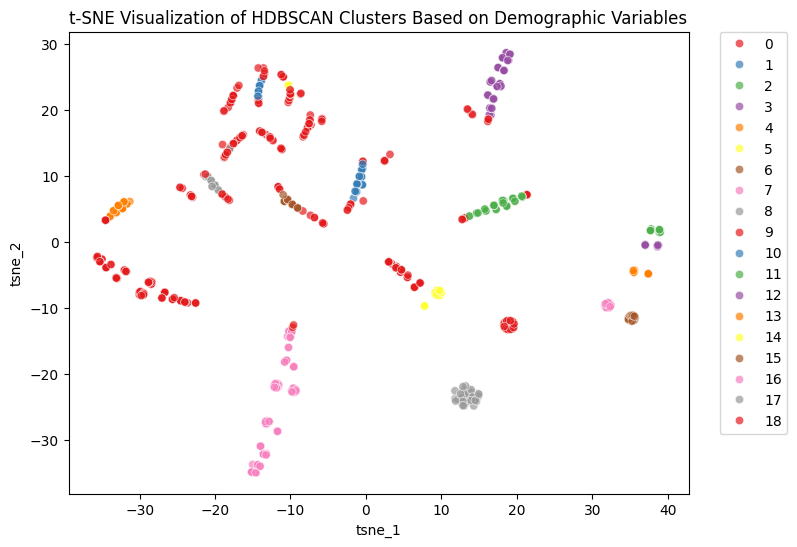

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(demographic_pca_jittered)

# Add t-SNE results to 'demographic_dbscan_cluster_df'
demographic_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
demographic_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

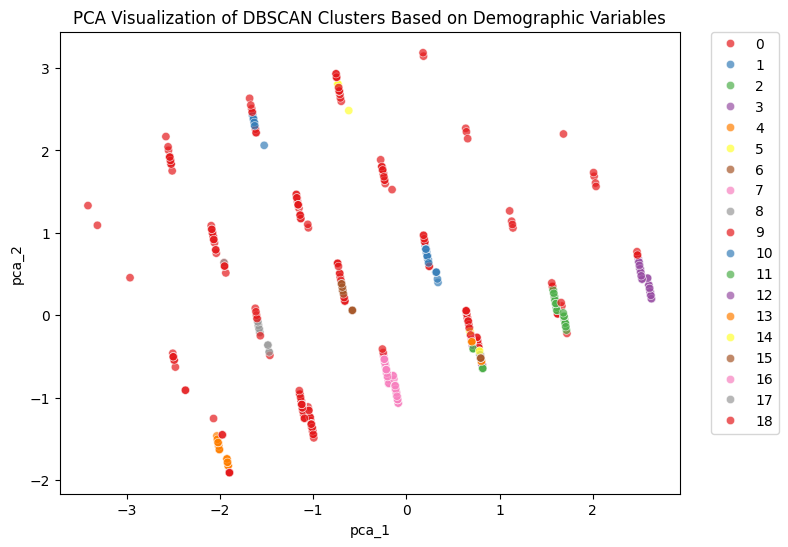

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(demographic_pca_jittered)

# Add PCA results to 'demographic_kmeans_cluster_df'
demographic_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
demographic_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=demographic_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Demographic Variables')

# Move legend to the right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

# Gaussian Mixture Model

In [15]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)

In [16]:
household_profile_df.head()

,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,275.0,13190.92,0

In [17]:
# Extract variables
demographic_features= household_profile_df[[
    'age_encoded',
    'income_encoded',
    'household_size_encoded',
    'kid_category_encoded'
]]

In [18]:
# Apply PCA to reduce dimensions of demographic_features while retaining 90% of the variance
demographic_gmm_df = demographic_features.copy()

pca = PCA(n_components=0.90, random_state=42)
demographic_gmm_pca = pca.fit_transform(demographic_gmm_df)

n_components_retained = pca.n_components_

In [19]:
# Perform GMM clustering for each k and store validation metrics
k_range = range(2, 11)
gmm_demographic_results = []

for k in k_range:
    gmm = GaussianMixture(
        n_components=k,
        covariance_type="full",
        random_state=42
    )

    labels = gmm.fit_predict(demographic_gmm_pca)

    gmm_demographic_results.append({
        "k": k,
        "Silhouette": silhouette_score(demographic_gmm_pca, labels),
        "Davies_Bouldin": davies_bouldin_score(demographic_gmm_pca, labels),
        "Calinski_Harabasz": calinski_harabasz_score(demographic_gmm_pca, labels)
    })

demographic_GMM_results_df = pd.DataFrame(gmm_demographic_results)
demographic_GMM_results_df

,k,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,2,0.332019,1.304085,331.791973
1,3,0.207788,1.794907,222.994825
2,4,0.351314,1.008154,468.161916
3,5,0.359522,1.283591,392.146612
4,6,0.316420,1.317531,347.218963
5,7,0.320618,1.299262,316.388831
6,8,0.326578,1.391337,292.233647
7,9,0.265044,1.583164,194.944628
8,10,0.274000,1.501840,255.454002


In [20]:
# Identify best k
best_k_demographic_silhouette = demographic_GMM_results_df.loc[
    demographic_GMM_results_df["Silhouette"].idxmax()
]

best_k_demographic_db = demographic_GMM_results_df.loc[
    demographic_GMM_results_df["Davies_Bouldin"].idxmin()
]

best_k_demographic_ch = demographic_GMM_results_df.loc[
    demographic_GMM_results_df["Calinski_Harabasz"].idxmax()
]
# Print results
print(f"Best Silhouette Score: {best_k_demographic_silhouette['Silhouette']:.6f} at k = {best_k_demographic_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_k_demographic_db['Davies_Bouldin']:.6f} at k = {best_k_demographic_db['k']}")
print(f"Best Calinski-Harabasz Index: {best_k_demographic_ch['Calinski_Harabasz']:.6f} at k = {best_k_demographic_ch['k']}")
# usually prioritized
best_k_demographic_GMM = best_k_demographic_ch['k']

Best Silhouette Score: 0.359522 at k = 5.0
Best Davies-Bouldin Index: 1.008154 at k = 4.0
Best Calinski-Harabasz Index: 468.161916 at k = 4.0


**Interpretation**

- Based on Silhouette score, the highest value (0.359) is at k=5, which provides the best clustering.

- Based on Davies-Bouldin Index (DBI), the lowest value (1.008) is at k = 4, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (468.161) is at k=4, which provides the strongest clustering.
<br>

- The best k is 4 should be considered the optimal number of clusters, as it achieves the highest Calinski–Harabasz Index, indicating strong between-cluster separation,Davies–Bouldin scores also get the lowest score while maintaining competitive Silhouette at the second position. This value represents a balanced trade-off between cluster quality and interpretability.




In [21]:
# Fit final GMM model using best k
final_gmm = GaussianMixture(
    n_components=int(best_k_demographic_GMM),
    covariance_type="full",
    random_state=42
)

household_profile_df["Cluster"] = final_gmm.fit_predict(demographic_gmm_pca)

In [22]:
# Calculate validation metrics for best k
validation_summary = pd.DataFrame({
    "Metric": [
        "Silhouette",
        "Davies-Bouldin",
        "Calinski-Harabasz"
    ],
    "Score": [
        silhouette_score(demographic_gmm_pca, household_profile_df["Cluster"]),
        davies_bouldin_score(demographic_gmm_pca, household_profile_df["Cluster"]),
        calinski_harabasz_score(demographic_gmm_pca, household_profile_df["Cluster"])
    ]
})
validation_summary.head(10)

,Metric,Score
0,Silhouette,0.351314
1,Davies-Bouldin,1.008154
2,Calinski-Harabasz,468.161916


In [23]:
# Columns of interest for clustering based on demographic variables
demographic_cols_gmm = ['inverse_age_encoded', 'inverse_income_encoded',
                                'inverse_household_size_encoded', 'inverse_kid_category_encoded']

# Initialize an empty list to store cluster summaries
demographic_gmm_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in household_profile_df.groupby('Cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_gmm:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_gmm_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_gmm_cluster_summary = pd.DataFrame(demographic_gmm_cluster_summary)

# Display the summary
demographic_gmm_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,137,35-44,50-74K,5+,3+
1,1,250,45-54,50-74K,2,0
2,2,297,35-44,50-74K,2,0
3,3,117,65+,35-49K,2,0


In [24]:
# Calculate Cramér’s V for demographic variables
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

categorical_vars = [
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded'
]

cramers_v_results = {}

for var in categorical_vars:
    contingency = pd.crosstab(household_profile_df[var], household_profile_df["Cluster"])
    cramers_v_results[var] = cramers_v(contingency)

cramers_v_df = pd.DataFrame.from_dict(
    cramers_v_results,
    orient="index",
    columns=["Cramér's V"]
)
cramers_v_df.head(10)

,Cramér's V
inverse_age_encoded,0.762083
inverse_income_encoded,0.140747
inverse_household_size_encoded,0.553199
inverse_kid_category_encoded,0.571455


In [25]:
# Calculate average cluster purity (demographics)
def cluster_purity(household_profile_df, feature, cluster_col="Cluster"):
    purities = []
    for _, group in household_profile_df.groupby(cluster_col):
        purities.append(group[feature].value_counts(normalize=True).max())
    return np.mean(purities)

purity_results = {
    var: cluster_purity(household_profile_df, var)
    for var in categorical_vars
}

cluster_purity_df = pd.DataFrame.from_dict(
    purity_results,
    orient="index",
    columns=["Avg Cluster Purity"]
)
cluster_purity_df.head(10)


,Avg Cluster Purity
inverse_age_encoded,0.600700
inverse_income_encoded,0.255060
inverse_household_size_encoded,0.509597
inverse_kid_category_encoded,0.780515


**Interpretation of Cramér’s V and Average Cluster Purity for Demographic Variables**

Cramér’s V is used to measure the strength of association between cluster assignment variables (Clusters 1–5) and categorical demographic variables, including inverse age, inverse income, inverse household size, and inverse kid category. The strength of association is interpreted based on established thresholds, where values less than or equal to 0.20 indicate a weak association, values between 0.21 and 0.60 indicate a moderate association, and values greater than 0.60 indicate a strong association. In addition, average cluster purity is used to assess the degree of homogeneity of each demographic variable within clusters, with higher values indicating stronger differentiation.

Based on the results above, the findings can be interpreted as follows.

Age group has the strongest association with cluster membership (Cramér’s V = 0.762), indicating a strong influence on cluster formation. In addition, age exhibits a moderately high average cluster purity (60.1%), suggesting that individual clusters tend to be dominated by a particular age group. However, clusters are not fully homogeneous by age, as approximately 40% of cluster members belong to other age categories. This indicates that age is a primary driver of cluster differentiation, while still allowing for diversity within clusters.

Kid category group shows a moderate association with cluster membership (Cramér’s V = 0.571). Despite having a weaker association than age, kid category demonstrates a high average cluster purity (78.1%), indicating that clusters are relatively homogeneous in terms of the number of children. This suggests that kid category plays an important role in defining the internal composition of clusters, with most clusters strongly characterized by a dominant kid category.

Household size group also exhibits a moderate association with cluster membership (Cramér’s V = 0.553). Its moderate average cluster purity (51.0%) indicates that clusters tend to have a dominant household size category, but still include a substantial proportion of other household sizes. This suggests that household size acts as a supporting differentiator in cluster formation rather than a dominant factor.

Income group has the weakest association with cluster membership (Cramér’s V = 0.141), indicating a weak relationship with the clustering structure. Consistent with this result, income also shows the lowest average cluster purity (25.5%), suggesting that clusters are highly heterogeneous with respect to income. This implies that income is least influential in cluster differentiation and is relatively evenly distributed across clusters.

Overall, these results indicate that age is the most influential demographic variable in determining cluster membership, while kid category and household size provide meaningful but secondary differentiation. In contrast, income contributes minimally to both cluster separation and within-cluster characterization. Collectively, the findings suggest that life-stage and family composition variables are more important for customer segmentation than income when inverse demographic variables are considered.

In [26]:
# Calculate and display cluster proportions
cluster_proportions = (
    household_profile_df["Cluster"]
    .value_counts(normalize=True)
    .sort_index()
    .rename("Proportion")
    .to_frame()
)
cluster_proportions

,Proportion
Cluster,
0,0.171036
1,0.312110
2,0.370787
3,0.146067


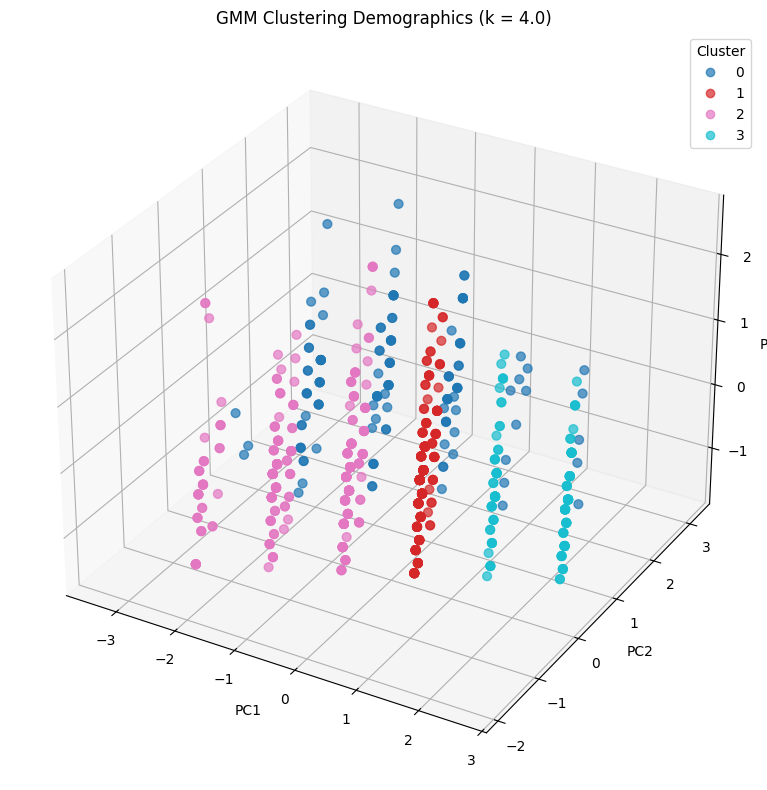

In [27]:
# Plot clusters (3D PCA space)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(
    demographic_gmm_pca[:, 0],
    demographic_gmm_pca[:, 1],
    demographic_gmm_pca[:, 2],
    c=household_profile_df["Cluster"],
    cmap="tab10",
    alpha=0.7,
    s=40
)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"GMM Clustering Demographics (k = {best_k_demographic_GMM})")

ax.legend(
    *scatter.legend_elements(),
    title="Cluster",
    loc="upper right"
)

plt.tight_layout()
plt.show()


In [28]:
    from hdbscan.validity import validity_index
    dbcv = validity_index(
        X=demographic_gmm_pca,
        labels=labels,
        metric='euclidean'
    )

    print(f"DBCV Score (GMM): {dbcv:.4f}")

DBCV Score (GMM): -0.2883


In [29]:
from sklearn.manifold import TSNE

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
)

X_tsne = tsne.fit_transform(demographic_features)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [30]:
cluster_summary = (
    household_profile_df.groupby("Cluster")[demographic_features.columns.tolist()]
    .mean()
    .sort_values(["age_encoded", "kid_category_encoded"])
)
cluster_labels = {
    cluster: label
    for cluster, label in zip(
        cluster_summary.index,
        [
            "Young Non-Family Households",
            "Middle-Aged Families (Medium Household)",
            "Older Non-Family Households (Small Household)",
            "Young Families (Medium Household)"
        ]
    )
}

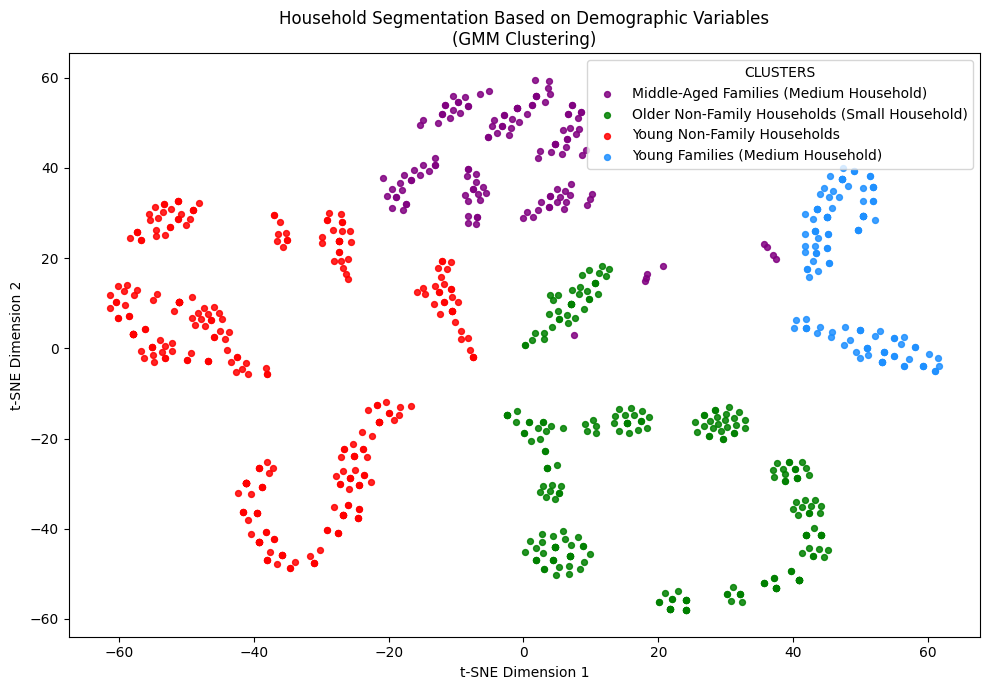

In [31]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

colors = ["purple", "green", "red", "dodgerblue"]

for cluster in sorted(household_profile_df["Cluster"].unique()):
    mask = household_profile_df["Cluster"] == cluster
    plt.scatter(
        X_tsne[mask, 0],
        X_tsne[mask, 1],
        s=18,
        alpha=0.85,
        color=colors[cluster],
        label=cluster_labels.get(cluster, f"Cluster {cluster}")
    )

plt.title("Household Segmentation Based on Demographic Variables\n(GMM Clustering)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.legend(title="CLUSTERS", frameon=True)
plt.grid(False)
plt.tight_layout()
plt.show()

#Self Organizing Maps Model

In [14]:
!pip install minisom

  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.5-py3-none-any.whl size=12031 sha256=832aee48667325edca5407779c08036334d3ebb9eda09aef57f9103ecb4dc076
  Stored in directory: /root/.cache/pip/wheels/0f/8c/a4/5b7aa56fa6ef11d536d45da775bcc5a2a1c163ff0f8f11990b
Successfully built minisom


In [32]:
from minisom import MiniSom
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)

In [33]:
# Extract variables
demographic_features= household_profile_df[[
    'age_encoded',
    'income_encoded',
    'household_size_encoded',
    'kid_category_encoded'
]]

In [34]:
# Apply PCA to reduce dimensions of demographic_features while retaining 90% of the variance

demographic_SOM_df = demographic_features.copy()

pca = PCA(n_components=0.90, random_state=42)

demographic_SOM_pca = pca.fit_transform(demographic_SOM_df)

n_components_retained = pca.n_components_


In [35]:
# Perform SOM clustering for each k and store validation metrics
k_range = range(2, 11)
som_results = []

for k in k_range:
    grid_size = int(np.ceil(np.sqrt(k)))

    som = MiniSom(
        x=grid_size,
        y=grid_size,
        input_len=demographic_SOM_pca.shape[1],
        sigma=1.0,
        learning_rate=0.5,
        random_seed=42
    )

    som.random_weights_init(demographic_SOM_pca)
    som.train_random(demographic_SOM_pca, num_iteration=3000)

    # SOM codebook vectors
    weights = som.get_weights().reshape(-1, demographic_SOM_pca.shape[1])

    # KMeans on SOM nodes
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(weights)

    # Assign each observation to a cluster
    labels = []
    for x in demographic_SOM_pca:
        winner = som.winner(x)
        node_index = winner[0] * grid_size + winner[1]
        labels.append(kmeans.labels_[node_index])

    labels = np.array(labels)

    som_results.append({
        "k": k,
        "Silhouette": silhouette_score(demographic_SOM_pca, labels),
        "Davies_Bouldin": davies_bouldin_score(demographic_SOM_pca, labels),
        "Calinski_Harabasz": calinski_harabasz_score(demographic_SOM_pca, labels)
    })

demographic_SOM_results = pd.DataFrame(som_results)
demographic_SOM_results.head(10)


,k,Silhouette,Davies_Bouldin,Calinski_Harabasz
0,2,0.315467,1.345983,367.923691
1,3,0.359026,0.915232,476.375024
2,4,0.302373,1.103255,459.907944
3,5,0.286369,1.216636,306.538904
4,6,0.279620,1.097410,292.437955
5,7,0.245474,1.024828,270.212318
6,8,0.348240,0.983361,413.881669
7,9,0.354722,0.961571,424.266668
8,10,0.355907,1.102394,352.070819


In [36]:
# Identify best k
best_silhouette_SOM_result = demographic_SOM_results.loc[
    demographic_SOM_results["Silhouette"].idxmax()
]

best_db_SOM_result = demographic_SOM_results.loc[
    demographic_SOM_results["Davies_Bouldin"].idxmin()
]

best_ch_SOM_result = demographic_SOM_results.loc[
    demographic_SOM_results["Calinski_Harabasz"].idxmax()
]
# Print results
print(f"Best Silhouette Score: {best_silhouette_SOM_result['Silhouette']:.6f} at k = {best_silhouette_SOM_result['k']}")
print(f"Best Davies-Bouldin Index: {best_db_SOM_result['Davies_Bouldin']:.6f} at k = {best_db_SOM_result['k']}")
print(f"Best Calinski-Harabasz Index: {best_ch_SOM_result['Calinski_Harabasz']:.6f} at k = {best_ch_SOM_result['k']}")
# Assign the scalar k value for the best silhouette score
best_k_demographic_SOM = best_ch_SOM_result['k']

Best Silhouette Score: 0.359026 at k = 3.0
Best Davies-Bouldin Index: 0.915232 at k = 3.0
Best Calinski-Harabasz Index: 476.375024 at k = 3.0


Interpretation

Based on Silhouette score, the highest value (0.359) is at k=3, which provides the best clustering.

Based on Davies-Bouldin Index (DBI), the lowest value (0.915) is at k = 3, which provides the strongest clustering.

Based on Calinski-Harabasz Index (CHI), the highest value (476.375) is at k=3, which provides the strongest clustering.


k = 3 should be considered the optimal number of clusters, as it achieves the highest Calinski–Harabasz Index, lowest Davies-Bouldin Index and highest Calinski-Harabasz Index.

In [37]:
# Fit final SOM model using best k
grid_size = int(np.ceil(np.sqrt(best_k_demographic_SOM)))

final_som = MiniSom(
    x=grid_size,
    y=grid_size,
    input_len=demographic_SOM_pca.shape[1],
    sigma=1.0,
    learning_rate=0.5,
    random_seed=42
)

final_som.random_weights_init(demographic_SOM_pca)
final_som.train_random(demographic_SOM_pca, num_iteration=5000)

# KMeans on SOM nodes
weights = final_som.get_weights().reshape(-1, demographic_SOM_pca.shape[1])
kmeans_final = KMeans(n_clusters=int(best_k_demographic_SOM), random_state=42, n_init=50) # Added n_init parameter as it is recommended for KMeans
kmeans_final.fit(weights)

# Assign final clusters
clusters = []
for x in demographic_SOM_pca:
    winner = final_som.winner(x)
    node_index = winner[0] * grid_size + winner[1]
    clusters.append(kmeans_final.labels_[node_index])

household_profile_df["Cluster"] = np.array(clusters)


In [38]:
# Calculate validation metrics for best k
validation_summary = pd.DataFrame({
    "Metric": [
        "Silhouette",
        "Davies-Bouldin",
        "Calinski-Harabasz"
    ],
    "Score": [
        silhouette_score(demographic_SOM_pca, household_profile_df["Cluster"]),
        davies_bouldin_score(demographic_SOM_pca, household_profile_df["Cluster"]),
        calinski_harabasz_score(demographic_SOM_pca, household_profile_df["Cluster"])
    ]
})
validation_summary

,Metric,Score
0,Silhouette,0.365189
1,Davies-Bouldin,0.896427
2,Calinski-Harabasz,467.968856


In [39]:
# Columns of interest for clustering based on demographic variables
demographic_cols_som = ['inverse_age_encoded', 'inverse_income_encoded',
                                'inverse_household_size_encoded', 'inverse_kid_category_encoded']

# Initialize an empty list to store cluster summaries
demographic_som_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in household_profile_df.groupby('Cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get mode for each categorical variable
    for col in demographic_cols_som:
        mode_val = cluster_df[col].mode()[0]
        cluster_summary[f'{col}_mode'] = mode_val

    demographic_som_cluster_summary.append(cluster_summary)

# Convert to DataFrame
demographic_som_cluster_summary = pd.DataFrame(demographic_som_cluster_summary)

# Display the summary
demographic_som_cluster_summary

,cluster,count,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode
0,0,181,25-34,35-49K,1,0
1,1,489,45-54,50-74K,2,0
2,2,131,35-44,50-74K,5+,3+


In [40]:
# Calculate Cramér’s V for demographic variables
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

categorical_vars = [
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded'
]

cramers_v_results = {}

for var in categorical_vars:
    contingency = pd.crosstab(household_profile_df[var], household_profile_df["Cluster"])
    cramers_v_results[var] = cramers_v(contingency)

cramers_v_df = pd.DataFrame.from_dict(
    cramers_v_results,
    orient="index",
    columns=["Cramér's V"]
)
cramers_v_df.head(10)

,Cramér's V
inverse_age_encoded,0.603929
inverse_income_encoded,0.180151
inverse_household_size_encoded,0.658632
inverse_kid_category_encoded,0.676734


In [41]:
# Calculate average cluster purity
def cluster_purity(household_profile_df, feature, cluster_col="Cluster"):
    purities = []
    for _, group in household_profile_df.groupby(cluster_col):
        purities.append(group[feature].value_counts(normalize=True).max())
    return np.mean(purities)

purity_results = {
    var: cluster_purity(household_profile_df, var)
    for var in categorical_vars
}

cluster_purity_df = pd.DataFrame.from_dict(
    purity_results,
    orient="index",
    columns=["Avg Cluster Purity"]
)
cluster_purity_df.head(10)

,Avg Cluster Purity
inverse_age_encoded,0.493557
inverse_income_encoded,0.229641
inverse_household_size_encoded,0.489164
inverse_kid_category_encoded,0.726454


**Interpretation of Cramér’s V and Average Cluster Purity for Demographic Variables**

Cramér’s V is used to measure the strength of association between cluster assignment variables (Clusters 1–5) and categorical demographic variables, including inverse age, inverse income, inverse household size, and inverse kid category. The strength of association is interpreted using established thresholds, where values less than or equal to 0.20 indicate a weak association, values between 0.21 and 0.60 indicate a moderate association, and values greater than 0.60 indicate a strong association. In addition, average cluster purity is used to assess the degree of within-cluster homogeneity for each demographic variable, with higher values indicating stronger differentiation.

Based on the results above, the findings can be interpreted as follows.

Kid category group shows the strongest association with cluster membership (Cramér’s V = 0.677), indicating a strong influence on cluster formation. Moreover, its high average cluster purity (72.6%) suggests that clusters are relatively homogeneous in terms of the number of children. This indicates that kid category is a key differentiating variable, with most clusters dominated by a specific kid category.

Household size group also exhibits a strong association with cluster membership (Cramér’s V = 0.659). However, its moderate average cluster purity (48.9%) indicates that while household size contributes substantially to overall cluster separation, individual clusters still contain a mix of household size categories. This suggests that household size acts as an important but not exclusive differentiator in cluster formation.

Age group demonstrates a strong association with cluster membership (Cramér’s V = 0.604), although it is weaker than that of kid category and household size. The moderate average cluster purity for age (49.4%) indicates that clusters are not fully homogeneous by age, with roughly half of each cluster belonging to a dominant age group and the remainder distributed across other age categories. This suggests that age plays a meaningful but secondary role in differentiating clusters.

Income group has the weakest association with cluster membership (Cramér’s V = 0.180), indicating a weak relationship between income and the clustering structure. Consistent with this result, income also exhibits the lowest average cluster purity (23.0%), suggesting that clusters are highly heterogeneous with respect to income. This implies that income is least influential in cluster formation and does not strongly differentiate customer segments.

Overall, these results indicate that family composition–related variables, particularly kid category and household size, are the most influential factors in differentiating customer clusters. Age contributes to cluster separation to a lesser extent, while income plays a minimal role in defining both cluster membership and within-cluster characteristics. Collectively, the findings suggest that life-stage and household structure variables are more informative for customer segmentation than income in this clustering solution.

In [42]:
# Calculate and display cluster proportions
cluster_proportions = (
    household_profile_df["Cluster"]
    .value_counts(normalize=True)
    .sort_index()
    .rename("Proportion")
    .to_frame()
)
cluster_proportions

,Proportion
Cluster,
0,0.225968
1,0.610487
2,0.163546


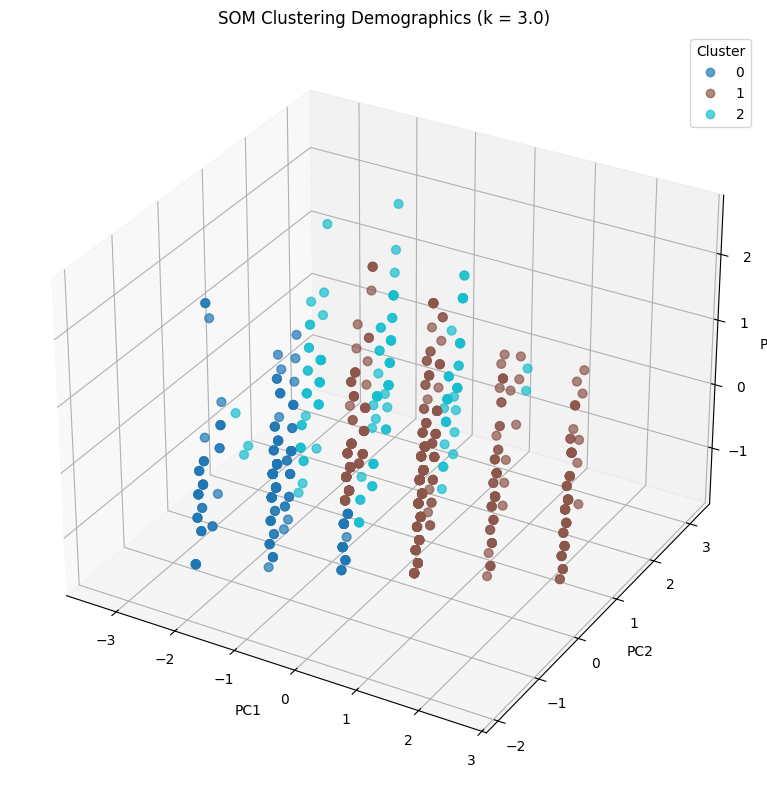

In [43]:
# Plot clusters (3D PCA space)
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

scatter = ax.scatter(
    demographic_SOM_pca[:, 0],
    demographic_SOM_pca[:, 1],
    demographic_SOM_pca[:, 2],
    c=household_profile_df["Cluster"],
    cmap="tab10",
    alpha=0.7,
    s=40
)

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title(f"SOM Clustering Demographics (k = {best_k_demographic_SOM})")

ax.legend(
    *scatter.legend_elements(),
    title="Cluster",
    loc="upper right"
)

plt.tight_layout()
plt.show()


In [ ]:
    import hdbscan
    from hdbscan.validity import validity_index

    dbcv = validity_index(
        X=demographic_SOM_pca,
        labels=labels,
        metric='euclidean'
    )

    print(f"DBCV Score (SOM): {dbcv:.4f}")

DBCV Score (SOM): -0.4455


In [44]:
from sklearn.manifold import TSNE

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
)

X_tsne = tsne.fit_transform(demographic_features)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [45]:
cluster_summary = (
    household_profile_df.groupby("Cluster")[demographic_features.columns.tolist()]
    .mean()
    .sort_values(["age_encoded", "kid_category_encoded"])
)
cluster_labels = {
    cluster: label
    for cluster, label in zip(
        cluster_summary.index,
        [
            "Young Non-Family Households",
            "Middle-Aged Families (Medium Household)",
            "Older Non-Family Households (Small Household)",
            "Young Families (Medium Household)"
        ]
    )
}

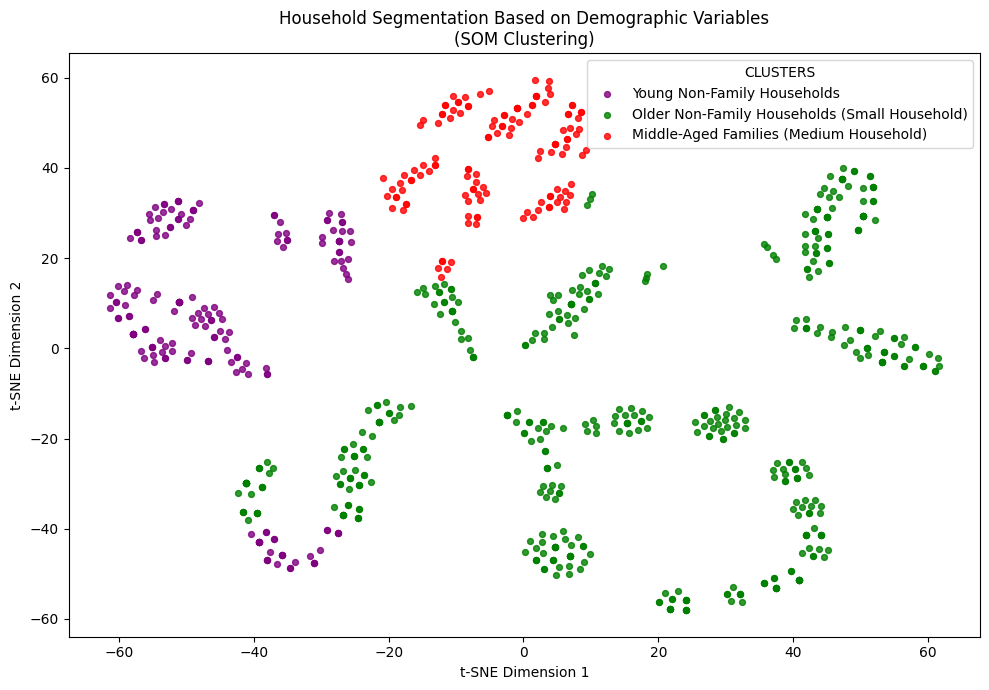

In [46]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))

colors = ["purple", "green", "red", "dodgerblue"]

for cluster in sorted(household_profile_df["Cluster"].unique()):
    mask = household_profile_df["Cluster"] == cluster
    plt.scatter(
        X_tsne[mask, 0],
        X_tsne[mask, 1],
        s=18,
        alpha=0.8,
        color=colors[cluster],
        label=cluster_labels.get(cluster, f"Cluster {cluster}")
    )

plt.title("Household Segmentation Based on Demographic Variables\n(SOM Clustering)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.legend(title="CLUSTERS", frameon=True)
plt.grid(False)
plt.tight_layout()
plt.show()

# Behavioural

## Model 13: K-Means

### Main: Use k = 2

In [ ]:
# Display first 5 rows of the selected columns
household_profile_df[
    [
        'retail_discount_mean',
        'retail_discount_usage_proportion',
        'retail_discount_no_usage_proportion',
        'coupon_discount_mean',
        'coupon_discount_usage_proportion',
        'coupon_discount_no_usage_proportion',
        'did_not_receive_campaign_and_no_coupons_proportion',
        'received_campaign_and_16_coupons_proportion',
        'received_campaign_and_all_coupons_proportion',
        'afternoon_proportion',
        'evening_proportion',
        'midnight_proportion',
        'morning_proportion',
        'night_proportion'
    ]
].head()

,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion
0,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000
1,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168
2,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867
3,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182
4,-1.055914,-1.273896,1.273896,-0.300252,-0.607878,0.607878,0.115384,-0.968430,0.085717,1.146129,0.813866,0.126961,1.618363,-3.908189


In [ ]:
# Extract 'retail_discount_mean', 'retail_discount_usage_proportion', 'retail_discount_no_usage_proportion', 'coupon_discount_mean',
# 'coupon_discount_usage_proportion', 'coupon_discount_no_usage_proportion', 'did_not_receive_campaign_and_no_coupons_proportion',
# 'received_campaign_and_16_coupons_proportion', 'received_campaign_and_all_coupons_proportion', 'afternoon_proportion', 'evening_proportion',
# 'midnight_proportion', 'morning_proportion', 'night_proportion' variables from house_profile dataset,
# and converts them into NumPy array.

# Not including 'retail_discount_no_usage_proportion' and 'coupon_discount_usage_proportion' for clustering algorithm because
# they are perfectly correlated with 'retail_discount_usage_proportion' and 'coupon_discount_usage_proportion' respectively.
# It will add zero new information, and it only adds noise and redudancy during clustering.
behavioural_array = household_profile_df[
    [
        'retail_discount_mean',
        'retail_discount_usage_proportion',
        'coupon_discount_mean',
        'coupon_discount_usage_proportion',
        'did_not_receive_campaign_and_no_coupons_proportion',
        'received_campaign_and_16_coupons_proportion',
        'received_campaign_and_all_coupons_proportion',
        'afternoon_proportion',
        'evening_proportion',
        'midnight_proportion',
        'morning_proportion',
        'night_proportion'
    ]
].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [ ]:
# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'behavioural_kmeans_results' for comparison across different k.
behavioural_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(behavioural_pca)

    behavioural_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(behavioural_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(behavioural_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(behavioural_pca, labels)
    })

# Convert results to DataFrame
behavioural_kmeans_results_df = pd.DataFrame(behavioural_kmeans_results)
behavioural_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,5829.520236,0.413613,1.170844,212.036000
1,3,4550.297645,0.330765,1.240418,247.823432
2,4,3827.262371,0.349409,1.123025,246.370500
3,5,3320.885350,0.284939,1.200453,243.030105
4,6,3042.688913,0.294213,1.176714,226.471458
5,7,2793.972558,0.266009,1.163511,217.048058
6,8,2628.207202,0.262916,1.255716,204.671147
7,9,2460.607901,0.264324,1.290573,197.787383
8,10,2321.975477,0.250237,1.346673,191.319845


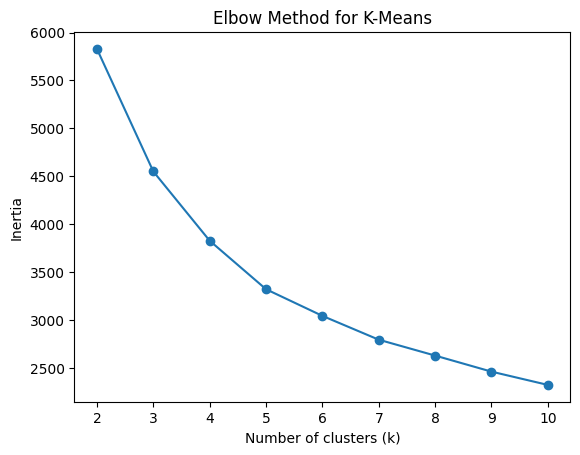

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(behavioural_kmeans_results_df['k'], behavioural_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = behavioural_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.413613 at k = 2.0
Best Davies-Bouldin Index: 1.123025 at k = 4.0
Best Calinski-Harabasz Index: 247.823432 at k = 3.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4.

- Based on Silhouette score, the highest value (0.414) is at k=2, which provides the best clustering.

- Based on Davies-Bouldin Index (DBI), the lowest value (1.123) is at k=4, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (247.823) is at k=3, which provides the strongest clustering.
<br>

- The best k is 2 because:
1.   it provides clearer and more interpretable clusters compared to k=3 or 4
2.   it has the highest Silhouette score of 0.413
3.   it has moderate Davies-Bouldin Index (DBI) of 1.171
4.   it has moderate Calinski-Harabasz Index (CHI) of 212.036




In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Fit final K-Means model using k=2
final_k = 2
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(behavioural_pca)

# Add cluster labels to the behavioural_kmeans_cluster_df for us to interpret the clusters using the
# original features.
behavioural_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(behavioural_pca, cluster_labels)
dbi_score = davies_bouldin_score(behavioural_pca, cluster_labels)
chi_score = calinski_harabasz_score(behavioural_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_kmeans_cluster_df.head(10)

Silhouette Score for k=2: 0.413613
Davies-Bouldin Index for k=2: 1.170844
Calinski-Harabasz Index for k=2: 212.036000


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511

In [ ]:
# Define feature names in the same order as they appear in behavioural_array
feature_names = [
        'retail_discount_mean',
        'retail_discount_usage_proportion',
        'coupon_discount_mean',
        'coupon_discount_usage_proportion',
        'did_not_receive_campaign_and_no_coupons_proportion',
        'received_campaign_and_16_coupons_proportion',
        'received_campaign_and_all_coupons_proportion',
        'afternoon_proportion',
        'evening_proportion',
        'midnight_proportion',
        'morning_proportion',
        'night_proportion'
]

# Create a DataFrame of PCA loadings
loadings = pd.DataFrame(
    pca.components_,
    columns=feature_names,
    index=[f'PC{i+1}' for i in range(pca.n_components_)]
)

# Display the dataframe
loadings

,retail_discount_mean,retail_discount_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion
PC1,-0.057069,-0.014651,-0.135086,-0.318073,-0.031100,-0.255367,0.065097,-0.323190,-0.118767,0.060030,-0.395741,0.726582
PC2,0.063051,0.028987,-0.010221,0.105190,0.183685,0.879519,-0.269347,-0.129643,-0.097962,0.044868,-0.132998,0.240973
PC3,0.304886,0.324288,0.291377,0.759036,-0.141024,-0.158751,0.112212,-0.094281,-0.080890,0.005308,-0.072782,0.249815
PC4,-0.318216,-0.326366,0.036657,0.219993,-0.049723,0.053510,0.019517,0.302985,0.494178,-0.428705,0.173854,0.432135
PC5,0.567783,0.503865,-0.051915,-0.371947,0.086919,0.014094,-0.053825,0.213197,0.302272,-0.269769,0.187972,0.164686
PC6,-0.012481,-0.074489,-0.006198,-0.040416,0.054107,-0.039083,-0.024743,0.014759,-0.635910,-0.137200,0.702409,0.265999


In [ ]:
# Show explained variance of each PC
explained_variance = pd.Series(
    pca.explained_variance_ratio_,
    index=loadings.index,
    name="Explained Variance Ratio"
)

explained_variance

,Explained Variance Ratio
PC1,0.250184
PC2,0.236162
PC3,0.196173
PC4,0.104474
PC5,0.081483
PC6,0.057655


In [ ]:
# Check top contributing features per PC
for pc in loadings.index:
    print(f"\n{pc} – top contributing variables:")
    print(loadings.loc[pc].abs().sort_values(ascending=False).head(5))


PC1 – top contributing variables:
night_proportion                               0.726582
morning_proportion                             0.395741
afternoon_proportion                           0.323190
coupon_discount_usage_proportion               0.318073
received_campaign_and_16_coupons_proportion    0.255367
Name: PC1, dtype: float64

PC2 – top contributing variables:
received_campaign_and_16_coupons_proportion           0.879519
received_campaign_and_all_coupons_proportion          0.269347
night_proportion                                      0.240973
did_not_receive_campaign_and_no_coupons_proportion    0.183685
morning_proportion                                    0.132998
Name: PC2, dtype: float64

PC3 – top contributing variables:
coupon_discount_usage_proportion    0.759036
retail_discount_usage_proportion    0.324288
retail_discount_mean                0.304886
coupon_discount_mean                0.291377
night_proportion                    0.249815
Name: PC3, dtype: float

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_kmeans_cluster_summary = pd.DataFrame(behavioural_kmeans_cluster_summary)

# Sort clusters by household count descending
behavioural_kmeans_cluster_summary = behavioural_kmeans_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
behavioural_kmeans_cluster_summary['cluster'] = range(1, len(behavioural_kmeans_cluster_summary)+1)

# Display the summary
behavioural_kmeans_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,1,712,0.502008,0.498727,0.501273,0.000672,0.006280,0.993720,0.659184,0.238540,0.078295,0.383136,0.35359,1.000000e-06,0.110499,5.890182e-02
1,2,89,0.485437,0.472381,0.527619,0.001412,0.010916,0.989084,0.716849,0.239766,0.050202,0.512670,0.12555,1.000000e-06,0.233258,1.000000e-06


In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_kmeans_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
behavioural_kmeans_differentiation = behavioural_kmeans_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_kmeans_differentiation.style.format("{:.4f}")

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.0002,0.0455
inverse_retail_discount_usage_proportion,0.0087,0.2986
inverse_retail_discount_no_usage_proportion,0.0087,0.2986
inverse_coupon_discount_mean,0.0062,0.2500
inverse_coupon_discount_usage_proportion,0.0098,0.3162
inverse_coupon_discount_no_usage_proportion,0.0098,0.3162
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.0033,0.1834
inverse_received_campaign_and_16_coupons_proportion,0.0000,0.0020
inverse_received_campaign_and_all_coupons_proportion,0.0097,0.3147


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.59: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Morning, evening and night proportions have medium effects in differentiating household segments.

2. Afternoon proportion has small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have negligible effects in differentiating household segments.

4. Morning, evening and night proportions have large average group means difference across all pairwise cluster.

5. Afternoon proportion has medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have small or  negligible average group means difference across all pairwise cluster.



In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category           top_4_category        top_5_category        top_6_category                   top_7_category                   top_8_category top_9_category                   top_10_category       top_11_category       top_12_category      top_13_category top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       1    712 Coupon Discount No Usage Did Not Receive Campaign And No Coupons     Retail Discount Mean Retail Discount No Usage Retail Discount Usage             Afternoon                          Evening Received Campaign And 16 Coupons        Morning Received Campaign And All Coupons                 Night Coupon Discount Usage Coupon Discount Mean        Midnight     0.993720     0.659184     0.502008     0

The top three behavioural variables with the largest differences between the two clusters are morning, afternoon, and evening shopping behaviours. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_kmeans_cluster_proportion = behavioural_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_kmeans_cluster_proportion)

cluster
1    0.111111
2    0.888889
Name: proportion, dtype: float64


The clusters are severely imbalanced.

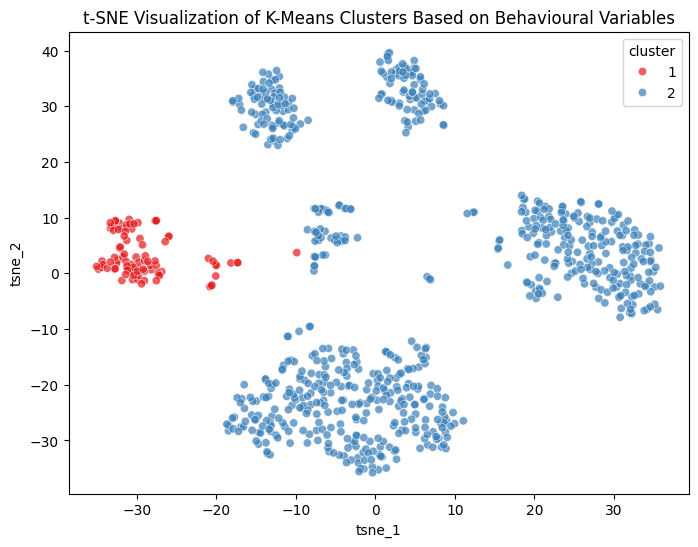

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'demographic_kmeans_cluster_df'
behavioural_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on Behavioural Variables')
plt.show()

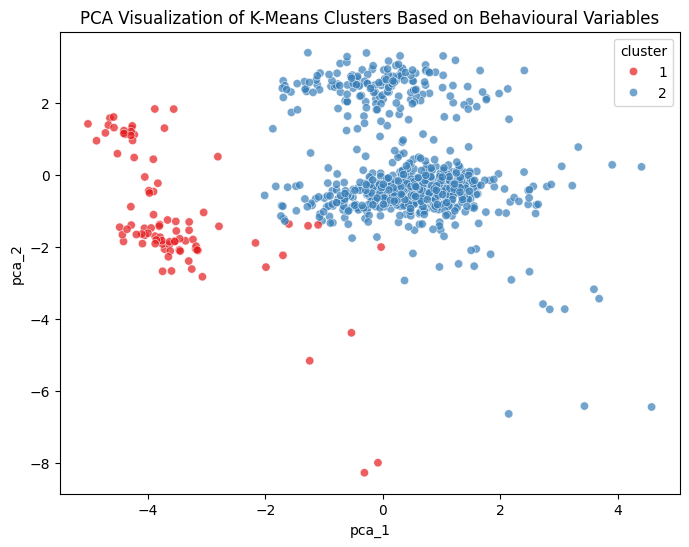

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_kmeans_cluster_df'
behavioural_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on Behavioural Variables')
plt.show()

### Testing: Use different k values (k=4)

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Fit final K-Means model using k=4
final_k = 4
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(behavioural_pca)

# Add cluster labels to the behavioural_kmeans_cluster_df for us to interpret the clusters using the
# original features.
behavioural_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(behavioural_pca, cluster_labels)
dbi_score = davies_bouldin_score(behavioural_pca, cluster_labels)
chi_score = calinski_harabasz_score(behavioural_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_kmeans_cluster_df.head(10)

Silhouette Score for k=4: 0.349409
Davies-Bouldin Index for k=4: 1.123025
Calinski-Harabasz Index for k=4: 246.370500


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,4,-30.526834,-1.119536,-4.094127,-1.905680
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,1,-7.389840,-28.183451,1.084870,-0.738124
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,1,-1.070366,-23.342312,0.713170,-0.431891
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569

In [ ]:
# Initialize an empty list to store cluster summaries
behavioural_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_kmeans_cluster_summary = pd.DataFrame(behavioural_kmeans_cluster_summary)

# Display the summary
behavioural_kmeans_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,1,511,0.504981,0.500564,0.499436,0.001047,0.007399,0.992601,0.619581,0.255574,0.118168,0.386138,0.357874,1.000000e-06,0.110816,5.312152e-02
1,2,157,0.520395,0.503682,0.496318,0.000427,0.005710,0.994290,0.819074,0.180925,0.000001,0.375566,0.347390,1.000000e-06,0.110281,6.996587e-02
2,3,53,0.448791,0.456490,0.543510,0.000000,0.000001,0.999999,0.803735,0.190031,0.020240,0.308383,0.340599,1.000000e-06,0.111688,8.154498e-02
3,4,80,0.490266,0.476090,0.523910,0.001861,0.013541,0.986459,0.710867,0.243617,0.047741,0.534189,0.116671,1.000000e-06,0.249524,1.000000e-06


In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_kmeans_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
behavioural_kmeans_differentiation = behavioural_kmeans_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_kmeans_differentiation.style.format("{:.4f}")

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.0188,0.3160
inverse_retail_discount_usage_proportion,0.0237,0.3267
inverse_retail_discount_no_usage_proportion,0.0237,0.3267
inverse_coupon_discount_mean,0.0212,0.3561
inverse_coupon_discount_usage_proportion,0.0370,0.4743
inverse_coupon_discount_no_usage_proportion,0.0370,0.4743
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.2777,0.8662
inverse_received_campaign_and_16_coupons_proportion,0.0798,0.4780
inverse_received_campaign_and_all_coupons_proportion,0.3460,1.1896


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.59: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Did not receive campaign and no coupon and received campaign and all coupons proportions have strong effects in differentiating household segments.

2. Morning, afternoon, evening and night proportions have medium effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, received campaign and 16 coupons,  and midnight) have small effects in differentiating household segments.

4. Did not receive campaign and no coupon and received campaign and all coupons proportions have large average group means difference across all pairwise cluster.

5. Afternoon, evening and night proportion has medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, received campaign and 16 coupons, morning and midnight) have small or negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category           top_4_category           top_5_category        top_6_category top_7_category                   top_8_category                    top_9_category                   top_10_category                   top_11_category       top_12_category      top_13_category                   top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       1    511 Coupon Discount No Usage Did Not Receive Campaign And No Coupons     Retail Discount Mean    Retail Discount Usage Retail Discount No Usage             Afternoon        Evening Received Campaign And 16 Coupons Received Campaign And All Coupons                           Morning                             Night Coupon Discount Usage Coupon Discount Mean           

The clustering at k=4 performs worse than k=2 because it has a lower Silhouette Score, and the differences in category proportions between many clusters are very small, making interpretation challenging.

## Model 14: Hierarchical Clustering (Ward Linkage)

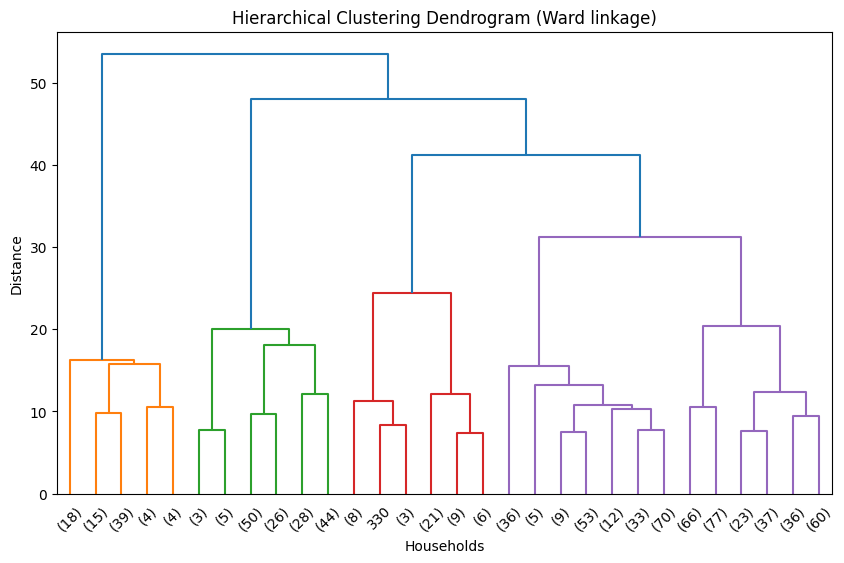

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Perform hierarchical clustering using Ward linkage.
behavioural_hierarchical_ward = linkage(behavioural_pca, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(behavioural_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=4

In [ ]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'behavioural_hierarchical_ward_results' for comparison across different k.
behavioural_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(behavioural_pca)

    behavioural_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(behavioural_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(behavioural_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(behavioural_pca, labels)
    })

# Convert to DataFrame
behavioural_hierarchical_ward_results_df = pd.DataFrame(behavioural_hierarchical_ward_results)
behavioural_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.390483,1.082043,192.618233
1,3,0.311699,1.245125,215.648830
2,4,0.353830,1.148676,231.849904
3,5,0.272879,1.231580,226.213440
4,6,0.282857,1.174996,212.677821
5,7,0.232056,1.195012,198.884193
6,8,0.243633,1.163502,191.019340
7,9,0.240263,1.238126,183.761542
8,10,0.236805,1.231477,176.593934


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = behavioural_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.390483 at k = 2.0
Best Davies-Bouldin Index: 1.082043 at k = 2.0
Best Calinski-Harabasz Index: 231.849904 at k = 4.0


k=2 was selected for hierarchical ward clustering based on the following:
- it provides clearer and more interpretable clusters compared to k=3 or 4
- it has the highest Silhouette score of 0.390
- it has the lowest Davies-Bouldin Index (DBI) of 1.082


In [ ]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_hierarchical_ward_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Fit final hierarchical ward clustering model using k=2
final_k = 2
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(behavioural_pca)

# Add cluster labels to the 'behavioural_hierarchical_ward_cluster_df'
behavioural_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(behavioural_pca, cluster_labels)
dbi_score = davies_bouldin_score(behavioural_pca, cluster_labels)
chi_score = calinski_harabasz_score(behavioural_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=2: 0.390483
Davies-Bouldin Index for k=2: 1.082043
Calinski-Harabasz Index for k=2: 192.618233


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_hierarchical_ward_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_hierarchical_ward_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_hierarchical_ward_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_hierarchical_ward_cluster_summary = pd.DataFrame(behavioural_hierarchical_ward_cluster_summary)

# Sort clusters by household count descending
behavioural_hierarchical_ward_cluster_summary = behavioural_hierarchical_ward_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
behavioural_hierarchical_ward_cluster_summary['cluster'] = range(1, len(behavioural_hierarchical_ward_cluster_summary)+1)

# Display the summary
behavioural_hierarchical_ward_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,1,721,0.502346,0.498396,0.501604,0.000671,0.006269,0.993731,0.660162,0.238266,0.077004,0.383631,0.351351,1.000000e-06,0.110638,5.738700e-02
1,2,80,0.482653,0.473103,0.526897,0.001680,0.012874,0.987126,0.715411,0.239864,0.054354,0.520469,0.144692,1.000000e-06,0.238673,1.000000e-06


In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_hierarchical_ward_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_hierarchical_ward_cluster_df, cluster_col='cluster')

# Cluster differentiation results
behavioural_hierarchical_ward_differentiation = behavioural_hierarchical_ward_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_hierarchical_ward_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.000107,0.034414
inverse_retail_discount_usage_proportion,0.007604,0.291584
inverse_retail_discount_no_usage_proportion,0.007604,0.291584
inverse_coupon_discount_mean,0.004909,0.233955
inverse_coupon_discount_usage_proportion,0.007731,0.294018
inverse_coupon_discount_no_usage_proportion,0.007731,0.294018
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.000720,0.089402
inverse_received_campaign_and_16_coupons_proportion,0.000505,0.074894
inverse_received_campaign_and_all_coupons_proportion,0.005316,0.243523


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.59: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Morning, evening and night proportions have medium effects in differentiating household segments.

2. Afternoon proportion has small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have negligible effects in differentiating household segments.

4. Morning, evening and night proportions have large average group means difference across all pairwise cluster.

5. Afternoon proportion has medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have small or  negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_hierarchical_ward_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category           top_4_category        top_5_category        top_6_category                   top_7_category                   top_8_category top_9_category                   top_10_category       top_11_category       top_12_category      top_13_category top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       1    721 Coupon Discount No Usage Did Not Receive Campaign And No Coupons     Retail Discount Mean Retail Discount No Usage Retail Discount Usage             Afternoon                          Evening Received Campaign And 16 Coupons        Morning Received Campaign And All Coupons                 Night Coupon Discount Usage Coupon Discount Mean        Midnight     0.993731     0.660162     0.502346     0

The top three behavioural variables with the largest differences between the two clusters are morning, afternoon, and evening shopping behaviours. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_hierarchical_ward_cluster_proportion = behavioural_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_hierarchical_ward_cluster_proportion)

cluster
1    0.900125
2    0.099875
Name: proportion, dtype: float64


The clusters are severely imbalanced.

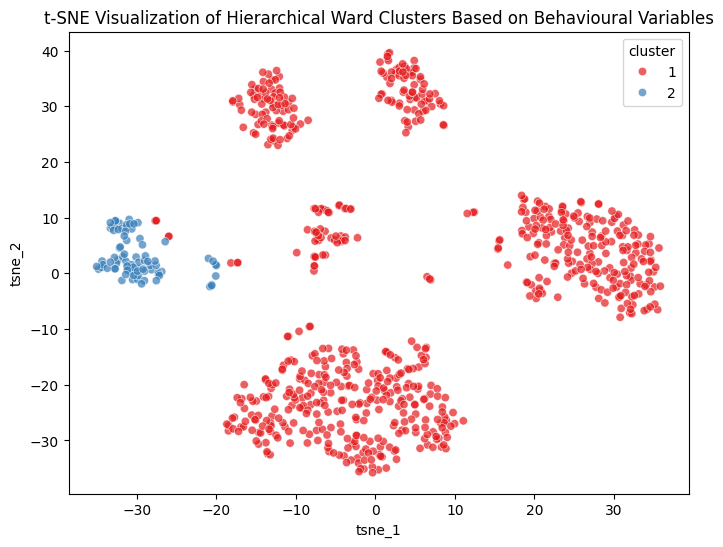

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'behavioural_hierarchical_ward_cluster_df'
behavioural_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on Behavioural Variables')
plt.show()

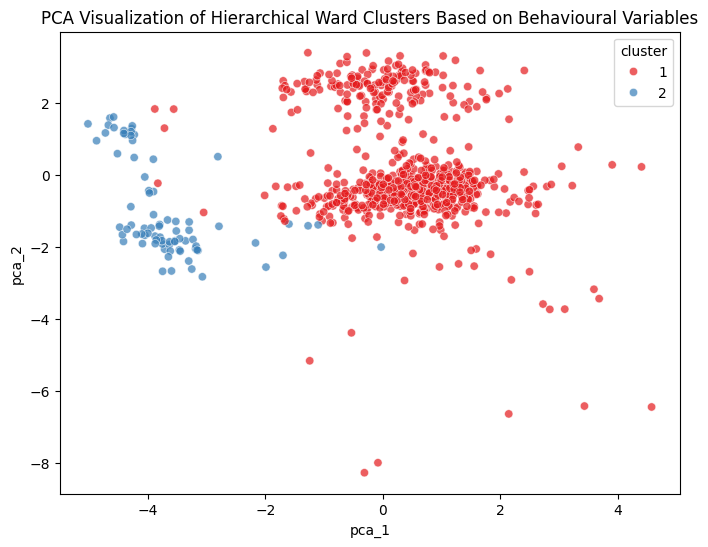

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_hierarchical_ward_cluster_df'
behavioural_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on Behavioural Variables')
plt.show()

## Model 15: Hierarchical Clustering (Average Linkage)

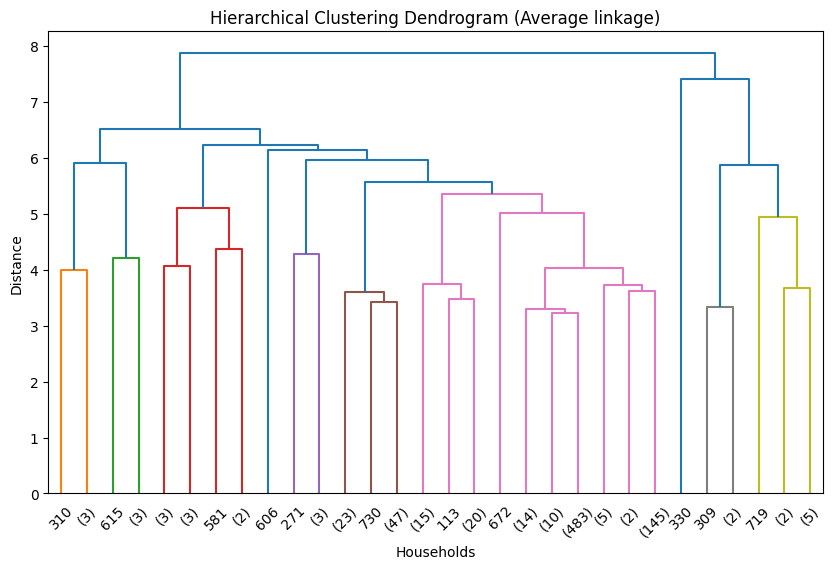

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Perform hierarchical clustering using Average linkage.
behavioural_hierarchical_average = linkage(behavioural_pca, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(behavioural_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=3

In [ ]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'behavioural_hierarchical_average_results' for comparison across different k.
behavioural_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(behavioural_pca)

    behavioural_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(behavioural_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(behavioural_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(behavioural_pca, labels)
    })

# Convert to DataFrame
behavioural_hierarchical_average_results_df = pd.DataFrame(behavioural_hierarchical_average_results)
behavioural_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.510431,0.920768,59.830866
1,3,0.499425,0.729142,32.488495
2,4,0.411002,0.970669,29.934429
3,5,0.372815,1.002599,29.496777
4,6,0.324941,0.913259,24.448127
5,7,0.297347,0.912688,22.735029
6,8,0.289892,0.834846,20.634761
7,9,0.288355,0.807594,19.119196
8,10,0.343268,0.800485,46.608657


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = behavioural_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.510431 at k = 2.0
Best Davies-Bouldin Index: 0.729142 at k = 3.0
Best Calinski-Harabasz Index: 59.830866 at k = 2.0


k=2 was selected for hierarchical average clustering based on the following:
- it provides clearer and more interpretable clusters compared to k=3 or 4
- it has the highest Silhouette score of 0.510
- it has the highest Calinski-Harabasz Index (CHI) of 59.831


In [ ]:
# Create a copy of the dataset to add hierarchical average cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_hierarchical_average_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated variables before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Fit final hierarchical average clustering model using k=2
final_k = 2
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(behavioural_pca)

# Add cluster labels to the 'behavioural_hierarchical_average_cluster_df'
behavioural_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(behavioural_pca, cluster_labels)
dbi_score = davies_bouldin_score(behavioural_pca, cluster_labels)
chi_score = calinski_harabasz_score(behavioural_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=2: 0.510431
Davies-Bouldin Index for k=2: 0.920768
Calinski-Harabasz Index for k=2: 59.830866


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_hierarchical_average_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_hierarchical_average_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_hierarchical_average_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_hierarchical_average_cluster_summary = pd.DataFrame(behavioural_hierarchical_average_cluster_summary)

# Sort clusters by household count descending
behavioural_hierarchical_average_cluster_summary = behavioural_hierarchical_average_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
behavioural_hierarchical_average_cluster_summary['cluster'] = range(1, len(behavioural_hierarchical_average_cluster_summary)+1)

# Display the summary
behavioural_hierarchical_average_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,1,789,0.500012,0.494980,0.505020,0.000812,0.006739,0.993261,0.660188,0.240646,0.075669,0.392111,0.339736,0.000001,0.118115,0.048927
1,2,12,0.479851,0.486033,0.513967,0.000000,0.000001,0.999999,0.999998,0.000001,0.000001,0.367032,0.329596,0.000001,0.151413,0.040756


In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_hierarchical_average_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_hierarchical_average_cluster_df, cluster_col='cluster')

# Cluster differentiation results
behavioural_hierarchical_average_differentiation = behavioural_hierarchical_average_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_hierarchical_average_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.001361,0.303475
inverse_retail_discount_usage_proportion,0.002010,0.368944
inverse_retail_discount_no_usage_proportion,0.002010,0.368944
inverse_coupon_discount_mean,0.002807,0.436213
inverse_coupon_discount_usage_proportion,0.005072,0.587049
inverse_coupon_discount_no_usage_proportion,0.005072,0.587049
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.048825,1.862732
inverse_received_campaign_and_16_coupons_proportion,0.065715,2.180480
inverse_received_campaign_and_all_coupons_proportion,0.005889,0.632794


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.59: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. 'received campaign and 16 coupons proportion' has medium effect in differentiating household segments.

2. 'did not receive campaign and no coupon' has small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, received campaign and all coupons, morning, afternoon, evening, night and midnight) have negligible effects in differentiating household segments.

4. 'Did not receive campaign and no coupon' and 'received campaign and 16 coupons' proportions have large average group means difference across all pairwise cluster.

5. 'received campaign and all coupons', coupon discount usage and coupon discount no usage proportions have medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, morning, afternoon, evening, night and midnight) have small or negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_hierarchical_average_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category        top_4_category        top_5_category top_6_category top_7_category                   top_8_category top_9_category                   top_10_category       top_11_category       top_12_category                  top_13_category      top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       1    789 Coupon Discount No Usage Did Not Receive Campaign And No Coupons Retail Discount No Usage  Retail Discount Mean Retail Discount Usage      Afternoon        Evening Received Campaign And 16 Coupons        Morning Received Campaign And All Coupons                 Night Coupon Discount Usage             Coupon Discount Mean             Midnight     0.993261     0.660188     0.505020     0.500012     0.494980  

The top three behavioural variables with the largest differences between the two clusters are 'did not receive campaign and no coupons', 'received campaign and 16 coupons' and 'received campaign and all coupons'. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_hierarchical_average_cluster_proportion = behavioural_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_hierarchical_average_cluster_proportion)

cluster
1    0.014981
2    0.985019
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

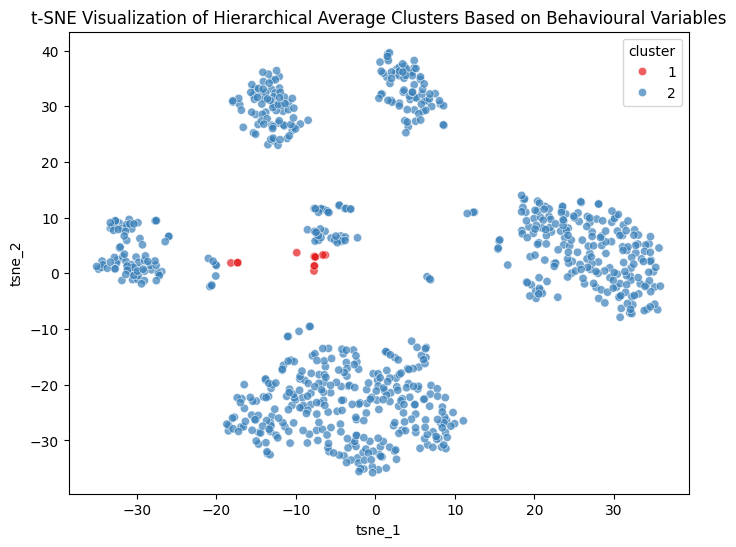

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'behavioural_hierarchical_average_cluster_df'
behavioural_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on Behavioural Variables')
plt.show()

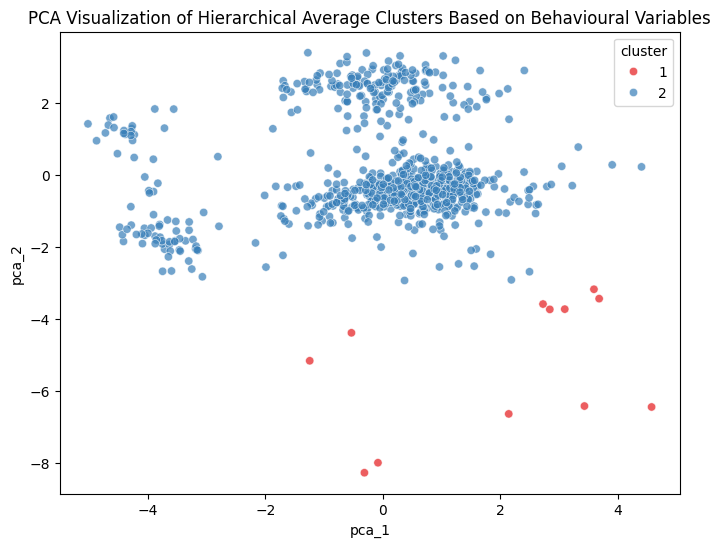

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_hierarchical_average_cluster_df'
behavioural_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on Behavioural Variables')
plt.show()

## Model 16: Hierarchical Clustering (Complete Linkage)

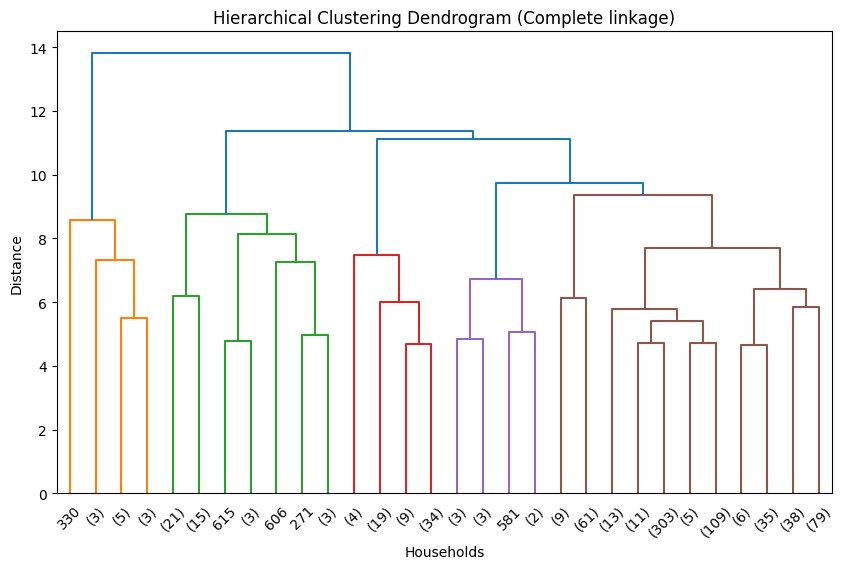

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Perform hierarchical clustering using Complete linkage.
behavioural_hierarchical_complete = linkage(behavioural_pca, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(behavioural_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2.

In [ ]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'behavioural_hierarchical_complete_results' for comparison across different k.
behavioural_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(behavioural_pca)

    behavioural_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(behavioural_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(behavioural_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(behavioural_pca, labels)
    })

# Convert to DataFrame
behavioural_hierarchical_complete_results_df = pd.DataFrame(behavioural_hierarchical_complete_results)
behavioural_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.510431,0.920768,59.830866
1,3,0.359527,1.323603,73.987226
2,4,0.369329,1.210474,125.885422
3,5,0.376896,1.178196,107.427720
4,6,0.180613,1.330516,104.594921
5,7,0.184641,1.303397,96.305452
6,8,0.184873,1.194532,84.365660
7,9,0.186498,1.098887,76.327857
8,10,0.274724,1.053317,123.255996


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = behavioural_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.510431 at k = 2.0
Best Davies-Bouldin Index: 0.920768 at k = 2.0
Best Calinski-Harabasz Index: 125.885422 at k = 4.0


k=2 was selected for hierarchical complete clustering based on the following:
- it provides clearer and more interpretable clusters compared to k=3 or 4
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.510
- it has the lowest Davies-Bouldin Index (DBI) of 0.921


In [ ]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_hierarchical_complete_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated variables before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(behavioural_pca)

# Add cluster labels to the 'behavioural_hierarchical_complete_cluster_df'
behavioural_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(behavioural_pca, cluster_labels)
dbi_score = davies_bouldin_score(behavioural_pca, cluster_labels)
chi_score = calinski_harabasz_score(behavioural_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.510431
Davies-Bouldin Index for k=2: 0.920768
Calinski-Harabasz Index for k=2: 59.830866


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_hierarchical_complete_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_hierarchical_complete_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_hierarchical_complete_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_hierarchical_complete_cluster_summary = pd.DataFrame(behavioural_hierarchical_complete_cluster_summary)

# Sort clusters by household count descending
behavioural_hierarchical_complete_cluster_summary = behavioural_hierarchical_complete_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
behavioural_hierarchical_complete_cluster_summary['cluster'] = range(1, len(behavioural_hierarchical_complete_cluster_summary)+1)

# Display the summary
behavioural_hierarchical_complete_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,1,789,0.500012,0.494980,0.505020,0.000812,0.006739,0.993261,0.660188,0.240646,0.075669,0.392111,0.339736,0.000001,0.118115,0.048927
1,2,12,0.479851,0.486033,0.513967,0.000000,0.000001,0.999999,0.999998,0.000001,0.000001,0.367032,0.329596,0.000001,0.151413,0.040756


In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_hierarchical_complete_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_hierarchical_complete_cluster_df, cluster_col='cluster')

# Cluster differentiation results
behavioural_hierarchical_complete_differentiation = behavioural_hierarchical_complete_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_hierarchical_complete_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.001361,0.303475
inverse_retail_discount_usage_proportion,0.002010,0.368944
inverse_retail_discount_no_usage_proportion,0.002010,0.368944
inverse_coupon_discount_mean,0.002807,0.436213
inverse_coupon_discount_usage_proportion,0.005072,0.587049
inverse_coupon_discount_no_usage_proportion,0.005072,0.587049
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.048825,1.862732
inverse_received_campaign_and_16_coupons_proportion,0.065715,2.180480
inverse_received_campaign_and_all_coupons_proportion,0.005889,0.632794


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.59: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. 'received campaign and 16 coupons proportion' has medium effect in differentiating household segments.

2. 'did not receive campaign and no coupon' has small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, received campaign and all coupons, morning, afternoon, evening, night and midnight) have negligible effects in differentiating household segments.

4. 'Did not receive campaign and no coupon' and 'received campaign and 16 coupons' proportions have large average group means difference across all pairwise cluster.

5. 'received campaign and all coupons', coupon discount usage and coupon discount no usage proportions have medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, morning, afternoon, evening, night and midnight) have small or negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_hierarchical_complete_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category        top_4_category        top_5_category top_6_category top_7_category                   top_8_category top_9_category                   top_10_category       top_11_category       top_12_category                  top_13_category      top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       1    789 Coupon Discount No Usage Did Not Receive Campaign And No Coupons Retail Discount No Usage  Retail Discount Mean Retail Discount Usage      Afternoon        Evening Received Campaign And 16 Coupons        Morning Received Campaign And All Coupons                 Night Coupon Discount Usage             Coupon Discount Mean             Midnight     0.993261     0.660188     0.505020     0.500012     0.494980  

The top three behavioural variables with the largest differences between the two clusters are 'did not receive campaign and no coupons', 'received campaign and 16 coupons' and 'received campaign and all coupons'. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_hierarchical_complete_cluster_proportion = behavioural_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_hierarchical_complete_cluster_proportion)

cluster
1    0.985019
2    0.014981
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

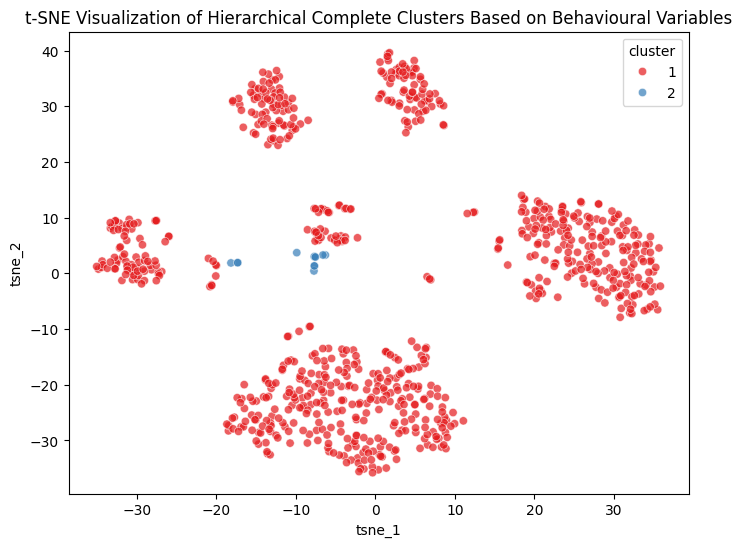

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'behavioural_hierarchical_complete_cluster_df'
behavioural_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on Behavioural Variables')
plt.show()

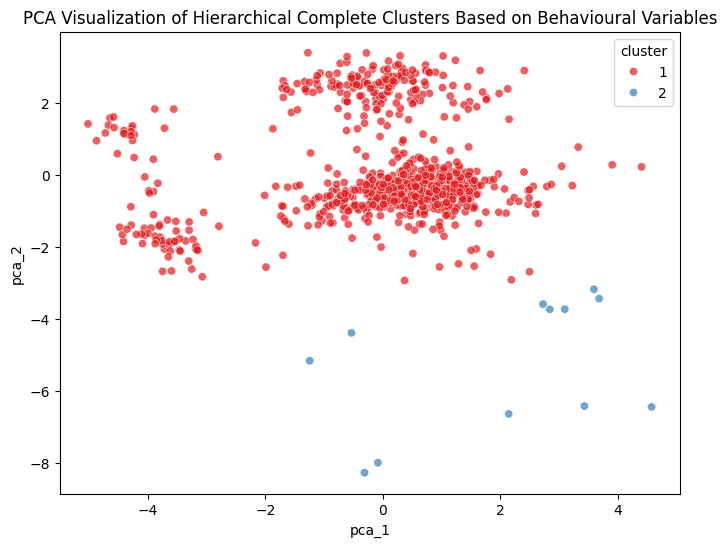

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_hierarchical_complete_cluster_df'
behavioural_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on Behavioural Variables')
plt.show()

## Model 17: DBSCAN

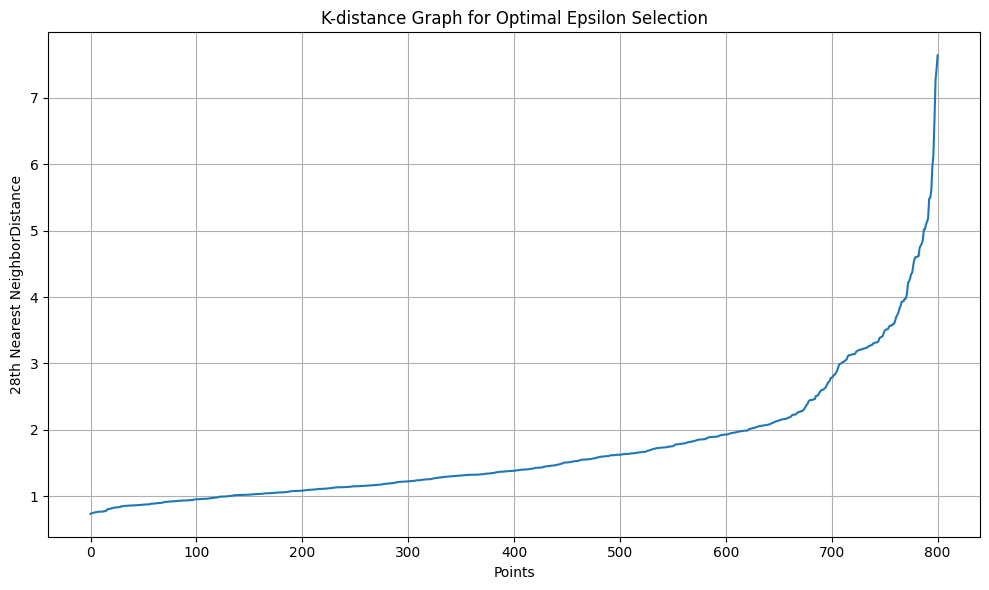

In [ ]:
# Apply PCA to reduce dimensions of behavioural_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 12 variables ('national_proportion', 'private_proportion', 'alcohol_proportion', 'deli & bakery_proportion',
# 'entertainment & leisure_proportion', 'general_grocery_proportion', 'health_personal_care_proportion', '
# home & lifestyle_proportion', 'meat_proportion', 'miscellaneous & services_proportion', 'produce_proportion'
# and'seafood_proportion' variables, so n_neighbors / min_samples = 24.

# Calculate distances to the 24 nearest neighbors for each point.
# The distance to the 24th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 28
behavioural_neighbors = NearestNeighbors(n_neighbors=k).fit(behavioural_pca)
distances, indices = behavioural_neighbors.kneighbors(behavioural_pca)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 4.0.

In [ ]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Define parameter ranges for DBSCAN
eps_range = [1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, 3.0,]
min_samples_range = [27, 28, 29]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'behavioural_dbscan_results'
# for comparison across different eps range and minimum samples range.
behavioural_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering on 'behavioural_pca'
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(behavioural_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = behavioural_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(behavioural_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        behavioural_dbscan_results.append(result)

# Convert to DataFrame
behavioural_dbscan_results_df = pd.DataFrame(behavioural_dbscan_results)
behavioural_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,1.6,27,2,139,0.173533,0.540048,0.429974,0.708018,116.673614
1,1.6,28,2,140,0.174782,0.539288,0.430572,0.707368,116.995788
2,1.6,29,1,169,0.210986,NaN,NaN,NaN,NaN
3,1.8,27,2,110,0.137328,0.559783,0.436866,0.778159,180.095389
4,1.8,28,2,113,0.141074,0.556755,0.434188,0.760311,169.012878
5,1.8,29,2,113,0.141074,0.556755,0.434188,0.760311,169.012878
6,2.0,27,2,96,0.119850,0.578444,0.433221,0.799972,189.952848
7,2.0,28,2,97,0.121099,0.577600,0.431964,0.794364,186.154094
8,2.0,29,2,98,0.122347,0.576858,0.432522,0.794050,186.610296
9,2.2,27,2,77,0.096130,0.594001,0.439520,0.899357,237.611864


In [ ]:
# Highest DBCV Score
best_dbcv_idx = behavioural_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = behavioural_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = behavioural_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.598926 at eps = 2.4, min_samples = 27.0
Best Silhouette Score: 0.442147 at eps = 2.4, min_samples = 27.0
Best Davies-Bouldin Index: 0.707368 at eps = 1.6, min_samples = 28.0
Best Calinski-Harabasz Index: 256.367054 at eps = 2.4, min_samples = 27.0


We tested with different epsilon values (1.6, 1.8, 2.0, 2.2, 2.4 & 2.6) and minimum samples values (27, 28 & 29).


eps=2.4 and min_sample = 27 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio of 0.089
- High DBCV score of 0.599
- High Silhouette score of 0.442
- High Calinski-Harabasz index  of 256.367

In [ ]:
# Create a copy of the dataset to add DBSCAN cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_dbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 2.4
best_min_samples = 27
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(behavioural_pca)

# Add cluster labels to the 'behavioural_dbscan_cluster_df'
behavioural_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 2.4 and best_min_samples = 27
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = behavioural_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(behavioural_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_dbscan_cluster_df.head(5)

Number of clusters for eps=2.4 & min_samples=27: 2
Number of noise for eps=2.4 & min_samples=27: 71
Noise ratio for eps=2.4 & min_samples=27: 0.088639
DBCV Score for eps=2.4 & min_samples=27: 0.598926
Silhouette Score for eps=2.4 & min_samples=27: 0.442147
Davies-Bouldin Index for eps=2.4 & min_samples=27: 0.922229
Calinski-Harabasz Index for eps=2.4 & min_samples=27: 256.367054


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_dbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_dbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_dbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_dbscan_cluster_summary = pd.DataFrame(behavioural_dbscan_cluster_summary)

# Display the summary
behavioural_dbscan_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,0,71,0.453079,0.458836,0.541164,0.000000,0.000001,0.999999,0.778308,0.200218,0.020240,0.360000,0.313456,1.000000e-06,0.111688,5.139496e-02
1,1,71,0.479868,0.473824,0.526176,0.002177,0.014192,0.985808,0.716849,0.239963,0.053318,0.532167,0.129518,1.000000e-06,0.260869,1.000000e-06
2,2,659,0.507271,0.502412,0.497588,0.000852,0.006787,0.993213,0.651709,0.242647,0.086801,0.385880,0.357022,1.000000e-06,0.110363,5.677862e-02


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_dbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_dbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
behavioural_dbscan_differentiation = behavioural_dbscan_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_dbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.000029,0.018223
inverse_retail_discount_usage_proportion,0.005598,0.252863
inverse_retail_discount_no_usage_proportion,0.005598,0.252863
inverse_coupon_discount_mean,0.007970,0.302088
inverse_coupon_discount_usage_proportion,0.011598,0.365071
inverse_coupon_discount_no_usage_proportion,0.011598,0.365071
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.002226,0.159201
inverse_received_campaign_and_16_coupons_proportion,0.000051,0.024166
inverse_received_campaign_and_all_coupons_proportion,0.007620,0.295315


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For DBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Morning, evening and night proportions have medium effects in differentiating household segments.

2. coupon discount usage and afternoon proportions have small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount no usage, received campaign and all coupons, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons and midnight) have negligible effects in differentiating household segments.

4. Morning, evening and night proportions have large average group means difference across all pairwise cluster.

5. Afternoon proportion has medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have small or  negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_dbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category           top_4_category           top_5_category        top_6_category top_7_category                   top_8_category top_9_category                   top_10_category                   top_11_category       top_12_category      top_13_category      top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       0     71 Coupon Discount No Usage Did Not Receive Campaign And No Coupons Retail Discount No Usage    Retail Discount Usage     Retail Discount Mean             Afternoon        Evening Received Campaign And 16 Coupons        Morning                             Night Received Campaign And All Coupons Coupon Discount Usage             Midnight Coupon Discount Mean     0.999999     0.778308     0.541164  

The top three behavioural variables with the largest differences between the two clusters are morning, afternoon, and evening shopping behaviours. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_dbscan_cluster_proportion = behavioural_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_dbscan_cluster_proportion)

cluster
0    0.088639
1    0.088639
2    0.822722
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

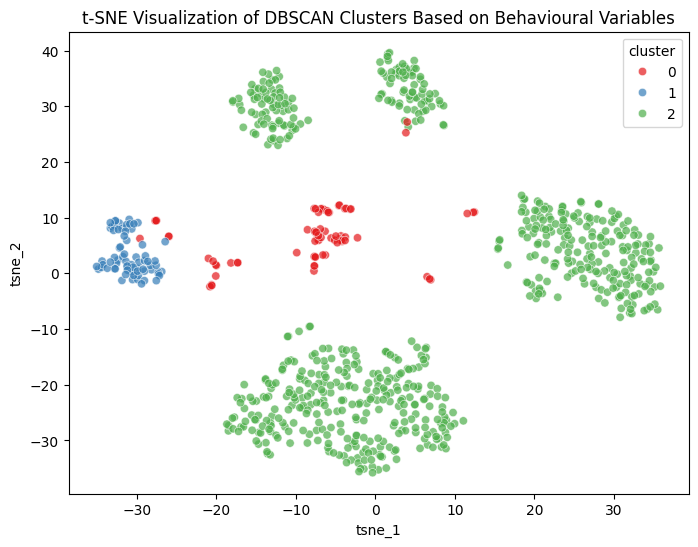

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'behavioural_dbscan_cluster_df'
behavioural_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on Behavioural Variables')
plt.show()

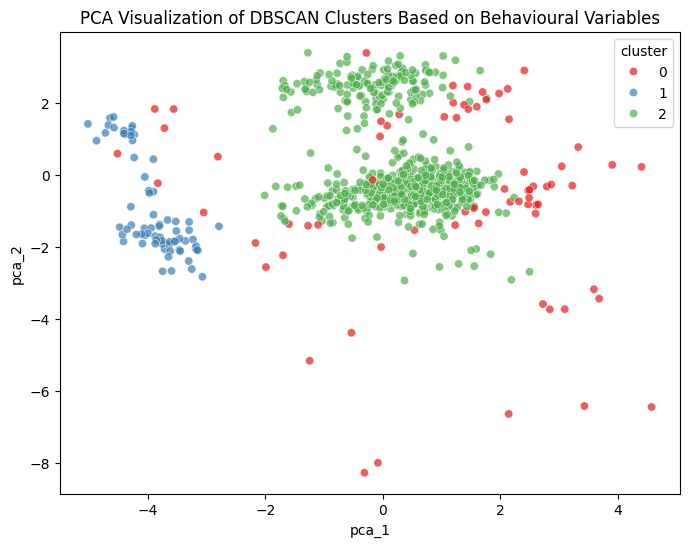

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_dbscan_df'
behavioural_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Behavioural Variables')
plt.show()

## Model 18: HDBSCAN

In [ ]:
# For HDBSCAN, min_cluster_size is the minimum number of points requried to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Apply PCA to reduce dimensions of _array while retaining 90% of the variance
pca = PCA(n_components=0.90)
behavioural_pca = pca.fit_transform(behavioural_array)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 20, 30, 50]
min_samples_range = [1, 5, 10, 15, 20]

# Store results
behavioural_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        behavioural_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = behavioural_hdbscan.fit_predict(behavioural_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = behavioural_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(behavioural_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        behavioural_hdbscan_results.append(result)

# Convert to DataFrame
behavioural_hdbscan_results_df = pd.DataFrame(behavioural_hdbscan_results)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

behavioural_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,7,24,0.029963,0.295629,0.329728,0.888000,75.436915
1,5,5,7,184,0.229713,0.371681,0.351165,0.936001,226.772024
2,5,10,3,48,0.059925,0.609126,0.390025,0.931912,175.441254
3,5,15,3,66,0.082397,0.602824,0.376310,0.864318,149.042584
4,5,20,2,95,0.118602,0.579675,0.438025,0.843019,206.668092
5,10,1,9,120,0.149813,-0.048953,0.312971,1.087209,188.185236
6,10,5,6,175,0.218477,0.377266,0.354828,1.005654,276.327726
7,10,10,3,48,0.059925,0.609126,0.390025,0.931912,175.441254
8,10,15,3,66,0.082397,0.602824,0.376310,0.864318,149.042584
9,10,20,2,95,0.118602,0.579675,0.438025,0.843019,206.668092


In [ ]:
# Highest DBCV Score
best_dbcv_idx = behavioural_hdbscan_results_df['dbcv_score'].idxmax()
best_dbcv = behavioural_hdbscan_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = behavioural_hdbscan_results_df['silhouette_score'].idxmax()
best_silhouette = behavioural_hdbscan_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = behavioural_hdbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = behavioural_hdbscan_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = behavioural_hdbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = behavioural_hdbscan_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.609126 at min_cluster_size = 5.0, min_samples = 10.0
Best Silhouette Score: 0.442305 at min_cluster_size = 30.0, min_samples = 10.0
Best Davies-Bouldin Index: 0.843019 at min_cluster_size = 5.0, min_samples = 20.0
Best Calinski-Harabasz Index: 277.367563 at min_cluster_size = 50.0, min_samples = 1.0


min_cluster_size = 30.0, min_samples = 10.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 2 (It is simple for interpretation for behavioural variables.)
- Low noise ratio equal to 0.095
- High DBCV score at 0.595
- Highest Silhouette score of 0.442
- Moderate Davies-Bouldin index of 0.906 and Calinski-Harabasz index of 246.222.

In [ ]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on behavioural variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
behavioural_hdbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 30
best_min_samples = 10
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(behavioural_pca)

# Add cluster labels to the dataframe
behavioural_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = behavioural_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(behavioural_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
behavioural_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=30 & min_samples=10: 2
Number of noise for min_cluster_size=30 & min_samples=10: 76
Noise ratio for min_cluster_size=30 & min_samples=10: 0.094881
DBCV Score for min_cluster_size=30 & min_samples=10: 0.594905
Silhouette Score for min_cluster_size=30 & min_samples=10: 0.442305
Davies-Bouldin Index for min_cluster_size=30 & min_samples=10: 0.906371
Calinski-Harabasz Index for min_cluster_size=30 & min_samples=10: 246.222778


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on behavioural variables
behavioural_cols_of_interest = [
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion'
]

# Initialize an empty list to store cluster summaries
behavioural_hdbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in behavioural_hdbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in behavioural_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    behavioural_hdbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
behavioural_hdbscan_cluster_summary = pd.DataFrame(behavioural_hdbscan_cluster_summary)

# Display the summary
behavioural_hdbscan_cluster_summary

,cluster,count,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median
0,0,76,0.452268,0.458067,0.541933,0.000000,0.000001,0.999999,0.778708,0.201859,0.020457,0.375816,0.304034,1.000000e-06,0.124570,4.060037e-02
1,1,67,0.489091,0.473824,0.526176,0.001903,0.013578,0.986422,0.716849,0.243352,0.053318,0.532167,0.153165,1.000000e-06,0.244089,1.000000e-06
2,2,658,0.507328,0.502430,0.497570,0.000862,0.006807,0.993193,0.651485,0.242693,0.087135,0.385743,0.357448,1.000000e-06,0.110499,5.693980e-02


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for behavioural variables
behavioural_hdbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=behavioural_hdbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
behavioural_hdbscan_differentiation = behavioural_hdbscan_numerical_analyzer.compare_all_features(behavioural_cols_of_interest)
behavioural_hdbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_retail_discount_mean,0.000342,0.063734
inverse_retail_discount_usage_proportion,0.004108,0.221452
inverse_retail_discount_no_usage_proportion,0.004108,0.221452
inverse_coupon_discount_mean,0.008231,0.314134
inverse_coupon_discount_usage_proportion,0.011955,0.379300
inverse_coupon_discount_no_usage_proportion,0.011955,0.379300
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.002201,0.161961
inverse_received_campaign_and_16_coupons_proportion,0.000110,0.036207
inverse_received_campaign_and_all_coupons_proportion,0.008243,0.314363


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For HDBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Morning, evening and night proportions have medium effects in differentiating household segments.

2. coupon discount usage and afternoon proportions have small effects in differentiating household segments.

3. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount no usage, received campaign and all coupons, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons and midnight) have negligible effects in differentiating household segments.

4. Morning, evening and night proportions have large average group means difference across all pairwise cluster.

5. Afternoon proportion has medium average group means difference across all pairwise cluster.

6. Retail discount mean, coupon discount mean and other proportions (retail discount usage, retail discount no usage, coupon discount usage, coupon discount no usage, did not receive campaign and no coupon, received campaign and 16 coupons, received campaign and all coupons, and midnight) have small or  negligible average group means difference across all pairwise cluster.

In [ ]:
# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in behavioural_hdbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    # Get all behavioural medians
    category_medians = {col: row[f'{col}_median'] for col in behavioural_cols_of_interest}

    # Sort descending
    sorted_categories = sorted(category_medians.items(), key=lambda x: x[1], reverse=True)

    # Clean category names
    clean_names = [col.replace('inverse_', '')
                      .replace('_proportion', '')
                      .replace('_', ' ')
                      .title() for col, _ in sorted_categories]
    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("\n=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")
for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(" Top Behavioural Features Breakdown:")
    for i in range(1, len(behavioural_cols_of_interest)+1):
        feature = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f" {i}. {feature}: {value:.1%}")
    print()


=== CLUSTER INSIGHTS ===

 cluster  count           top_1_category                          top_2_category           top_3_category           top_4_category           top_5_category        top_6_category top_7_category                   top_8_category top_9_category                   top_10_category                   top_11_category       top_12_category      top_13_category      top_14_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value  top_11_value  top_12_value  top_13_value  top_14_value
       0     76 Coupon Discount No Usage Did Not Receive Campaign And No Coupons Retail Discount No Usage    Retail Discount Usage     Retail Discount Mean             Afternoon        Evening Received Campaign And 16 Coupons        Morning                             Night Received Campaign And All Coupons Coupon Discount Usage             Midnight Coupon Discount Mean     0.999999     0.778708     0.541933  

The top three behavioural variables with the largest differences between the two clusters are morning, afternoon, and evening shopping behaviours. All other behavioural variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation.

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
behavioural_hdbscan_cluster_proportion = behavioural_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(behavioural_hdbscan_cluster_proportion)

cluster
0    0.094881
1    0.083645
2    0.821473
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

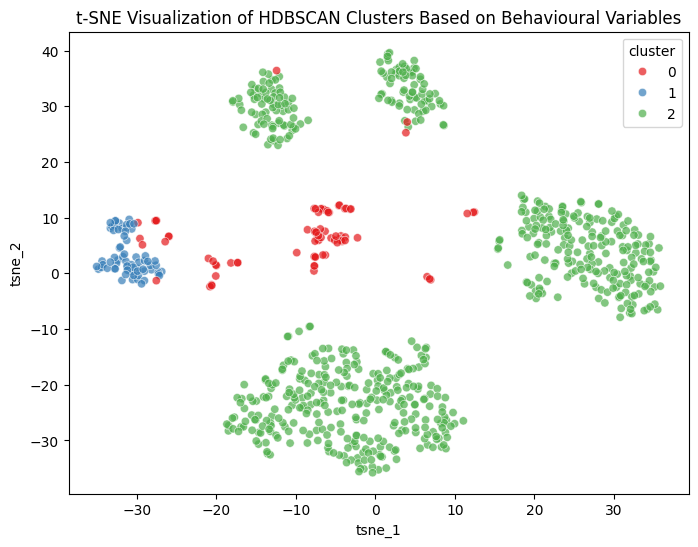

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(behavioural_pca)

# Add t-SNE results to 'behavioural_hdbscan_cluster_df'
behavioural_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
behavioural_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on Behavioural Variables')
plt.show()

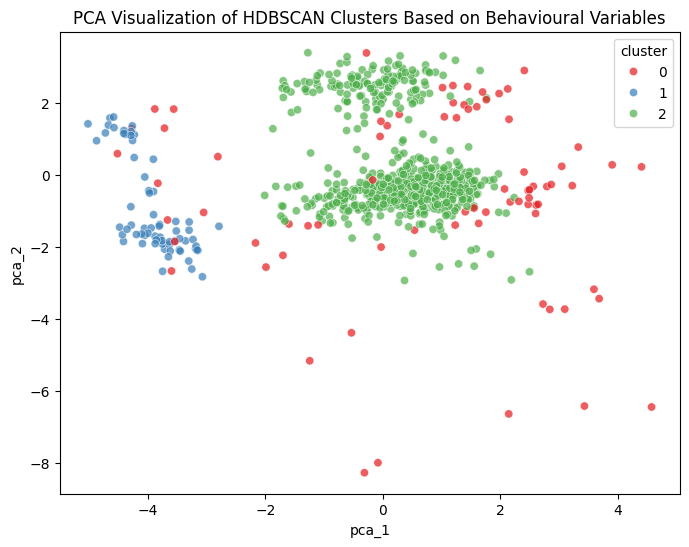

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(behavioural_pca)

# Add PCA results to 'behavioural_Hdbscan_df'
behavioural_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
behavioural_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=behavioural_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of HDBSCAN Clusters Based on Behavioural Variables')
plt.show()

# Product Preference

## Model 19: K-Means

### Main: Use k = 2

In [ ]:
# Display first 5 rows of the dataset
household_profile_df[
    [
        'national_proportion',
        'private_proportion',
        'alcohol_proportion',
        'deli & bakery_proportion',
        'entertainment & leisure_proportion',
        'general_grocery_proportion',
        'health_personal_care_proportion',
        'home & lifestyle_proportion',
        'meat_proportion',
        'miscellaneous & services_proportion',
        'produce_proportion',
        'seafood_proportion'
    ]
].head()

,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
0,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881
1,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107
2,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544
3,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511
4,0.492382,-0.492382,0.152564,2.071352,0.166213,1.415026,1.086591,-0.864491,1.165722,1.238202,1.401472,-3.320718


In [ ]:
# Extract'national_proportion', 'alcohol_proportion', 'deli & bakery_proportion', 'entertainment & leisure_proportion',
# 'general_grocery_proportion', 'health_personal_care_proportion', 'home & lifestyle_proportion', 'meat_proportion', 'miscellaneous & services_proportion',
# 'produce_proportion' and'seafood_proportion' variables from house_profile dataset,
# and converts them into NumPy array.

# Not including 'private_proportion' for clustering algorithm because it is perfectly correlated with 'national_proportion'.
# It will add zero new information, and it only adds noise and redudancy during clustering.
product_array = household_profile_df[
    [
        'national_proportion',
        'alcohol_proportion',
        'deli & bakery_proportion',
        'entertainment & leisure_proportion',
        'general_grocery_proportion',
        'health_personal_care_proportion',
        'home & lifestyle_proportion',
        'meat_proportion',
        'miscellaneous & services_proportion',
        'produce_proportion',
        'seafood_proportion'
    ]
].values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [ ]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_kmeans_results' for comparison across different k.
product_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(product_pca)

    product_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert results to DataFrame
product_kmeans_results_df = pd.DataFrame(product_kmeans_results)
product_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,3784.065150,0.464237,0.998939,380.019775
1,3,2950.503587,0.278440,1.292342,356.109030
2,4,2586.143948,0.294070,1.115991,307.944090
3,5,2379.575893,0.235659,1.299917,267.967259
4,6,2200.372301,0.239246,1.361926,244.491017
5,7,2038.188704,0.224593,1.477073,230.208208
6,8,1892.464724,0.225660,1.336317,220.971100
7,9,1754.491329,0.226301,1.330336,216.077132
8,10,1641.704423,0.236773,1.306272,211.042776


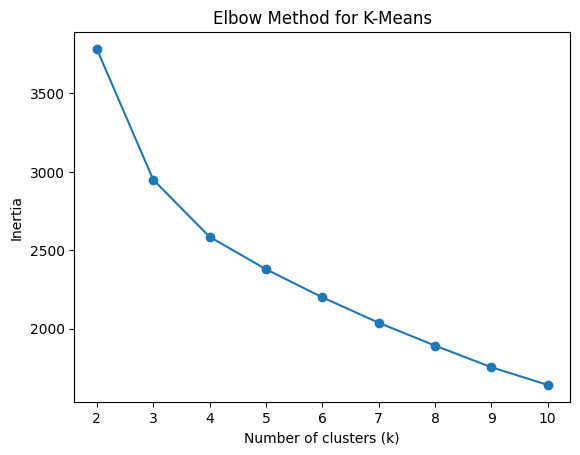

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(product_kmeans_results_df['k'], product_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = product_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = product_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.464237 at k = 2.0
Best Davies-Bouldin Index: 0.998939 at k = 2.0
Best Calinski-Harabasz Index: 380.019775 at k = 2.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=3, then a moderate drop from k=3 to k=5 and very small drops after that. Thus, based on the elbow method, k=3.

- Based on Silhouette score, the highest value (0.464) is at k=2, which provides the best clustering.

- Based on Davies-Bouldin Index (DBI), the lowest value (0.999) is at k=2, which provides the strongest clustering.

- Based on Calinski-Harabasz Index (CHI), the highest value (380.020) is at k=2, which provides the strongest clustering.
<br>

- The best k is 2 because:
1.   it provides clearer and more interpretable clusters compared to k=3 or 4
2.   it has the highest Silhouette score of 0.464
3.   it has the lowest Davies-Bouldin Index (DBI) of 0.999
4.   it has the highest Calinski-Harabasz Index (CHI) of 380.020




In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on product preference variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final K-Means model using k=2
final_k = 2
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(product_pca)

# Add cluster labels to the product_kmeans_cluster_df for us to interpret the clusters using the
# original features.
product_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_kmeans_cluster_df.head(10)

Silhouette Score for k=2: 0.464237
Davies-Bouldin Index for k=2: 0.998939
Calinski-Harabasz Index for k=2: 380.019775


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511

In [ ]:
# Define feature names in the same order as they appear in product_array
feature_names = [
    'national_proportion',
    'alcohol_proportion',
    'deli & bakery_proportion',
    'entertainment & leisure_proportion',
    'general_grocery_proportion',
    'health_personal_care_proportion',
    'home & lifestyle_proportion',
    'meat_proportion',
    'miscellaneous & services_proportion',
    'produce_proportion',
    'seafood_proportion'
]

# Create a DataFrame of PCA loadings
loadings = pd.DataFrame(
    pca.components_,
    columns=feature_names,
    index=[f'PC{i+1}' for i in range(pca.n_components_)]
)

# Display the dataframe
loadings

,national_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion
PC1,-0.026116,0.048697,-0.310113,0.011557,-0.337079,-0.347488,0.063644,-0.244816,-0.195411,-0.245487,0.709816
PC2,-0.096149,-0.194651,0.250321,-0.168122,0.309179,0.199925,-0.208779,0.411204,0.092256,0.285005,0.651124
PC3,-0.352338,-0.047375,-0.186663,-0.138557,-0.033576,-0.077801,0.027766,-0.112022,0.885350,-0.122182,0.017312
PC4,0.710577,-0.202011,0.080300,-0.026107,-0.052518,0.258413,0.085276,-0.479559,0.268579,0.212739,0.151544
PC5,0.563806,0.055570,-0.266015,0.020509,-0.062804,-0.101579,-0.088474,0.637886,0.195554,-0.374038,-0.026757
PC6,-0.026057,-0.564044,0.019553,0.652300,-0.113679,-0.385806,-0.056448,0.107013,0.080218,0.264147,-0.051787
PC7,0.138190,0.530314,0.334860,-0.023126,-0.175944,-0.451914,-0.477908,-0.049691,0.155801,0.310651,-0.013369


In [ ]:
# Show explained variance of each PC
explained_variance = pd.Series(
    pca.explained_variance_ratio_,
    index=loadings.index,
    name="Explained Variance Ratio"
)

explained_variance

,Explained Variance Ratio
PC1,0.346966
PC2,0.211601
PC3,0.122912
PC4,0.092646
PC5,0.054610
PC6,0.049676
PC7,0.038500


In [ ]:
# Check top contributing features per PC
for pc in loadings.index:
    print(f"\n{pc} – top contributing variables:")
    print(loadings.loc[pc].abs().sort_values(ascending=False).head(5))


PC1 – top contributing variables:
seafood_proportion                 0.709816
health_personal_care_proportion    0.347488
general_grocery_proportion         0.337079
deli & bakery_proportion           0.310113
produce_proportion                 0.245487
Name: PC1, dtype: float64

PC2 – top contributing variables:
seafood_proportion            0.651124
meat_proportion               0.411204
general_grocery_proportion    0.309179
produce_proportion            0.285005
deli & bakery_proportion      0.250321
Name: PC2, dtype: float64

PC3 – top contributing variables:
miscellaneous & services_proportion    0.885350
national_proportion                    0.352338
deli & bakery_proportion               0.186663
entertainment & leisure_proportion     0.138557
produce_proportion                     0.122182
Name: PC3, dtype: float64

PC4 – top contributing variables:
national_proportion                    0.710577
meat_proportion                        0.479559
miscellaneous & services_propor

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_kmeans_cluster_summary = pd.DataFrame(product_kmeans_cluster_summary)

# Sort clusters by household count descending
product_kmeans_cluster_summary = product_kmeans_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_kmeans_cluster_summary['cluster'] = range(1, len(product_kmeans_cluster_summary)+1)

# Display the summary
product_kmeans_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,684,0.722357,0.277643,1.000000e-06,0.036323,0.000001,0.636341,0.10944,0.001235,0.072718,0.011534,0.096745,4.429436e-03
1,2,117,0.734635,0.265365,1.000000e-06,0.036088,0.000001,0.655151,0.12629,0.000713,0.061682,0.011969,0.070796,1.000000e-06


In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_kmeans_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
product_kmeans_differentiation = product_kmeans_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_kmeans_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.001862,0.122132
inverse_private_proportion,0.001862,0.122132
inverse_alcohol_proportion,0.001465,0.108331
inverse_deli & bakery_proportion,0.002335,0.136819
inverse_entertainment & leisure_proportion,0.000371,0.054465
inverse_general_grocery_proportion,0.006250,0.224267
inverse_health_personal_care_proportion,0.015890,0.359340
inverse_home & lifestyle_proportion,0.009219,0.272783
inverse_meat_proportion,0.020372,0.407812


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Seafood proportion is the only variable that has a medium effect in differentiating household segments, it explains about 12% (medium eta-squared values of 0.1183) of the variance between household segments.

2. Health personal care, meat and produce proportions have small effects in differentiating household segments.

3. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have negligible effects in differentiating household segments.

4. Seafood proportion has large average group means difference across all pairwise cluster.

5. Other proportions (health personal care, meat, produce, national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) has small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    684         National             0.722357            0.277643 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.636341      0.10944     0.096745     0.072718     0.036323     0.011534     0.004429     0.001235 1.000000e-06  1.000000e-06
       2    117         National             0.734635            0.265365 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous A

 All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 (more focused on fresh food) has slightly higher spending on produce, meat, seafood and private brand compared to cluster 2.
- Cluster 2 (more focused on general grocery and health/personal care) has slightly higher spending on general grocery, health/personal care and national brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. deli & bakery (3.6%)
3. miscellaneous & services (1.2%)
4. home & lifestyle (0.1%)
5. alcohol (0.0%)
6. entertainment & leisure. (0.0%)


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_kmeans_cluster_proportion = product_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_kmeans_cluster_proportion)

cluster
1    0.853933
2    0.146067
Name: proportion, dtype: float64


The clusters are severely imbalanced.

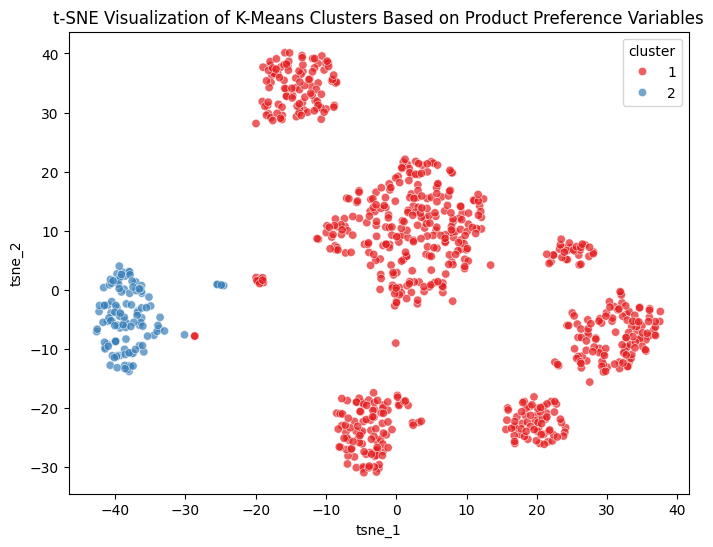

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'demographic_kmeans_cluster_df'
product_kmeans_cluster_df['tsne_1'] = tsne_results[:, 0]
product_kmeans_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of K-Means Clusters Based on Product Preference Variables')
plt.show()

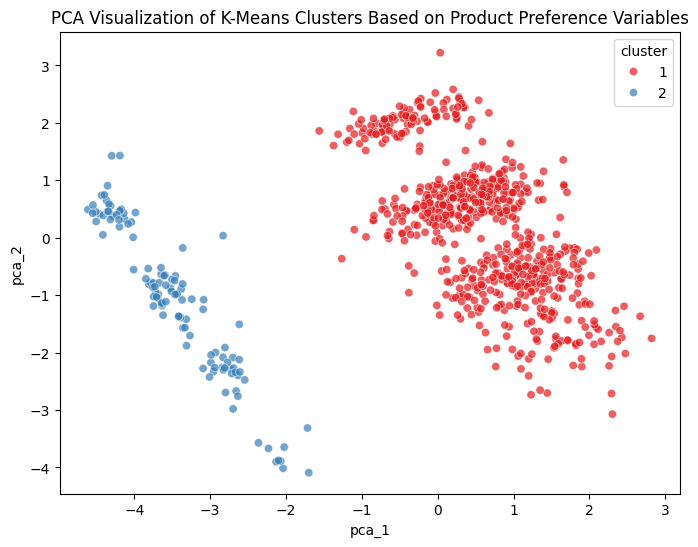

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_kmeans_cluster_df'
product_kmeans_cluster_df['pca_1'] = pca_results[:, 0]
product_kmeans_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_kmeans_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of K-Means Clusters Based on Product Preference Variables')
plt.show()

### Testing: Use different k values (k=4)

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final K-Means model using k=4
final_k = 4
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(product_pca)

# Add cluster labels to the product_kmeans_cluster_df for us to interpret the clusters using the
# original features.
product_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_kmeans_cluster_df.head(10)

Silhouette Score for k=4: 0.294070
Davies-Bouldin Index for k=4: 1.115991
Calinski-Harabasz Index for k=4: 307.944090


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster,tsne_1,tsne_2,pca_1,pca_2
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,1.638680e-01,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,5.790371e-04,0.064852,0.008686,0.090330,1.000000e-06,2,-36.803398,-3.615456,-3.807593,-0.808053
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,1.321928e-01,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,7.776034e-04,0.048989,0.004666,0.093312,7.776034e-04,1,-2.887683,16.509840,-0.576041,0.576502
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,1.869631e-01,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,6.568968e-03,0.068722,0.008590,0.081354,4.042442e-03,3,28.881777,-9.930691,1.289474,-1.101559
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.56929

In [ ]:
# Initialize an empty list to store cluster summaries
product_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_kmeans_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_kmeans_cluster_summary = pd.DataFrame(product_kmeans_cluster_summary)

# Display the summary
product_kmeans_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,387,0.716163,0.283837,1.000000e-06,0.034973,1.000000e-06,0.646730,0.102006,0.000710,0.076655,1.132684e-02,0.089420,4.595579e-03
1,2,112,0.740971,0.259029,1.000000e-06,0.034837,1.000000e-06,0.656322,0.127044,0.000718,0.059787,1.255995e-02,0.070668,1.000000e-06
2,3,288,0.730621,0.269379,4.431559e-04,0.037530,3.637026e-04,0.624099,0.118378,0.002019,0.066776,1.299485e-02,0.106641,4.324241e-03
3,4,14,0.719287,0.280713,1.000000e-06,0.053434,1.000000e-06,0.612624,0.118707,0.000001,0.083771,1.000000e-06,0.074091,3.440524e-03


In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_kmeans_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_kmeans_cluster_df, cluster_col='cluster')

# Cluster differentiation results
product_kmeans_differentiation = product_kmeans_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_kmeans_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.007466,0.106669
inverse_private_proportion,0.007466,0.106669
inverse_alcohol_proportion,0.036181,0.417009
inverse_deli & bakery_proportion,0.005930,0.270713
inverse_entertainment & leisure_proportion,0.080315,0.400169
inverse_general_grocery_proportion,0.022537,0.205164
inverse_health_personal_care_proportion,0.026407,0.258787
inverse_home & lifestyle_proportion,0.049725,0.303603
inverse_meat_proportion,0.047094,0.459691


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Seafood and entertainment & leisure proportions have medium effects in differentiating customer segments.

2. Alcohol, general grocery, health/personal care, home & lifestyle, meat, miscellaneous and produce proportions have small effects in differentiating household segments.

3. National, private and deli & bakery proportions have negligible effects in differentiating household segments.

4. Seafood and miscellaneous & services proportions have medium average group means difference across all pairwise cluster.

5. Other proportions (health personal care, meat, produce, national, private, alcohol, deli & bakery, entertainment & leisure, general grocery and home & lifestyle) has small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols_test1 = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_kmeans_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols_test1
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category            top_9_category            top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    387         National             0.716163            0.283837 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle                   Alcohol  Entertainment And Leisure     0.646730     0.102006     0.089420     0.076655     0.034973     0.011327     0.004596 7.102259e-04 1.000000e-06  1.000000e-06
       2    112         National             0.740971            0.259029 General Grocery Health Personal Care        Produce           Meat Deli An

The clustering at k=4 performs worse than k=2 because it has a lower Silhouette Score, a higher Davies-Bouldin Index, and a lower Calinski-Harabasz Index. Additionally, the differences in category proportions between many clusters are very small, making interpretation challenging.

## Model 20: Hierarchical Clustering (Ward Linkage)

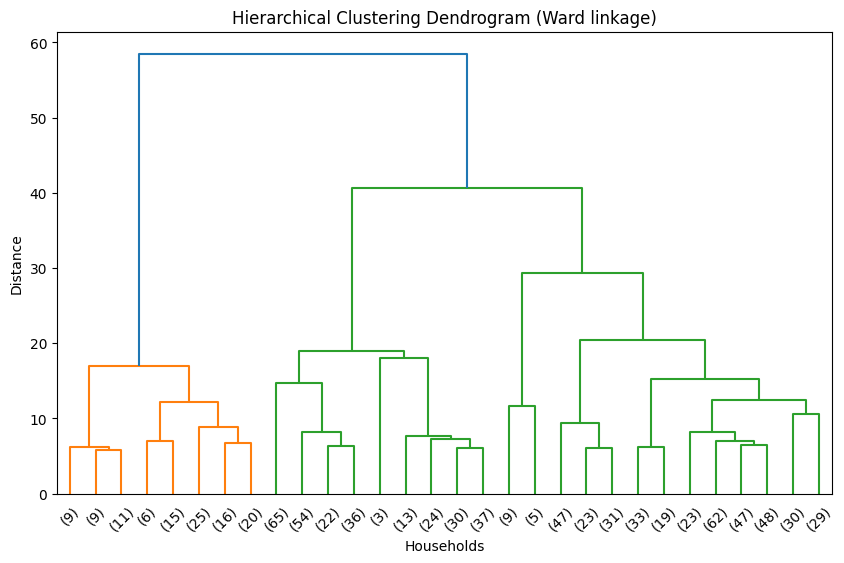

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Ward linkage.
product_hierarchical_ward = linkage(product_pca, method='ward')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_ward, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Ward linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical ward clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_ward_results' for comparison across different k.
product_hierarchical_ward_results = []

for k in k_range:
    hierarchical_ward = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels = hierarchical_ward.fit_predict(product_pca)

    product_hierarchical_ward_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_ward_results_df = pd.DataFrame(product_hierarchical_ward_results)
product_hierarchical_ward_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.449756,0.961759,353.275561
1,3,0.274033,1.317922,332.579756
2,4,0.292710,1.128149,301.244119
3,5,0.230941,1.311431,262.414768
4,6,0.242352,1.386231,239.589456
5,7,0.238739,1.226653,225.381443
6,8,0.222908,1.292972,215.811238
7,9,0.220549,1.320873,207.140565
8,10,0.229779,1.293343,201.327900


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_ward_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_ward_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_ward_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_ward_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_ward_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_ward_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.449756 at k = 2.0
Best Davies-Bouldin Index: 0.961759 at k = 2.0
Best Calinski-Harabasz Index: 353.275561 at k = 2.0


k=2 was selected for hierarchical ward clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.450
- it has the lowest Davies-Bouldin Index (DBI) of 0.962
- it has the highest Calinski-Harabasz Index (CHI) of 353.276

In [ ]:
# Create a copy of the dataset to add hierarchical ward cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_ward_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical ward clustering model using k=2
final_k = 2
hierarchical_ward_final = AgglomerativeClustering(n_clusters=final_k, linkage='ward')
cluster_labels = hierarchical_ward_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_ward_cluster_df.head(5)

Silhouette Score for k=2: 0.449756
Davies-Bouldin Index for k=2: 0.961759
Calinski-Harabasz Index for k=2: 353.275561


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,2
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_ward_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_ward_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_ward_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_ward_cluster_summary = pd.DataFrame(product_hierarchical_ward_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_ward_cluster_summary = product_hierarchical_ward_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_ward_cluster_summary['cluster'] = range(1, len(product_hierarchical_ward_cluster_summary)+1)

# Display the summary
product_hierarchical_ward_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,690,0.722357,0.277643,1.000000e-06,0.036515,0.000001,0.636341,0.109440,0.001235,0.072718,0.011385,0.096973,4.394677e-03
1,2,111,0.742811,0.257189,1.000000e-06,0.034749,0.000001,0.657492,0.127798,0.000713,0.059839,0.012642,0.070539,1.000000e-06


In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_hierarchical_ward_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_hierarchical_ward_cluster_df, cluster_col='cluster')

# Cluster differentiation results
product_hierarchical_ward_differentiation = product_hierarchical_ward_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_hierarchical_ward_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.002615,0.148025
inverse_private_proportion,0.002615,0.148025
inverse_alcohol_proportion,0.001183,0.099474
inverse_deli & bakery_proportion,0.001892,0.125855
inverse_entertainment & leisure_proportion,0.000720,0.077591
inverse_general_grocery_proportion,0.006081,0.226112
inverse_health_personal_care_proportion,0.018736,0.399437
inverse_home & lifestyle_proportion,0.008002,0.259621
inverse_meat_proportion,0.020557,0.418787


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Seafood proportion is the only variable that has a medium effect in differentiating household segments, it explains about 11% (medium eta-squared values of 0.1112) of the variance between household segments.

2. Health personal care, meat and produce proportions have small effects in differentiating household segments.

3. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have negligible effects in differentiating household segments.

4. Seafood proportion has large average group means difference across all pairwise cluster.

5. Other proportions (health personal care, meat, produce, national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) has small or negligible average group means difference across all pairwise cluster.


In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_ward_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    690         National             0.722357            0.277643 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.636341     0.109440     0.096973     0.072718     0.036515     0.011385     0.004395     0.001235 1.000000e-06  1.000000e-06
       2    111         National             0.742811            0.257189 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous A

All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 (more focused on fresh food) has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 2.
- Cluster 2 (more focused on general grocery and health/personal care) has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)



In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_ward_cluster_proportion = product_hierarchical_ward_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_ward_cluster_proportion)

cluster
1    0.861423
2    0.138577
Name: proportion, dtype: float64


The clusters are severely imbalanced.

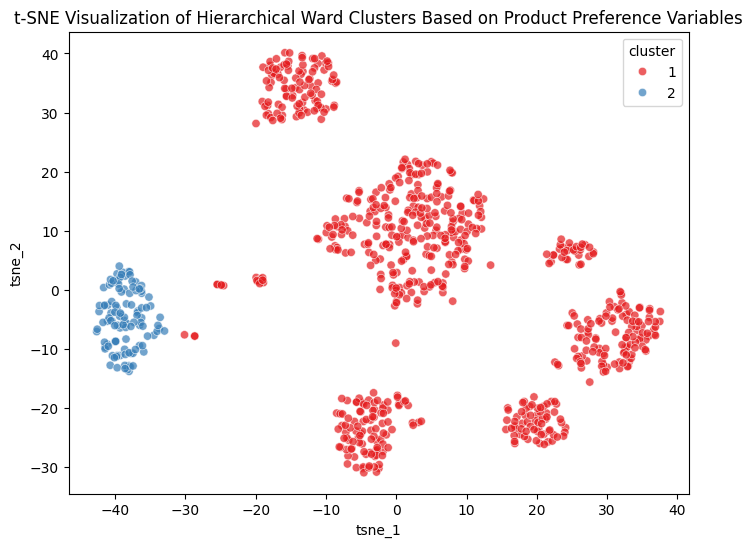

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_ward_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Ward Clusters Based on Product Preference Variables')
plt.show()

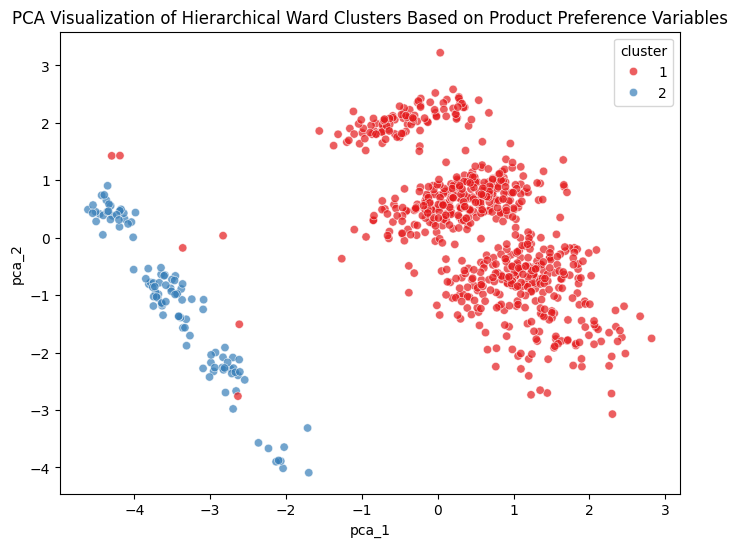

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_ward_cluster_df'
product_hierarchical_ward_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_ward_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_ward_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Ward Clusters Based on Product Preference Variables')
plt.show()

## Model 21: Hierarchical Clustering (Average Linkage)

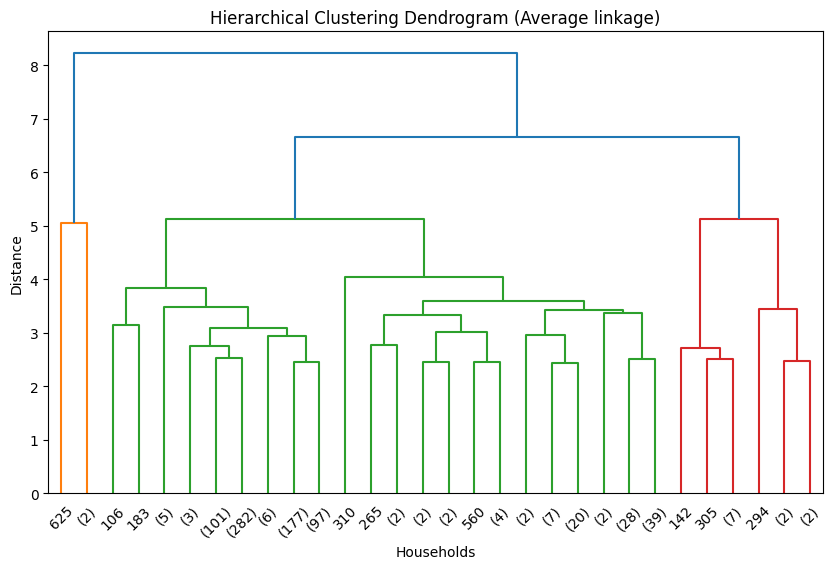

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Average linkage.
product_hierarchical_average = linkage(product_pca, method='average')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_average, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Average linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical average clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_average_results' for comparison across different k.
product_hierarchical_average_results = []

for k in k_range:
    hierarchical_average = AgglomerativeClustering(n_clusters=k, linkage='average')
    labels = hierarchical_average.fit_predict(product_pca)

    product_hierarchical_average_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_average_results_df = pd.DataFrame(product_hierarchical_average_results)
product_hierarchical_average_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.591296,0.642051,24.452350
1,3,0.509101,0.800242,47.888660
2,4,0.469845,0.680294,35.951749
3,5,0.472197,0.770010,148.893417
4,6,0.471345,0.657617,120.382247
5,7,0.441305,0.644794,101.127905
6,8,0.293976,0.735416,87.711892
7,9,0.280580,0.930480,79.945942
8,10,0.196403,0.961290,72.795598


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_average_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_average_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_average_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_average_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_average_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_average_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.591296 at k = 2.0
Best Davies-Bouldin Index: 0.642051 at k = 2.0
Best Calinski-Harabasz Index: 148.893417 at k = 5.0


k=2 was selected for hierarchical average clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.591
- it has the lowest Davies-Bouldin Index (DBI) of 0.642

In [ ]:
# Create a copy of the dataset to add hierarchical average cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_average_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical average clustering model using k=2
final_k = 2
hierarchical_average_final = AgglomerativeClustering(n_clusters=final_k, linkage='average')
cluster_labels = hierarchical_average_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_average_cluster_df.head(5)

Silhouette Score for k=2: 0.591296
Davies-Bouldin Index for k=2: 0.642051
Calinski-Harabasz Index for k=2: 24.452350


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_average_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_average_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_average_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_average_cluster_summary = pd.DataFrame(product_hierarchical_average_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_average_cluster_summary = product_hierarchical_average_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_average_cluster_summary['cluster'] = range(1, len(product_hierarchical_average_cluster_summary)+1)

# Display the summary
product_hierarchical_average_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,798,0.723999,0.276001,0.000001,0.036323,0.000001,0.637456,0.110220,0.001186,7.077359e-02,0.011581,0.093468,0.003683
1,2,3,0.694624,0.305376,0.000001,0.003135,0.000001,0.683869,0.228839,0.002151,1.000000e-06,0.010610,0.036559,0.002867


In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_hierarchical_average_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_hierarchical_average_cluster_df, cluster_col='cluster')

# Cluster differentiation results
product_hierarchical_average_differentiation = product_hierarchical_average_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_hierarchical_average_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.001480,0.629559
inverse_private_proportion,0.001480,0.629559
inverse_alcohol_proportion,0.000180,0.219090
inverse_deli & bakery_proportion,0.003303,0.941170
inverse_entertainment & leisure_proportion,0.000522,0.373589
inverse_general_grocery_proportion,0.000036,0.097495
inverse_health_personal_care_proportion,0.006412,1.313463
inverse_home & lifestyle_proportion,0.000107,0.169482
inverse_meat_proportion,0.015709,2.065601


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Meat proportion is the only variable that has a small effect in differentiating household segments, it explains about 2% (small eta-squared values of 0.0157) of the variance between household segments.

2. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle, health personal care, meat, produce and miscellaneous & services) have negligible effects in differentiating household segments.

3. Deli & bakery, health personal care and meat proportions have large average group means difference across all pairwise cluster.

4. Produce, national and private proportions have medium average group means difference across all pairwise cluster.

5. Other proportions (seafood, alcohol, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_average_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category             top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    798         National             0.723999            0.276001 General Grocery Health Personal Care        Produce                       Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.637456     0.110220     0.093468     0.070774     0.036323     0.011581     0.003683     0.001186     0.000001  1.000000e-06
       2      3         National             0.694624            0.305376 General Grocery Health Personal Care        Produce Miscellaneous And Serv

All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 has slightly higher spending on produce, meat, deli & bakery, miscellaneous & services, seafood and and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on general grocery, health/personal care, home & lifestyle and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. alcohol (0.0%)
3. entertainment & leisure. (0.0%)


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_average_cluster_proportion = product_hierarchical_average_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_average_cluster_proportion)

cluster
1    0.996255
2    0.003745
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

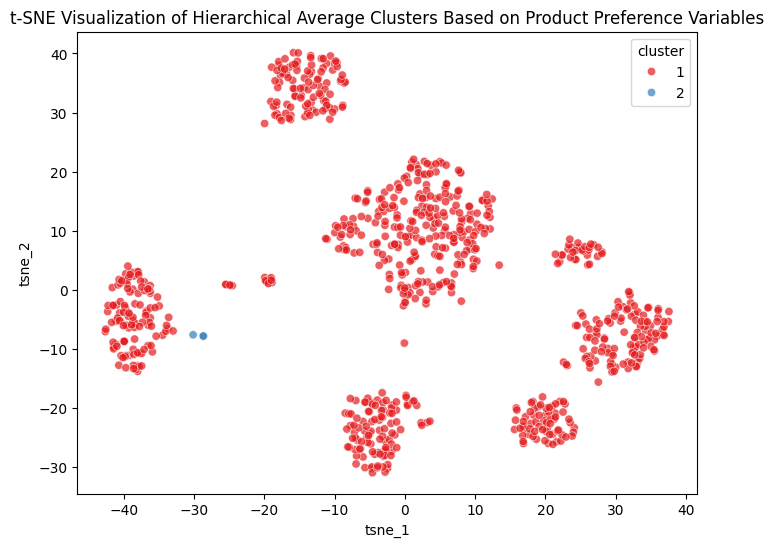

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_average_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Average Clusters Based on Product Preference Variables')
plt.show()

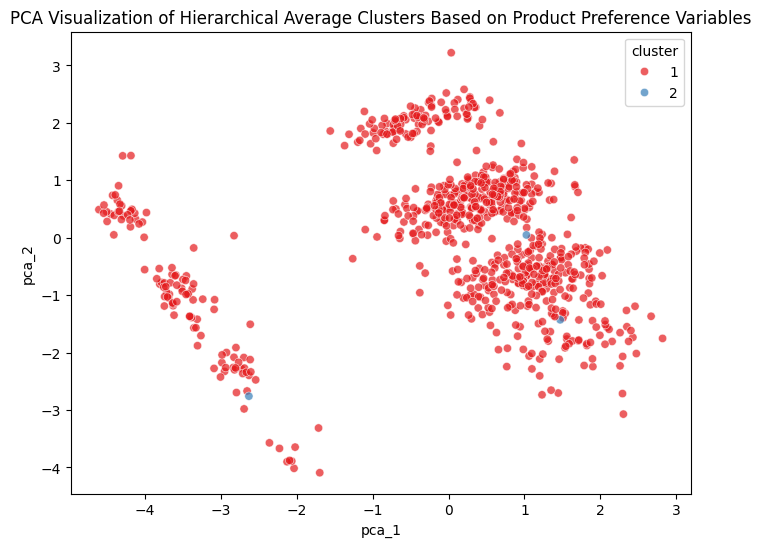

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_average_cluster_df'
product_hierarchical_average_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_average_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_average_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Average Clusters Based on Product Preference Variables')
plt.show()

## Model 22: Hierarchical Clustering (Complete Linkage)

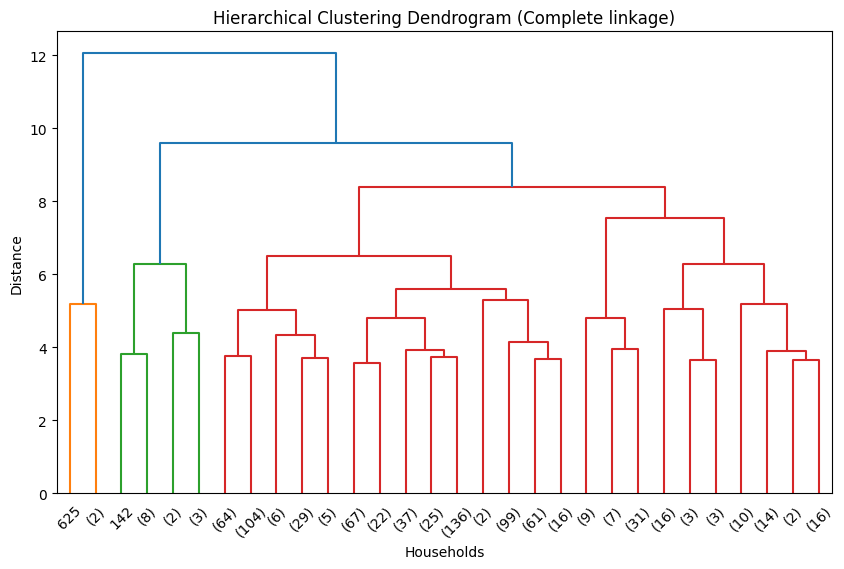

In [ ]:
# Useful link to determine optimal k in dendogram: https://statsandr.com/blog/clustering-analysis-k-means-and-hierarchical-clustering-by-hand-and-in-r/
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Perform hierarchical clustering using Complete linkage.
product_hierarchical_complete = linkage(product_pca, method='complete')

# Plot a truncated dendrogram showing the last 30 merged clusters
plt.figure(figsize=(10, 6))
dendrogram(product_hierarchical_complete, truncate_mode='lastp', p=30)
plt.title('Hierarchical Clustering Dendrogram (Complete linkage)')
plt.xlabel('Households')
plt.ylabel('Distance')
plt.show()

The dendrogram shows a clear visual separation at k=2

In [ ]:
# Perform hierarchical complete clustering for each value of in k_range, and
# store silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_hierarchical_complete_results' for comparison across different k.
product_hierarchical_complete_results = []

for k in k_range:
    hierarchical_complete = AgglomerativeClustering(n_clusters=k, linkage='complete')
    labels = hierarchical_complete.fit_predict(product_pca)

    product_hierarchical_complete_results.append({
        'k': k,
        'silhouette_score': silhouette_score(product_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(product_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(product_pca, labels)
    })

# Convert to DataFrame
product_hierarchical_complete_results_df = pd.DataFrame(product_hierarchical_complete_results)
product_hierarchical_complete_results_df.head(10)

,k,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,0.591296,0.642051,24.452350
1,3,0.509101,0.800242,47.888660
2,4,0.472465,0.808132,189.202872
3,5,0.412914,1.232947,152.434396
4,6,0.231566,1.371355,195.914340
5,7,0.234010,1.268969,171.211718
6,8,0.235198,1.265331,155.509758
7,9,0.138987,1.525762,153.926173
8,10,0.134981,1.454546,138.400370


In [ ]:
# Highest Silhouette Score
best_silhouette_idx = product_hierarchical_complete_results_df['silhouette_score'].idxmax()
best_silhouette = product_hierarchical_complete_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hierarchical_complete_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hierarchical_complete_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hierarchical_complete_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hierarchical_complete_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.591296 at k = 2.0
Best Davies-Bouldin Index: 0.642051 at k = 2.0
Best Calinski-Harabasz Index: 195.914340 at k = 6.0


k=2 was selected for hierarchical complete clustering based on the following:
- the dendrogram shows a clear visual separation at k=2
- it has the highest Silhouette score of 0.576
- it has the lowest Davies-Bouldin Index (DBI) of 0.642

In [ ]:
# Create a copy of the dataset to add hierarchical complete cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hierarchical_complete_cluster_df = household_profile_df.copy()

In [ ]:
# Use PCA for dimensionality reduction & handling of correlated varaibles before clustering to find clusters in the transformed PCA space.
# Assign clusters based on the PCA-transformed space.
# Interpret the clusters using the orginal features (all the proportion values)

# Apply PCA to reduce dimensions of product_array while retaining 90% of variance.
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Fit final hierarchical complete clustering model using k=2
final_k = 2
hierarchical_complete_final = AgglomerativeClustering(n_clusters=final_k, linkage='complete')
cluster_labels = hierarchical_complete_final.fit_predict(product_pca)

# Add cluster labels to the 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=2
sil_score = silhouette_score(product_pca, cluster_labels)
dbi_score = davies_bouldin_score(product_pca, cluster_labels)
chi_score = calinski_harabasz_score(product_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hierarchical_complete_cluster_df.head(5)

Silhouette Score for k=2: 0.591296
Davies-Bouldin Index for k=2: 0.642051
Calinski-Harabasz Index for k=2: 24.452350


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,1
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,1
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hierarchical_complete_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hierarchical_complete_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hierarchical_complete_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hierarchical_complete_cluster_summary = pd.DataFrame(product_hierarchical_complete_cluster_summary)

# Sort clusters by household count descending
product_hierarchical_complete_cluster_summary = product_hierarchical_complete_cluster_summary.sort_values('count', ascending=False).reset_index(drop=True)

# Reassign cluster numbers starting from 1
product_hierarchical_complete_cluster_summary['cluster'] = range(1, len(product_hierarchical_complete_cluster_summary)+1)

# Display the summary
product_hierarchical_complete_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,798,0.723999,0.276001,0.000001,0.036323,0.000001,0.637456,0.110220,0.001186,7.077359e-02,0.011581,0.093468,0.003683
1,2,3,0.694624,0.305376,0.000001,0.003135,0.000001,0.683869,0.228839,0.002151,1.000000e-06,0.010610,0.036559,0.002867


In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_hierarchical_complete_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_hierarchical_complete_cluster_df, cluster_col='cluster')

# Cluster differentiation results
product_hierarchical_complete_differentiation = product_hierarchical_complete_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_hierarchical_complete_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.001480,0.629559
inverse_private_proportion,0.001480,0.629559
inverse_alcohol_proportion,0.000180,0.219090
inverse_deli & bakery_proportion,0.003303,0.941170
inverse_entertainment & leisure_proportion,0.000522,0.373589
inverse_general_grocery_proportion,0.000036,0.097495
inverse_health_personal_care_proportion,0.006412,1.313463
inverse_home & lifestyle_proportion,0.000107,0.169482
inverse_meat_proportion,0.015709,2.065601


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

1. Meat proportion is the only variable that has a small effect in differentiating household segments, it explains about 2% (small eta-squared values of 0.0157) of the variance between household segments.

2. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle, health personal care, meat, produce and miscellaneous & services) have negligible effects in differentiating household segments.

3. Deli & bakery, health personal care and meat proportions have large average group means difference across all pairwise cluster.

4. Produce, national and private proportions have medium average group means difference across all pairwise cluster.

5. Other proportions (seafood, alcohol, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hierarchical_complete_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category             top_4_category  top_5_category             top_6_category     top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       1    798         National             0.723999            0.276001 General Grocery Health Personal Care        Produce                       Meat Deli And Bakery Miscellaneous And Services            Seafood        Home And Lifestyle        Alcohol Entertainment And Leisure     0.637456     0.110220     0.093468     0.070774     0.036323     0.011581     0.003683     0.001186     0.000001  1.000000e-06
       2      3         National             0.694624            0.305376 General Grocery Health Personal Care        Produce Miscellaneous And Serv

All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 has slightly higher spending on produce, meat, deli & bakery, miscellaneous & services, seafood and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on general grocery, health/personal care, home & lifestyle and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. alcohol (0.0%)
3. entertainment & leisure. (0.0%).


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hierarchical_complete_cluster_proportion = product_hierarchical_complete_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hierarchical_complete_cluster_proportion)

cluster
1    0.996255
2    0.003745
Name: proportion, dtype: float64


The clusters are extremely imbalanced.

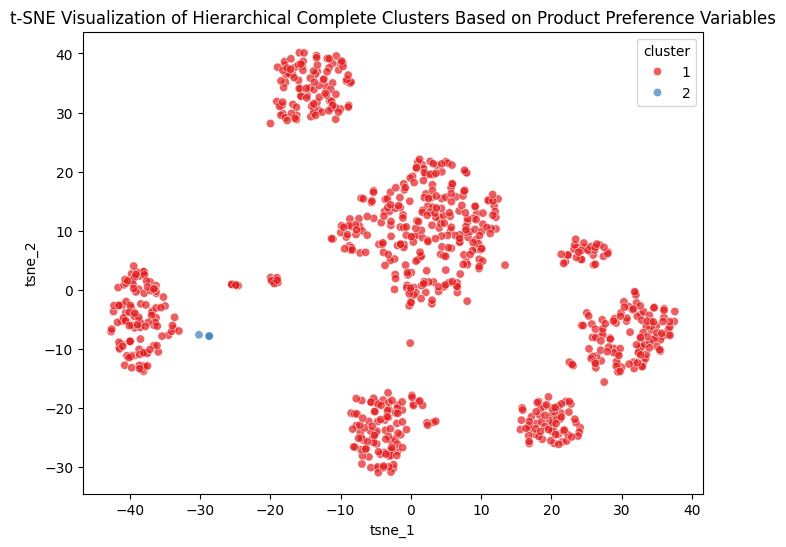

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hierarchical_complete_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of Hierarchical Complete Clusters Based on Product Preference Variables')
plt.show()

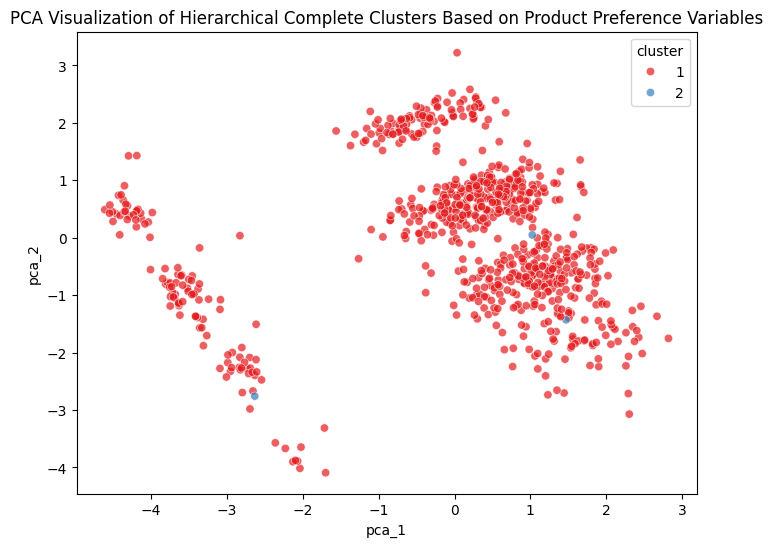

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_hierarchical_complete_cluster_df'
product_hierarchical_complete_cluster_df['pca_1'] = pca_results[:, 0]
product_hierarchical_complete_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hierarchical_complete_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of Hierarchical Complete Clusters Based on Product Preference Variables')
plt.show()

## Model 23: DBSCAN

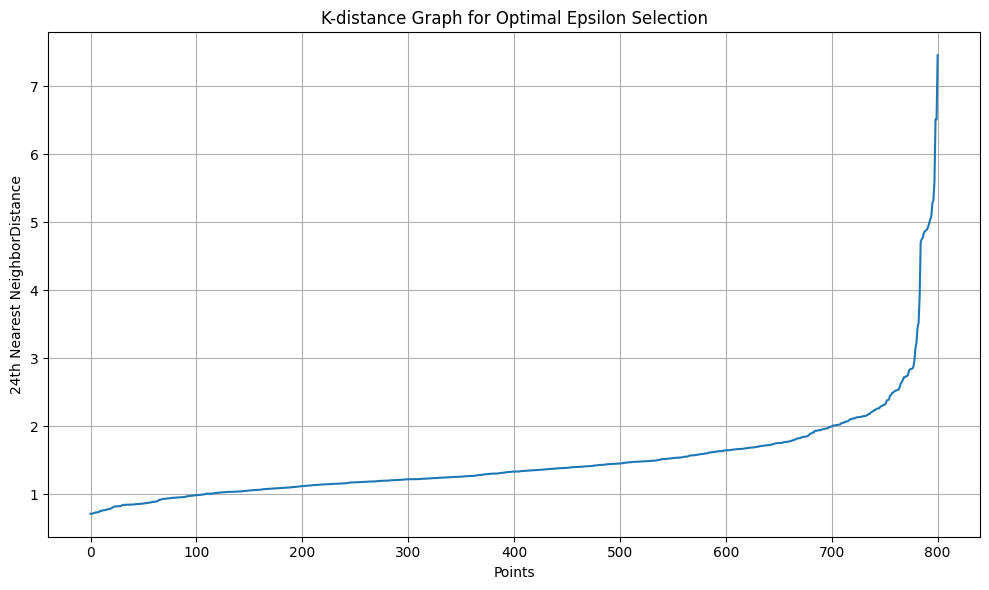

In [ ]:
# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Rule of thumb: n_neighbors / min_samples ≈ 2 × number of dimensions (variables).
# We have 12 variables ('national_proportion', 'private_proportion', 'alcohol_proportion', 'deli & bakery_proportion',
# 'entertainment & leisure_proportion', 'general_grocery_proportion', 'health_personal_care_proportion', '
# home & lifestyle_proportion', 'meat_proportion', 'miscellaneous & services_proportion', 'produce_proportion'
# and'seafood_proportion' variables, so n_neighbors / min_samples = 24.

# Calculate distances to the 24 nearest neighbors for each point.
# The distance to the 24th nearest neighbor is used to create a k-distance plot,
# which helps estimate a good epsilon (eps) parameter for DBSCAN.
k = 24
product_neighbors = NearestNeighbors(n_neighbors=k).fit(product_pca)
distances, indices = product_neighbors.kneighbors(product_pca)

# Sort distances to find elbow point
distances = np.sort(distances[:, k-1], axis=0)

# Plot k-distance graph to find elbow point
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points')
plt.ylabel(f'{k}th Nearest NeighborDistance')
plt.title('K-distance Graph for Optimal Epsilon Selection')
plt.grid(True)
plt.tight_layout()
plt.show()

Based on the k-distance graph above, we choose an epsilon of 3.0.

In [ ]:
# For DBSCAN, epsilon (eps) is the radius of the circle to be created around each data point to check its density.
# Epsilon controls distance.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a point for that point to be considered as a core point.
# minPts controls density.

# Core points: Points that have at least min_samples neighbors (including itself) within eps distance.
# Border points: Points within eps distance of a core point, but don't have min_samples neighbors themselves.
# Noise points: Points that are not core points and are not within eps of any core point.

# Define parameter ranges for DBSCAN
eps_range = [1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8]
min_samples_range = [23, 24, 25]

# Store DBCV, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'product_dbscan_results'
# for comparison across different eps range and minimum samples range.
product_dbscan_results = []

for eps in eps_range:
    for min_samples in min_samples_range:
        # Perform DBSCAN clustering on 'product_pca'
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(product_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = product_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
            }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(product_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for eps={eps}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        product_dbscan_results.append(result)

# Convert to DataFrame
product_dbscan_results_df = pd.DataFrame(product_dbscan_results)
product_dbscan_results_df

,eps,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,1.6,23,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
1,1.6,24,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
2,1.6,25,2,108,0.134831,0.661258,0.459280,0.690409,124.241448
3,1.8,23,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
4,1.8,24,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
5,1.8,25,2,53,0.066167,0.678827,0.481994,0.813488,361.926527
6,2.0,23,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
7,2.0,24,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
8,2.0,25,2,28,0.034956,0.681737,0.475503,0.890242,412.984914
9,2.2,23,2,23,0.028714,0.677598,0.474676,0.902137,421.644168


In [ ]:
# Highest DBCV Score
best_dbcv_idx = product_dbscan_results_df['dbcv_score'].idxmax()
best_dbcv = product_dbscan_results_df.loc[best_dbcv_idx, ['eps', 'min_samples', 'dbcv_score']]

# Highest Silhouette Score
best_silhouette_idx = product_dbscan_results_df['silhouette_score'].idxmax()
best_silhouette = product_dbscan_results_df.loc[best_silhouette_idx, ['eps', 'min_samples', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_dbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_dbscan_results_df.loc[best_dbi_idx, ['eps', 'min_samples', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx = product_dbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_dbscan_results_df.loc[best_chi_idx, ['eps', 'min_samples', 'calinski_harabasz_index']]

# Print results
print(f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} at eps = {best_dbcv['eps']}, min_samples = {best_dbcv['min_samples']}")
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at eps = {best_silhouette['eps']}, min_samples = {best_silhouette['min_samples']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at eps = {best_dbi['eps']}, min_samples = {best_dbi['min_samples']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at eps = {best_chi['eps']}, min_samples = {best_chi['min_samples']}")

Best DBCV Score: 0.681737 at eps = 2.0, min_samples = 23.0
Best Silhouette Score: 0.481994 at eps = 1.8, min_samples = 23.0
Best Davies-Bouldin Index: 0.690409 at eps = 1.6, min_samples = 23.0
Best Calinski-Harabasz Index: 427.630791 at eps = 2.6, min_samples = 23.0


We tested with different epsilon values (1.6, 1.8, 2.0, 2.2, 2.4, 2.6 & 2.8) and minimum samples values (23, 24 & 25).

eps_range = [1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8]
min_samples_range = [23, 24, 25]


eps=2.0 and min_sample = 23 were selected for DBSCAN clustering based on its internal validation metric:
- Low noise ratio of 0.035
- High DBCV score of 0.681
- High Silhouette score of 0.476
- Low Davies-Bouldin index of 0.890
- High Calinski-Harabasz index  of 412.985

In [ ]:
# Create a copy of the dataset to add DBSCAN cluster labels based on product variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_dbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final DBSCAN model using best DBSCAN parameters (from tuning)
best_eps = 2.0
best_min_samples = 23
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_min_samples)
cluster_labels = dbscan_final.fit_predict(product_pca)

# Add cluster labels to the 'product_dbscan_cluster_df'
product_dbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_eps = 0.4 and best_min_samples = 7
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = product_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(product_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for eps={best_eps} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for eps={best_eps} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for eps={best_eps} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for eps={best_eps} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for eps={best_eps} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for eps={best_eps} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_dbscan_cluster_df.head(5)

Number of clusters for eps=2.0 & min_samples=23: 2
Number of noise for eps=2.0 & min_samples=23: 28
Noise ratio for eps=2.0 & min_samples=23: 0.034956
DBCV Score for eps=2.0 & min_samples=23: 0.681737
Silhouette Score for eps=2.0 & min_samples=23: 0.475503
Davies-Bouldin Index for eps=2.0 & min_samples=23: 0.890242
Calinski-Harabasz Index for eps=2.0 & min_samples=23: 412.984914


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_dbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_dbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_dbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_dbscan_cluster_summary = pd.DataFrame(product_dbscan_cluster_summary)

# Display the summary
product_dbscan_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,0,28,0.732282,0.267718,1.000000e-06,0.036916,1.000000e-06,0.612624,0.131983,0.000809,0.059927,0.000713,0.068223,1.000000e-06
1,1,101,0.734635,0.265365,1.000000e-06,0.034749,1.000000e-06,0.658944,0.124563,0.000679,0.061795,0.012642,0.070539,1.000000e-06
2,2,672,0.722357,0.277643,1.000000e-06,0.036323,1.000000e-06,0.636607,0.109001,0.001247,0.072718,0.011707,0.097217,4.413803e-03


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_dbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_dbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
product_dbscan_differentiation = product_dbscan_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_dbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.002563,0.150215
inverse_private_proportion,0.002563,0.150215
inverse_alcohol_proportion,0.002453,0.146931
inverse_deli & bakery_proportion,0.001256,0.105096
inverse_entertainment & leisure_proportion,0.000863,0.087072
inverse_general_grocery_proportion,0.009047,0.283131
inverse_health_personal_care_proportion,0.012801,0.337435
inverse_home & lifestyle_proportion,0.008672,0.277152
inverse_meat_proportion,0.013347,0.344656


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For DBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Seafood proportion is the only variable that has a medium effect in differentiating household segments, it explains about 11% (medium eta-squared values of 0.1070) of the variance between household segments.

2. Health personal care, meat and produce proportions have small effects in differentiating household segments.

3. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have negligible effects in differentiating household segments.

4. Seafood proportion has large average group means difference across all pairwise cluster.

5. Other proportions (health personal care, meat, produce, national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) has small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_dbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category             top_7_category            top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       0     28         National             0.732282            0.267718 General Grocery Health Personal Care        Produce           Meat Deli And Bakery         Home And Lifestyle Miscellaneous And Services                   Seafood        Alcohol Entertainment And Leisure     0.612624     0.131983     0.068223     0.059927     0.036916     0.000809     0.000713     0.000001 1.000000e-06  1.000000e-06
       1    101         National             0.734635            0.265365 General Grocery Health Personal Care        Produce           Meat Deli And Bakery

All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)

In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_dbscan_cluster_proportion = product_dbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_dbscan_cluster_proportion)

cluster
0    0.034956
1    0.126092
2    0.838951
Name: proportion, dtype: float64


The clusters are severely imbalanced.

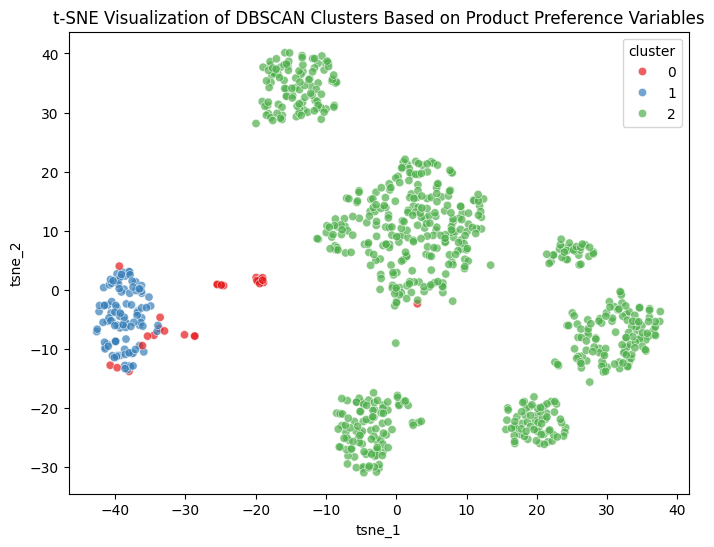

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_dbscan_cluster_df'
product_dbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
product_dbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of DBSCAN Clusters Based on Product Preference Variables')
plt.show()

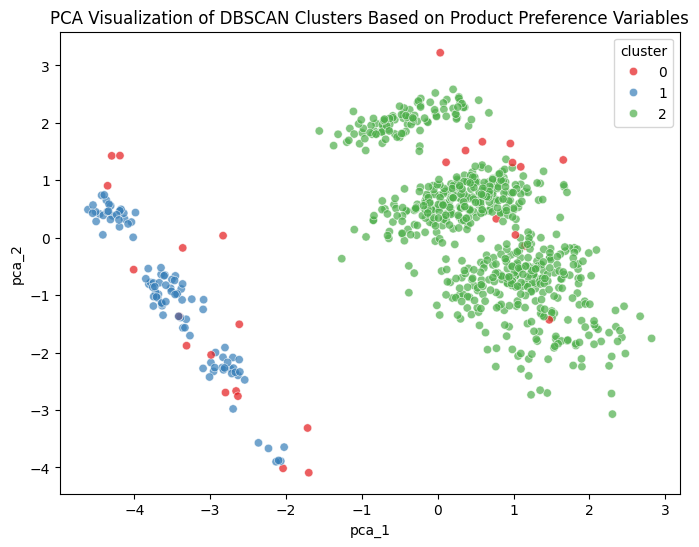

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_dbscan_df'
product_dbscan_cluster_df['pca_1'] = pca_results[:, 0]
product_dbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_dbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of DBSCAN Clusters Based on Product Preference Variables')
plt.show()

## Model 24: HDBSCAN

In [ ]:
# For HDBSCAN, min_cluster_size is the minimum number of points requried to form a cluster.
# HDBSCAN will not create clusters smaller than this size, any smllar groups will be considered as noise.

# For DBSCAN, min_samples is the minimum number of points required to form a dense region.
# It is the minimum number of points that must be within the eps radius of a data point for that data point to be considered as a core point.
# minPts controls density.

# Suppress future warning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

# Apply PCA to reduce dimensions of product_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
product_pca = pca.fit_transform(product_array)

# Define parameter ranges for HDBSCAN
min_cluster_size_range = [5, 10, 20, 30, 50, 75, 100]
min_samples_range = [1, 5, 10, 15, 20]

# Store results
product_hdbscan_results = []

for min_cluster_size in min_cluster_size_range:
    for min_samples in min_samples_range:
        # Perform HDBSCAN clustering
        product_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric='euclidean',
            cluster_selection_method='eom'
        )
        labels = product_hdbscan.fit_predict(product_pca)

        # Count number of clusters (excluding noise points labeled as -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)


        # Only calculate metrics if we have at least 2 clusters and not all points are noise
        if n_clusters >= 2 and n_noise < len(labels):
            # Filter out noise points for metrics that don't handle -1 labels
            mask = labels != -1
            filtered_data = product_pca[mask]
            filtered_labels = labels[mask]

            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels)
        }

            # Calculate DBCV (handles noise points naturally)
            try:
                result['dbcv_score'] = dbcv.dbcv(product_pca, labels)
            except ImportError:
                print("DBCV package not installed.")
                result['dbcv_score'] = None
            except Exception as e:
                print(f"DBCV calculation error for min_cluster_size={min_cluster_size}, min_samples={min_samples}: {e}")
                result['dbcv_score'] = None

            # Calculate other metrics (only on non-noise points)
            if len(set(filtered_labels)) >= 2:
                result['silhouette_score'] = silhouette_score(filtered_data, filtered_labels)
                result['davies_bouldin_index'] = davies_bouldin_score(filtered_data, filtered_labels)
                result['calinski_harabasz_index'] = calinski_harabasz_score(filtered_data, filtered_labels)
            else:
                result['silhouette_score'] = None
                result['davies_bouldin_index'] = None
                result['calinski_harabasz_index'] = None
        else:
            # If clustering failed, record parameters but set metrics to None
            result = {
                'min_cluster_size': min_cluster_size,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'noise_ratio': n_noise / len(labels),
                'dbcv_score': None,
                'silhouette_score': None,
                'davies_bouldin_index': None,
                'calinski_harabasz_index': None
            }

        product_hdbscan_results.append(result)

# Convert to DataFrame
product_hdbscan_results_df = pd.DataFrame(product_hdbscan_results)
product_hdbscan_results_df

,min_cluster_size,min_samples,n_clusters,n_noise,noise_ratio,dbcv_score,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,5,1,8,23,0.028714,0.662253,0.399359,1.088417,86.107007
1,5,5,3,10,0.012484,0.688068,0.473819,0.836348,252.963367
2,5,10,2,21,0.026217,0.677225,0.474625,0.914251,427.205410
3,5,15,2,27,0.033708,0.682574,0.475207,0.894011,414.760753
4,5,20,2,32,0.039950,0.678388,0.475351,0.879905,401.816001
5,10,1,3,3,0.003745,0.679590,0.472538,0.885797,264.398081
6,10,5,3,10,0.012484,0.688068,0.473819,0.836348,252.963367
7,10,10,2,21,0.026217,0.677225,0.474625,0.914251,427.205410
8,10,15,2,27,0.033708,0.682574,0.475207,0.894011,414.760753
9,10,20,2,32,0.039950,0.678388,0.475351,0.879905,401.816001


**Different min_cluster_size values (5, 10, 15, 20) when paired with the same min_samples have identical validation results.**
<br>
The validation metrics show identical results for different min_cluster_size values (5, 10, 15) when paired with the same min_samples values because the clusters formed by HDBSCAN are large enough (with many data points) to satisfy all these min_cluster_size thresholds. As a result, changing min_cluster_size within this range does not affect the clustering structure and validation results.

If a potential cluster does not satisfy the min_cluster_size requirement, HDBSCAN labels those points as noise (labeled as -1) rather than forming clusters, which affects the validation results by excluding these points from the validation calculations.
<br>
<br>

**min_samples values increases, the n_noise (number of noises) increases.**
<br>
We also noticed that when min_samples values increases, the n_noise (number of noises) increases.
- Low min_samples: Lenient clustering, more core points, less noise, but might include outliers in the clusters.
- High min_samples: Tight clusterring, less core points, more noise, but less outliers in the clusters (more robust).


For example: imagine a data point with 5 neighbors
- If min_samples = 3, this data point is a core point because it has 5 neighbors, which exceeds the requirement of 3.
- If min_samples = 8, this data point is not a core point because it has only 5 neighbors, which is less than the requirement of 8
- With higher min_samples, there are fewer core points, clusters become smaller, and more points fail to be reachable from any core point. These points are then labeled as noise.

In [ ]:
# Highest DBCV Score
best_dbcv_idx = product_hdbscan_results_df['dbcv_score'].idxmax()
best_dbcv = product_hdbscan_results_df.loc[
    best_dbcv_idx,
    ['min_cluster_size', 'min_samples', 'dbcv_score']
]

# Highest Silhouette Score
best_silhouette_idx = product_hdbscan_results_df['silhouette_score'].idxmax()
best_silhouette = product_hdbscan_results_df.loc[
    best_silhouette_idx,
    ['min_cluster_size', 'min_samples', 'silhouette_score']
]

# Lowest Davies-Bouldin Index
best_dbi_idx = product_hdbscan_results_df['davies_bouldin_index'].idxmin()
best_dbi = product_hdbscan_results_df.loc[
    best_dbi_idx,
    ['min_cluster_size', 'min_samples', 'davies_bouldin_index']
]

# Highest Calinski-Harabasz Index
best_chi_idx = product_hdbscan_results_df['calinski_harabasz_index'].idxmax()
best_chi = product_hdbscan_results_df.loc[
    best_chi_idx,
    ['min_cluster_size', 'min_samples', 'calinski_harabasz_index']
]

# Print results
print(
    f"Best DBCV Score: {best_dbcv['dbcv_score']:.6f} "
    f"at min_cluster_size = {best_dbcv['min_cluster_size']}, "
    f"min_samples = {best_dbcv['min_samples']}"
)

print(
    f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} "
    f"at min_cluster_size = {best_silhouette['min_cluster_size']}, "
    f"min_samples = {best_silhouette['min_samples']}"
)

print(
    f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} "
    f"at min_cluster_size = {best_dbi['min_cluster_size']}, "
    f"min_samples = {best_dbi['min_samples']}"
)

print(
    f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} "
    f"at min_cluster_size = {best_chi['min_cluster_size']}, "
    f"min_samples = {best_chi['min_samples']}"
)

Best DBCV Score: 0.688068 at min_cluster_size = 5.0, min_samples = 5.0
Best Silhouette Score: 0.475351 at min_cluster_size = 5.0, min_samples = 20.0
Best Davies-Bouldin Index: 0.836348 at min_cluster_size = 5.0, min_samples = 5.0
Best Calinski-Harabasz Index: 429.879496 at min_cluster_size = 50.0, min_samples = 1.0


min_cluster_size = 5.0, min_samples = 10.0 were selected for HDBSCAN clustering because they offer the best balance between cluster separation and noise ratio:
- Number of clusters equal 2 (It is simple for interpretation for product preference variables.)
- Low noise ratio equal to 0.0262
- Highest DBCV score at 0.677
- Moderate Silhouette score of 0.475 and Davies-Bouldin index of 0.914.
- Second highest Calinski-Harabasz index of 427.205.

In [ ]:
# Create a copy of the dataset to add HDBSCAN cluster labels based on product preference variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
product_hdbscan_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final HDBSCAN model using best HDBSCAN parameters (from tuning)
best_min_cluster_size = 5
best_min_samples = 10
hdbscan_final = hdbscan.HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean',
    cluster_selection_method='eom'
)

cluster_labels = hdbscan_final.fit_predict(product_pca)

# Add cluster labels to the dataframe
product_hdbscan_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for best_min_cluster_size = 5 and best_min_samples = 20
# Remove noise points (-1) for silhouette, DBI, CHI calculations
mask = cluster_labels != -1
filtered_labels = cluster_labels[mask]
filtered_data = product_pca[mask]

sil_score = silhouette_score(filtered_data, filtered_labels)
dbi_score = davies_bouldin_score(filtered_data, filtered_labels)
chi_score = calinski_harabasz_score(filtered_data, filtered_labels)

# Calculate DBCV score only if there are at least 2 clusters, otherwise set it to None
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

if n_clusters >= 2:
    dbcv_score = dbcv.dbcv(product_pca, cluster_labels)
else:
    dbcv_score = None

# Print results
print(f"Number of clusters for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
print(f"Number of noise for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum()}")
print(f"Noise ratio for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {(cluster_labels == -1).sum() / len(cluster_labels):.6f}")
print(f"DBCV Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbcv_score:.6f}")
print(f"Silhouette Score for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for min_cluster_size={best_min_cluster_size} & min_samples={best_min_samples}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
product_hdbscan_cluster_df.head(5)

Number of clusters for min_cluster_size=5 & min_samples=10: 2
Number of noise for min_cluster_size=5 & min_samples=10: 21
Noise ratio for min_cluster_size=5 & min_samples=10: 0.026217
DBCV Score for min_cluster_size=5 & min_samples=10: 0.677225
Silhouette Score for min_cluster_size=5 & min_samples=10: 0.474625
Davies-Bouldin Index for min_cluster_size=5 & min_samples=10: 0.914251
Calinski-Harabasz Index for min_cluster_size=5 & min_samples=10: 427.205410


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,1
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,2
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,2
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest for clustering based on product variables
product_cols_of_interest = [
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Initialize an empty list to store cluster summaries
product_hdbscan_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in product_hdbscan_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    # Get median for each numerical/proportional variable
    for col in product_cols_of_interest:
        median_val = cluster_df[col].median()
        cluster_summary[f'{col}_median'] = median_val

    product_hdbscan_cluster_summary.append(cluster_summary)

# Convert to DataFrame
product_hdbscan_cluster_summary = pd.DataFrame(product_hdbscan_cluster_summary)

# Display the summary
product_hdbscan_cluster_summary

,cluster,count,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,0,21,0.730241,0.269759,1.000000e-06,0.037135,1.000000e-06,0.612715,0.131498,0.000001,0.064935,0.000001,0.066985,2.607557e-03
1,1,108,0.740971,0.259029,1.000000e-06,0.034837,1.000000e-06,0.657524,0.127044,0.000700,0.060761,0.012560,0.070668,1.000000e-06
2,2,672,0.722357,0.277643,1.000000e-06,0.036323,1.000000e-06,0.636607,0.109001,0.001247,0.072718,0.011707,0.097217,4.413803e-03


Note: Cluser 0 is noise.

In [ ]:
# Calculate eta-squared and average Cohen’s d for product preference variables
product_hdbscan_numerical_analyzer = NumericalClusterDifferentiationAnalyzer(df=product_hdbscan_cluster_df, cluster_col='cluster', noise_cluster=0)

# Cluster differentiation results
product_hdbscan_differentiation = product_hdbscan_numerical_analyzer.compare_all_features(product_cols_of_interest)
product_hdbscan_differentiation

,eta_squared,avg_cohens_d
variable,,
inverse_national_proportion,0.002870,0.155147
inverse_private_proportion,0.002870,0.155147
inverse_alcohol_proportion,0.001079,0.095055
inverse_deli & bakery_proportion,0.002760,0.152131
inverse_entertainment & leisure_proportion,0.000671,0.074951
inverse_general_grocery_proportion,0.006772,0.238770
inverse_health_personal_care_proportion,0.016786,0.377827
inverse_home & lifestyle_proportion,0.008369,0.265652
inverse_meat_proportion,0.018261,0.394367


Rules for interpreting values for Eta squared:
1. Less than 0.01: Negligible effect size
2. 0.01 - 0.05: Small effect size
3. 0.06 - 0.13: Medium effect size
4. higher than or equal to 0.14: Large effect size

(Link: https://www.statology.org/eta-squared/ )
<br>
<br>

Rule for interpreting average Cohen's d across all cluster pairs:
1. |d| < 0.2: negligible  
2. 0.2 ≤ |d| < 0.5: small  
3. 0.5 ≤ |d| < 0.8: medium  
4. |d| ≥ 0.8: large

(Link: https://rpsychologist.com/cohend/)
<br>
<br>

For HDBSCAN, we have excluded the noise cluster (cluster 0) when calculating eta-squared value because this metric measures how well the clustering separates meaningful groups, not how well it handles outliers.
1. Seafood proportion is the only variable that has a medium effect in differentiating household segments, it explains about 11% (medium eta-squared values of 0.1126) of the variance between household segments.

2. Health personal care, meat and produce proportions have small effects in differentiating household segments.

3. Other proportions (national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) have negligible effects in differentiating household segments.

4. Seafood proportion has large average group means difference across all pairwise cluster.

5. Other proportions (health personal care, meat, produce, national, private, alcohol, deli & bakery, entertainment & leisure, general grocery, home & lifestyle and miscellaneous & services) has small or negligible average group means difference across all pairwise cluster.

In [ ]:
# List of product category columns (excluding brand)
product_category_cols = [
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Loop through the cluster summary dataframe
cluster_insights = []

for _, row in product_hdbscan_cluster_summary.iterrows():
    cluster = int(row['cluster'])
    count = int(row['count'])

    national = row['inverse_national_proportion_median']
    private = row['inverse_private_proportion_median']
    brand_pref = 'National' if national > private else 'Private'

    # Get all 10 product categories medians
    category_medians = {
        col: row[f'{col}_median']
        for col in product_category_cols
    }

    # Sort descending (keeps zero values at bottom)
    sorted_categories = sorted(
        category_medians.items(),
        key=lambda x: x[1],
        reverse=True
    )

    # Clean category names
    clean_names = [
        col.replace('inverse_', '')
           .replace('_proportion', '')
           .replace('&', 'and')
           .replace('_', ' ')
           .title()
        for col, _ in sorted_categories
    ]

    values = [val for _, val in sorted_categories]

    # Store insights
    cluster_insights.append({
        'cluster': cluster,
        'count': count,
        'brand_preference': brand_pref,
        'national_proportion': national,
        'private_proportion': private,
        **{f'top_{i+1}_category': name for i, name in enumerate(clean_names)},
        **{f'top_{i+1}_value': val for i, val in enumerate(values)}
    })

# Convert to DataFrame
cluster_insights_df = pd.DataFrame(cluster_insights)

# Display cluster insights table
print("=== CLUSTER INSIGHTS ===\n")
print(cluster_insights_df.to_string(index=False))

# Display cluster profiles
print("\n=== DETAILED CLUSTER PROFILES ===\n")

for _, row in cluster_insights_df.iterrows():
    print(f"Cluster {int(row['cluster'])} ({int(row['count'])} households)")
    print(
        f"  Brand Preference: {row['brand_preference']} "
        f"({row['national_proportion']:.1%} National, "
        f"{row['private_proportion']:.1%} Private)"
    )

    print("  Product Category Breakdown:")

    for i in range(1, 11):
        category = row[f'top_{i}_category']
        value = row[f'top_{i}_value']
        print(f"    {i}. {category}: {value:.1%}")

    print()

=== CLUSTER INSIGHTS ===

 cluster  count brand_preference  national_proportion  private_proportion  top_1_category       top_2_category top_3_category top_4_category  top_5_category             top_6_category     top_7_category             top_8_category top_9_category           top_10_category  top_1_value  top_2_value  top_3_value  top_4_value  top_5_value  top_6_value  top_7_value  top_8_value  top_9_value  top_10_value
       0     21         National             0.730241            0.269759 General Grocery Health Personal Care        Produce           Meat Deli And Bakery                    Seafood Home And Lifestyle Miscellaneous And Services        Alcohol Entertainment And Leisure     0.612715     0.131498     0.066985     0.064935     0.037135     0.002608     0.000001     0.000001 1.000000e-06  1.000000e-06
       1    108         National             0.740971            0.259029 General Grocery Health Personal Care        Produce           Meat Deli And Bakery Miscellaneous

All product preference variables show no significant differences between clusters with only small percentage differences and therefore contribute minimally to cluster separation, indicating that the 2 clusters have similar overall shopping patterns.

Based on the cluster profiles:
- Cluster 1 has slightly higher spending on general grocery, health/personal care, miscellaneous & services and national brand compared to cluster 2.
- Cluster 2 has slightly higher spending on produce, meat, deli & bakery, seafood and private brand compared to cluster 1.
- Both clusters share:
1. a preference for National brands over Private brands
2. home & lifestyle (0.1%)
3. alcohol (0.0%)
4. entertainment & leisure. (0.0%)


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
product_hdbscan_cluster_proportion = product_hdbscan_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(product_hdbscan_cluster_proportion)

cluster
0    0.026217
1    0.134831
2    0.838951
Name: proportion, dtype: float64


The clusters are severely imbalanced.

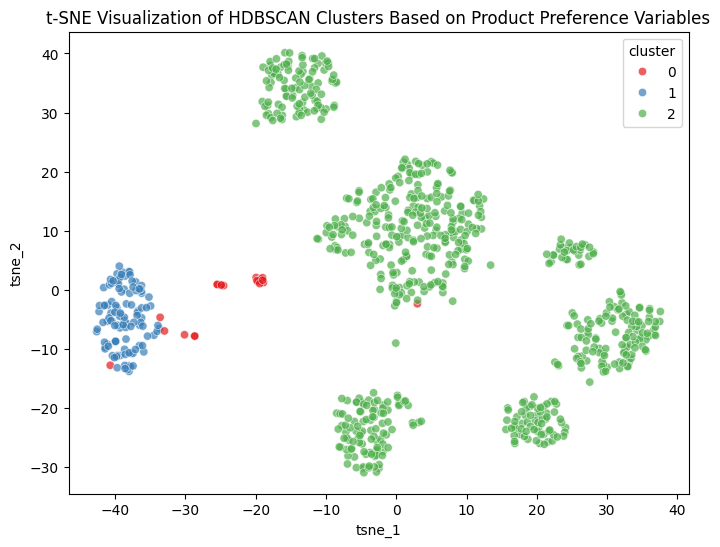

In [ ]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_results = tsne.fit_transform(product_pca)

# Add t-SNE results to 'product_hdbscan_cluster_df'
product_hdbscan_cluster_df['tsne_1'] = tsne_results[:, 0]
product_hdbscan_cluster_df['tsne_2'] = tsne_results[:, 1]

# Plot clusters
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='tsne_1', y='tsne_2',
    hue='cluster',
    palette='Set1',
    data=product_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('t-SNE Visualization of HDBSCAN Clusters Based on Product Preference Variables')
plt.show()

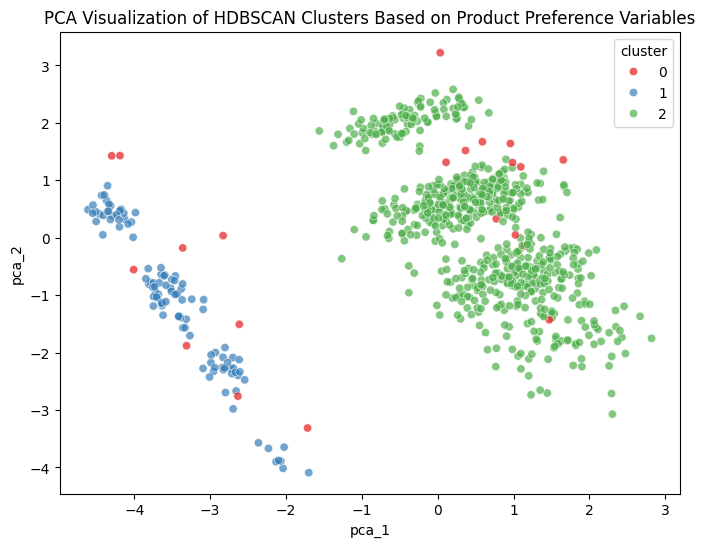

In [ ]:
# Apply PCA
pca = PCA(n_components=2, random_state=42)
pca_results = pca.fit_transform(product_pca)

# Add PCA results to 'product_Hdbscan_df'
product_hdbscan_cluster_df['pca_1'] = pca_results[:, 0]
product_hdbscan_cluster_df['pca_2'] = pca_results[:, 1]

# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='pca_1', y='pca_2',
    hue='cluster',
    palette='Set1',
    data=product_hdbscan_cluster_df,
    legend='full',
    alpha=0.7
)
plt.title('PCA Visualization of HDBSCAN Clusters Based on Product Preference Variables')
plt.show()

# RFM, Demographic & Behavioural

## Model 25: K-Means

## Testing

In [ ]:
# Extract variables from RFM, demographic, behavioural and product preference segmentations from house_profile dataset and converts them into NumPy array.

# For behavioural segmentation, we are not including 'retail_discount_no_usage_proportion' and 'coupon_discount_usage_proportion'
# for clustering algorithm because they are perfectly correlated with 'retail_discount_usage_proportion' and 'coupon_discount_usage_proportion' respectively.
# For product preference segmentation, we are not including 'private_proportion' for clustering algorithm
# because it is perfectly correlated with 'national_proportion'.
# It will add zero new information, and it only adds noise and redudancy during clustering.

combined_df = household_profile_df[
    [
        # RFM
        'recency', 'frequency', 'monetary',

        # Demographic
        'age_encoded', 'income_encoded', 'household_size_encoded', 'kid_category_encoded',

        # Behavioural
        'retail_discount_mean',
        'retail_discount_usage_proportion',
        'coupon_discount_mean',
        'coupon_discount_usage_proportion',
        'did_not_receive_campaign_and_no_coupons_proportion',
        'received_campaign_and_16_coupons_proportion',
        'received_campaign_and_all_coupons_proportion',
        'afternoon_proportion',
        'evening_proportion',
        'midnight_proportion',
        'morning_proportion',
        'night_proportion',

        # Product Preference
        'national_proportion',
        'alcohol_proportion',
        'deli & bakery_proportion',
        'entertainment & leisure_proportion',
        'general_grocery_proportion',
        'health_personal_care_proportion',
        'home & lifestyle_proportion',
        'meat_proportion',
        'miscellaneous & services_proportion',
        'produce_proportion',
        'seafood_proportion'
    ]
]

combined_array = combined_df.values

# Define the range for k values from 2 to 10
k_range = range(2, 11)

In [ ]:
# Apply PCA to reduce dimensions of combined_array while retaining 90% of the variance
pca = PCA(n_components=0.90)
combined_pca = pca.fit_transform(combined_array)

# Perform K-Means clustering for each value of in k_range, and
# store inertia, silhouette, Davies-Bouldin, and Calinski-Harabasz scores in 'combined_kmeans_results' for comparison across different k.
combined_kmeans_results = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=50)
    labels = kmeans.fit_predict(combined_pca)

    combined_kmeans_results.append({
        'k': k,
        'inertia': kmeans.inertia_,
        'silhouette_score': silhouette_score(combined_pca, labels),
        'davies_bouldin_index': davies_bouldin_score(combined_pca, labels),
        'calinski_harabasz_index': calinski_harabasz_score(combined_pca, labels)
    })

# Convert results to DataFrame
combined_kmeans_results_df = pd.DataFrame(combined_kmeans_results)
combined_kmeans_results_df.head(10)

,k,inertia,silhouette_score,davies_bouldin_index,calinski_harabasz_index
0,2,14712.133141,0.230752,2.008338,100.757216
1,3,13271.336155,0.158580,2.149369,99.095309
2,4,12046.715532,0.168528,1.897764,99.694695
3,5,11356.538014,0.170679,1.787545,91.309550
4,6,10802.020539,0.124253,1.920948,84.863235
5,7,10342.806490,0.104564,1.984028,79.641869
6,8,10051.203303,0.111400,2.022461,73.443081
7,9,9701.994370,0.116247,1.957252,70.055141
8,10,9425.730577,0.106553,1.929203,66.591430


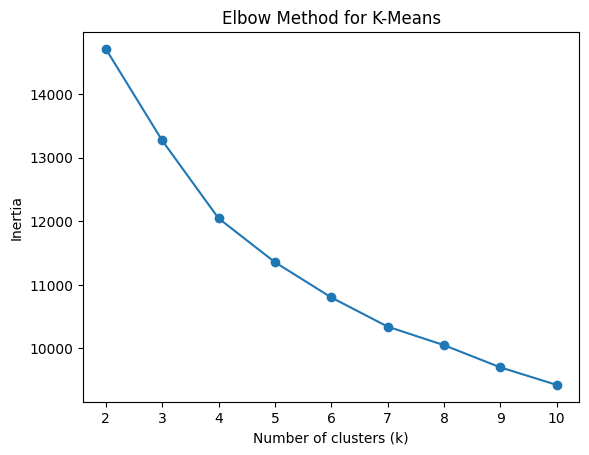

In [ ]:
# Plot inertia vs. number of clusters (k) to identify the optimal k using the Elbow Method.
plt.figure()
plt.plot(combined_kmeans_results_df['k'], combined_kmeans_results_df['inertia'], marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for K-Means')
plt.show()

In [ ]:
# Highest Silhouette Score
best_silhouette_idx = combined_kmeans_results_df['silhouette_score'].idxmax()
best_silhouette = combined_kmeans_results_df.loc[best_silhouette_idx, ['k', 'silhouette_score']]

# Lowest Davies-Bouldin Index
best_dbi_idx = combined_kmeans_results_df['davies_bouldin_index'].idxmin()
best_dbi = combined_kmeans_results_df.loc[best_dbi_idx, ['k', 'davies_bouldin_index']]

# Highest Calinski-Harabasz Index
best_chi_idx =combined_kmeans_results_df['calinski_harabasz_index'].idxmax()
best_chi = combined_kmeans_results_df.loc[best_chi_idx, ['k', 'calinski_harabasz_index']]

# Print results
print(f"Best Silhouette Score: {best_silhouette['silhouette_score']:.6f} at k = {best_silhouette['k']}")
print(f"Best Davies-Bouldin Index: {best_dbi['davies_bouldin_index']:.6f} at k = {best_dbi['k']}")
print(f"Best Calinski-Harabasz Index: {best_chi['calinski_harabasz_index']:.6f} at k = {best_chi['k']}")

Best Silhouette Score: 0.230752 at k = 2.0
Best Davies-Bouldin Index: 1.787545 at k = 5.0
Best Calinski-Harabasz Index: 100.757216 at k = 2.0


**Inertia**
- It measures the sum of  squared  distances between each point and its assigned cluster center. It always decreases where there are more clusters.
- Lower inertia is better. This means points are closer to ther cluster center
<br>

**Silhouette Score**
- It measures how similar a point is to its own cluster compared to other clusters, and higher score is better.
- Score close to 1: Good clustering (Clusters are dense and well separated).
- Score around 0.3-0.5: Moderate clustering (Clusters are reasonably distinct, but there is some overlap).
- Score lower than 0.3: Poor clustering (Clusters overlap significantly, which indicates that the chosen number of k is too high or the variables are not well suited for clustering).
<br>

**Davies-Bouldin Index (DBI)**
- It measures how similar each cluster is to its most similar cluster based on the ratio of within-cluster distances to between-cluster distances.
- Lower index (Close to 0) is better. This means clusters are dense and well separated.
<br>

**Calinski-Harabasz Index (CHI)**
- It measures the ratio of between-cluster variance to within-cluster variance.
- Higher index (No upper limit) is better. This means clusters are dense and well separated.

**Interpretation**
- Using the elbow method (inertia), we look for the point where inertia decreases slow down significantly. The biggest drop is between k=2 and k=4, then a moderate drop from k=4 to k=5 and very small drops after that. Thus, based on the elbow method, k=4 or 5.

- Based on Silhouette score, the highest value (0.231) is at k=2, which provides the best clustering. Then, the second highest value (0.171) is at k=5.

- Based on Davies-Bouldin Index (DBI), the lowest value (2.008) is at k=2, which provides the best clustering. Then, the second lowest value (1.788) is at k=5.

- Based on Calinski-Harabasz Index (CHI), the highest value (100.757) is at k=2, which provides the strongest clustering. Then, the second lowest value (99.695) is at k=4.

- The best k is 5 based on the elbow method and the combination of validation metrics (highest Silhouette score, lowest Davies-Bouldin Index and fourth highest Calinski-Harabasz Index), as k=2 is too simple to capture cluster structure and identify more subtle behaviours.

In [ ]:
# Create a copy of the dataset to add K-Means cluster labels based on combined variables.
# This copy can be used to include pca and t-sne columns for visualisations later.
combined_kmeans_cluster_df = household_profile_df.copy()

In [ ]:
# Fit final K-Means model using k=4
final_k = 5
kmeans_final = KMeans(n_clusters=final_k, random_state=42, n_init=50)
cluster_labels = kmeans_final.fit_predict(combined_array)

# Add cluster labels to the combined_kmeans_cluster_df
combined_kmeans_cluster_df['cluster'] = cluster_labels + 1

# Calculate validation metrics for k=4
sil_score = silhouette_score(combined_pca, cluster_labels)
dbi_score = davies_bouldin_score(combined_pca, cluster_labels)
chi_score = calinski_harabasz_score(combined_pca, cluster_labels)

# Print results
print(f"Silhouette Score for k={final_k}: {sil_score:.6f}")
print(f"Davies-Bouldin Index for k={final_k}: {dbi_score:.6f}")
print(f"Calinski-Harabasz Index for k={final_k}: {chi_score:.6f}")

# Display first 5 rows with cluster labels
combined_kmeans_cluster_df.head(5)

Silhouette Score for k=5: 0.169778
Davies-Bouldin Index for k=5: 1.784607
Calinski-Harabasz Index for k=5: 91.289587


,household_key,age_encoded,income_encoded,household_size_encoded,kid_category_encoded,recency,frequency,monetary,retail_discount_mean,retail_discount_usage_proportion,retail_discount_no_usage_proportion,coupon_discount_mean,coupon_discount_usage_proportion,coupon_discount_no_usage_proportion,did_not_receive_campaign_and_no_coupons_proportion,received_campaign_and_16_coupons_proportion,received_campaign_and_all_coupons_proportion,afternoon_proportion,evening_proportion,midnight_proportion,morning_proportion,night_proportion,national_proportion,private_proportion,alcohol_proportion,deli & bakery_proportion,entertainment & leisure_proportion,general_grocery_proportion,health_personal_care_proportion,home & lifestyle_proportion,meat_proportion,miscellaneous & services_proportion,produce_proportion,seafood_proportion,inverse_age_encoded,inverse_income_encoded,inverse_household_size_encoded,inverse_kid_category_encoded,inverse_recency,inverse_frequency,inverse_monetary,inverse_retail_discount_mean,inverse_retail_discount_usage_proportion,inverse_retail_discount_no_usage_proportion,inverse_coupon_discount_mean,inverse_coupon_discount_usage_proportion,inverse_coupon_discount_no_usage_proportion,inverse_did_not_receive_campaign_and_no_coupons_proportion,inverse_received_campaign_and_16_coupons_proportion,inverse_received_campaign_and_all_coupons_proportion,inverse_afternoon_proportion,inverse_evening_proportion,inverse_midnight_proportion,inverse_morning_proportion,inverse_night_proportion,inverse_national_proportion,inverse_private_proportion,inverse_alcohol_proportion,inverse_deli & bakery_proportion,inverse_entertainment & leisure_proportion,inverse_general_grocery_proportion,inverse_health_personal_care_proportion,inverse_home & lifestyle_proportion,inverse_meat_proportion,inverse_miscellaneous & services_proportion,inverse_produce_proportion,inverse_seafood_proportion,cluster
0,1,2.0,-0.333333,0.0,0.0,0.489861,-0.621099,-0.087203,-0.549338,-0.459021,0.459021,1.583771,1.120307,-1.120307,-0.129775,-0.138096,0.078206,1.292766,0.634063,0.139677,1.560290,-3.865000,1.501936,-1.501936,0.041404,1.277385,0.053773,0.895717,0.950963,0.090203,0.724057,0.511598,0.932404,-3.621881,65+,35-49K,2,0,5.0,86.0,4330.16,0.403613,0.439490,0.560510,0.015142,0.061378,0.938622,0.549508,0.286624,0.163868,0.612622,0.101911,1.000000e-06,0.285466,1.000000e-06,0.882455,0.117545,1.000000e-06,0.066589,1.000000e-06,0.658944,0.110017,0.000579,0.064852,0.008686,0.090330,1.000000e-06,3
1,7,0.0,0.000000,0.0,0.0,0.000000,-1.136685,-0.358394,-0.737420,-0.420944,0.420944,0.823167,0.572751,-0.572751,0.008514,-0.613512,0.083732,0.365092,0.273008,-0.139884,-0.667486,1.044168,-0.803241,0.803241,-0.068422,0.250714,-0.057319,0.367726,0.847179,0.043339,0.057966,-0.238082,0.445438,-0.495107,45-54,50-74K,2,0,2.0,59.0,3400.05,0.375202,0.444012,0.555988,0.004005,0.020995,0.979005,0.744946,0.122862,0.132193,0.541213,0.330482,1.000000e-06,0.010886,1.174182e-01,0.598756,0.401244,1.000000e-06,0.031882,1.000000e-06,0.645411,0.174183,0.000778,0.048989,0.004666,0.093312,7.776034e-04,4
2,8,-2.0,-0.666667,0.5,1.0,0.489861,-0.263006,0.192638,0.216292,0.127897,-0.127897,0.053112,0.298768,-0.298768,-0.147119,-0.164463,0.093260,-0.190946,0.131973,-0.212785,0.385384,0.814867,0.309949,-0.309949,1.189880,-0.578625,-0.289342,-0.635065,-0.699947,0.196379,-0.616372,-0.611474,-0.754490,-0.268544,25-34,25-34K,3,1,5.0,113.0,5534.97,0.544871,0.509853,0.490147,0.000935,0.012127,0.987873,0.527539,0.285498,0.186963,0.264780,0.409297,1.000000e-06,0.204143,1.217786e-01,0.765033,0.234967,2.526526e-03,0.036887,1.000000e-06,0.692268,0.099040,0.006569,0.068722,0.008590,0.081354,4.042442e-03,4
3,13,-2.0,0.333333,1.0,2.0,0.000000,0.815617,1.220412,0.796188,0.198222,-0.198222,1.662848,1.516420,-1.516420,-0.183852,-0.101691,0.103422,-0.828289,-0.569294,0.782034,-0.353158,-0.313182,-0.181600,0.181600,-0.129866,-0.573550,-0.119470,0.077653,0.626571,0.156368,-0.418512,1.215299,-0.426007,-0.049511,25-34,75-99K,4,2,2.0,27

In [ ]:
# Columns of interest
combined_cols_of_interest = [
    'inverse_frequency',
    'inverse_recency',
    'inverse_monetary',
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded',
    'inverse_retail_discount_mean',
    'inverse_retail_discount_usage_proportion',
    'inverse_retail_discount_no_usage_proportion',
    'inverse_coupon_discount_mean',
    'inverse_coupon_discount_usage_proportion',
    'inverse_coupon_discount_no_usage_proportion',
    'inverse_did_not_receive_campaign_and_no_coupons_proportion',
    'inverse_received_campaign_and_16_coupons_proportion',
    'inverse_received_campaign_and_all_coupons_proportion',
    'inverse_afternoon_proportion',
    'inverse_evening_proportion',
    'inverse_midnight_proportion',
    'inverse_morning_proportion',
    'inverse_night_proportion',
    'inverse_national_proportion',
    'inverse_private_proportion',
    'inverse_alcohol_proportion',
    'inverse_deli & bakery_proportion',
    'inverse_entertainment & leisure_proportion',
    'inverse_general_grocery_proportion',
    'inverse_health_personal_care_proportion',
    'inverse_home & lifestyle_proportion',
    'inverse_meat_proportion',
    'inverse_miscellaneous & services_proportion',
    'inverse_produce_proportion',
    'inverse_seafood_proportion'
]

# Categorical encoded columns to take mode
categorical_cols = [
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded'
]

# List to store cluster summaries
combined_kmeans_cluster_summary = []

# Loop through clusters
for cluster, cluster_df in combined_kmeans_cluster_df.groupby('cluster'):
    cluster_summary = {'cluster': cluster, 'count': len(cluster_df)}

    for col in combined_cols_of_interest:
        if col in categorical_cols:
            # Mode for categorical variables
            cluster_summary[f'{col}_mode'] = cluster_df[col].mode()[0]
        else:
            # Median for numerical/proportional variables
            cluster_summary[f'{col}_median'] = cluster_df[col].median()

    combined_kmeans_cluster_summary.append(cluster_summary)

# Convert list of summaries to DataFrame
combined_kmeans_cluster_summary = pd.DataFrame(combined_kmeans_cluster_summary)

# Display the summary
combined_kmeans_cluster_summary

,cluster,count,inverse_frequency_median,inverse_recency_median,inverse_monetary_median,inverse_age_encoded_mode,inverse_income_encoded_mode,inverse_household_size_encoded_mode,inverse_kid_category_encoded_mode,inverse_retail_discount_mean_median,inverse_retail_discount_usage_proportion_median,inverse_retail_discount_no_usage_proportion_median,inverse_coupon_discount_mean_median,inverse_coupon_discount_usage_proportion_median,inverse_coupon_discount_no_usage_proportion_median,inverse_did_not_receive_campaign_and_no_coupons_proportion_median,inverse_received_campaign_and_16_coupons_proportion_median,inverse_received_campaign_and_all_coupons_proportion_median,inverse_afternoon_proportion_median,inverse_evening_proportion_median,inverse_midnight_proportion_median,inverse_morning_proportion_median,inverse_night_proportion_median,inverse_national_proportion_median,inverse_private_proportion_median,inverse_alcohol_proportion_median,inverse_deli & bakery_proportion_median,inverse_entertainment & leisure_proportion_median,inverse_general_grocery_proportion_median,inverse_health_personal_care_proportion_median,inverse_home & lifestyle_proportion_median,inverse_meat_proportion_median,inverse_miscellaneous & services_proportion_median,inverse_produce_proportion_median,inverse_seafood_proportion_median
0,1,86,137.5,3.0,3691.655,45-54,50-74K,2,0,0.493299,0.507679,0.492321,0.000660,0.009174,0.990826,0.666892,0.246166,3.594318e-02,0.348569,0.377279,2.535364e-04,0.097926,7.319559e-02,0.733365,0.266635,0.000001,0.036030,0.000001,0.654251,0.131976,0.000894,0.059787,0.013044,0.066819,1.000000e-06
1,2,138,104.0,5.0,2933.835,45-54,50-74K,2,0,0.531569,0.504593,0.495407,0.000430,0.005208,0.994792,0.821255,0.178744,1.000000e-06,0.382656,0.344696,1.000000e-06,0.108449,6.033290e-02,0.712425,0.287575,0.000001,0.040676,0.000001,0.630992,0.093208,0.000880,0.080722,0.010260,0.097542,5.830019e-03
2,3,79,112.0,2.0,3508.580,65+,35-49K,2,0,0.489091,0.473824,0.526176,0.001903,0.013503,0.986497,0.713259,0.243882,4.388715e-02,0.536210,0.114391,1.000000e-06,0.251194,1.000000e-06,0.708333,0.291667,0.000001,0.044561,0.000001,0.621212,0.094365,0.000752,0.068754,0.009901,0.114583,3.030297e-03
3,4,445,170.0,2.0,5980.720,45-54,50-74K,2,0,0.504981,0.498396,0.501604,0.001057,0.007391,0.992609,0.613835,0.254799,1.234240e-01,0.388036,0.352394,1.000000e-06,0.113668,5.171569e-02,0.728602,0.271398,0.000001,0.035294,0.000001,0.638598,0.115925,0.001442,0.070809,0.013203,0.093377,4.214465e-03
4,5,53,113.0,4.0,2808.910,45-54,35-49K,1,0,0.448791,0.456490,0.543510,0.000000,0.000001,0.999999,0.803735,0.190031,2.023988e-02,0.308383,0.340599,1.000000e-06,0.111688,8.154498e-02,0.730245,0.269755,0.000001,0.036420,0.000001,0.642428,0.124563,0.000549,0.075959,0.004405,0.084326,3.115259e-03


In [ ]:
# Define Eta squared function
def eta_squared(df, variable, cluster_col='cluster', noise_cluster=0):
    """
    Compute eta-squared for a single variable, excluding the noise cluster.
    Eta-squared = Between-cluster SS / Total SS
    """
    # Exclude noise cluster
    df_valid = df[df[cluster_col] != noise_cluster]

    # To ensure statistical validity
    if df_valid[cluster_col].nunique() < 2:
        return float('nan')

    # Diagnostic print to check type of df_valid
    # print(f"Type of df_valid before indexing: {type(df_valid)}")

    grand_mean = df_valid[variable].mean()

    # Between-cluster sum of squares
    ss_between = sum(
        df_valid.groupby(cluster_col)[variable].count() *
        (df_valid.groupby(cluster_col)[variable].mean() - grand_mean) ** 2
    )

    # Total sum of squares
    ss_total = sum((df_valid[variable] - grand_mean) ** 2)

    eta2 = ss_between / ss_total if ss_total != 0 else float('nan')
    return eta2

# Columns to exclude (categorical encoded variables)
categorical_cols = [
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded'
]

# Numerical/proportional variables only
numerical_cols = [col for col in combined_cols_of_interest if col not in categorical_cols]

# Compute eta-squared for each numerical variable
combined_kmeans_eta_results = {var: eta_squared(combined_kmeans_cluster_df, var) for var in numerical_cols}

# Convert to DataFrame for display
combined_kmeans_eta_df = pd.DataFrame.from_dict(combined_kmeans_eta_results, orient='index', columns=['eta_squared'])

# Sort eta-squared results in descending order
combined_kmeans_eta_df_sorted = combined_kmeans_eta_df.sort_values(by='eta_squared', ascending=False)

# Display sorted results
combined_kmeans_eta_df_sorted

,eta_squared
inverse_received_campaign_and_all_coupons_proportion,0.346306
inverse_did_not_receive_campaign_and_no_coupons_proportion,0.271762
inverse_monetary,0.204730
inverse_evening_proportion,0.123752
inverse_morning_proportion,0.107262
inverse_night_proportion,0.101625
inverse_frequency,0.097634
inverse_seafood_proportion,0.090941
inverse_received_campaign_and_16_coupons_proportion,0.079546
inverse_afternoon_proportion,0.077785


In [ ]:
# Define Cramer's V function
def cramers_v(x, y, noise_cluster=0):
    """
    Compute Cramér's V statistic for association between cluster label variables (1, 2, 3, 4, 5)
    and demographic variables (inverse_age_encoded_mode, inverse_income_encoded_mode, etc.),
    excluding the noise cluster.
    """
    # Exclude noise cluster
    mask = x != noise_cluster
    x_valid = x[mask]
    y_valid = y[mask]

    # Build contingency table
    contingency_table = pd.crosstab(x_valid, y_valid)

    # Chi-squared test
    chi2, _, _, _ = chi2_contingency(contingency_table)

    n = contingency_table.sum().sum()
    r, k = contingency_table.shape

    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Categorical variables to check
categorical_cols = [
    'inverse_age_encoded',
    'inverse_income_encoded',
    'inverse_household_size_encoded',
    'inverse_kid_category_encoded'
]

# Calculate Cramér's V for each categorical variable
categorical_cramers_v_results = []

for col in categorical_cols:
    v = cramers_v(combined_kmeans_cluster_df[col],
                  combined_kmeans_cluster_df['cluster'])
    categorical_cramers_v_results.append({'variable': col, 'cramers_v': v})

# Convert to DataFrame
categorical_cramers_v_df = pd.DataFrame(categorical_cramers_v_results)

# Sort descending by association strength
categorical_cramers_v_df = categorical_cramers_v_df.sort_values(by='cramers_v', ascending=False)

categorical_cramers_v_df

,variable,cramers_v
0,inverse_age_encoded,0.176720
1,inverse_income_encoded,0.115728
3,inverse_kid_category_encoded,0.087200
2,inverse_household_size_encoded,0.078667


In [ ]:
# Calculate and display the proportion of customers in each cluster to check cluster balance
combined_kmeans_cluster_proportion = combined_kmeans_cluster_df['cluster'].value_counts(normalize=True).sort_index()
print(combined_kmeans_cluster_proportion)

cluster
1    0.107366
2    0.172285
3    0.098627
4    0.555556
5    0.066167
Name: proportion, dtype: float64


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Features (all columns except the cluster label)
X = combined_kmeans_cluster_df.drop(columns=['household_key', 'cluster'])

# --- Drop columns starting with 'inverse' ---
X = X.loc[:, ~X.columns.str.startswith('inverse')]

# Target (cluster labels)
y = combined_kmeans_cluster_df['cluster']

In [ ]:
rf = RandomForestClassifier(
    n_estimators=500,      # more trees → more stable importance
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'
)
rf.fit(X, y)

RandomForestClassifier(class_weight='balanced', n_estimators=500, n_jobs=-1,
                       random_state=42)

In [ ]:
import pandas as pd

# Get feature importances
feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})

# Sort descending
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Display top 10 features
feature_importances.head(40)

,feature,importance
32,seafood_proportion,0.130473
12,coupon_discount_no_usage_proportion,0.112902
11,coupon_discount_usage_proportion,0.102704
20,night_proportion,0.095939
16,afternoon_proportion,0.071806
15,received_campaign_and_all_coupons_proportion,0.066672
19,morning_proportion,0.057041
13,did_not_receive_campaign_and_no_coupons_propor...,0.053337
14,received_campaign_and_16_coupons_proportion,0.050188
10,coupon_discount_mean,0.023227
